# Telecom Churn Case Study

In [1]:
# Importing all required packages & set global options
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import xgboost as xgb

%matplotlib inline
pd.set_option('display.max_columns', 500)
warnings.filterwarnings(action='ignore')

from imblearn.under_sampling import ClusterCentroids
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import IncrementalPCA
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from xgboost.sklearn import XGBClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
import statsmodels.api as sm 
from statsmodels.stats.outliers_influence import variance_inflation_factor

/Users/stray/miniconda3/lib/python3.7/site-packages/sklearn/utils/__init__.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Sequence
/Users/stray/miniconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:18: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable
/Users/stray/miniconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:16: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Mapping, namedtuple, defaultdict, Sequence


In [2]:
# Import Dataset into Python
data = pd.read_csv('./telecom_churn_data.csv')

In [3]:
# Skim through the data
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [4]:
data.shape

(99999, 226)

# Apply Business Filters
- Filter high-value customers based on business rule
- "Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months"

In [5]:
# Look for recharge amount
data.filter(regex='rech').columns

Index(['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_num_9', 'total_rech_amt_6', 'total_rech_amt_7',
       'total_rech_amt_8', 'total_rech_amt_9', 'max_rech_amt_6',
       'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_amt_9',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_9', 'date_of_last_rech_data_6',
       'date_of_last_rech_data_7', 'date_of_last_rech_data_8',
       'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6',
       'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
       'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6',
       'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9'],
      dtype='object')

In [6]:
# Upon inspection, it's clear that filter mentioned above must be based on 'total recharge amount'

# Look for missing values in total recharge amount columns
data[['total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_rech_amt_9']].isnull().sum()

total_rech_amt_6    0
total_rech_amt_7    0
total_rech_amt_8    0
total_rech_amt_9    0
dtype: int64

In [7]:
# No missing values, so business filter application possible

# Get high-value cutoff -- i.e. 70th pctl of average recharge amounts in first two months
np.percentile((data.total_rech_amt_6 + data.total_rech_amt_7)/2, 70)

368.5

In [8]:
# Retain only high-value customers
hvc_data = data[(data.total_rech_amt_6 + data.total_rech_amt_7)/2 > 368.5]

In [9]:
# Check that there are ~ 29.9k customers post filter
hvc_data.shape

(29979, 226)

# Tag Churned Customers
- "Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase"

In [10]:
# Check that columns needed for churn tag have no missing values
hvc_data[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].isnull().sum()

total_ic_mou_9    0
total_og_mou_9    0
vol_2g_mb_9       0
vol_3g_mb_9       0
dtype: int64

In [11]:
# Initialise Churn Tags
hvc_data['Churned'] = 0

# Modify Churn Tag based on Business Definition
hvc_data['Churned'][(hvc_data['total_ic_mou_9'] == 0) & (hvc_data['total_og_mou_9'] == 0) &
                    (hvc_data['vol_2g_mb_9'] == 0) & (hvc_data['vol_3g_mb_9'] == 0)] = 1

In [12]:
# Review overall Churn Rate (i.e. proportion of Churned Customers among total customers)
overall_churn_rate = np.round(hvc_data['Churned'].sum()/len(hvc_data)*100, 2)
overall_churn_rate

8.64

# Start Data Prep

In [13]:
# Check for missing values
miss = pd.DataFrame(hvc_data.isnull().sum()/len(hvc_data)*100, columns=['miss_pct'])

# Get columns with 10+% missing values
gt_10pct_miss = miss[miss.miss_pct >= 10]
gt_10pct_miss

,miss_pct
date_of_last_rech_data_6,62.016745
date_of_last_rech_data_7,61.132793
date_of_last_rech_data_8,60.835918
date_of_last_rech_data_9,61.816605
total_rech_data_6,62.016745
total_rech_data_7,61.132793
total_rech_data_8,60.835918
total_rech_data_9,61.816605
max_rech_data_6,62.016745
max_rech_data_7,61.132793


In [14]:
# Upon inspection, all columns with more than 10% missing values have 60+% missing data, so remove them
hvc_data.drop(gt_10pct_miss.index, axis=1, inplace=True)
hvc_data.shape

(29979, 187)

In [15]:
# Drop all columns ending with _9 -- these are columns with customer data in the 'churn' phase -- this is irrelevant for analysis

hvc_data.drop(hvc_data.filter(regex='_9$').columns, axis=1, inplace=True)
hvc_data.shape

(29979, 143)

# Conduct Exploratory Data Analysis

In [16]:
# Check that categorical columns they have non-trivial data (i.e more than 1 levels each)

# Get list of categorical columns
hvc_data.select_dtypes(include = 'object').columns

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'],
      dtype='object')

In [17]:
# Check values in each of the categorical columns

for i in range(len(hvc_data.select_dtypes(include = 'object').columns)):
    colname = hvc_data.select_dtypes(include = 'object').columns[i]
    print(hvc_data[[colname]].iloc[:,0].value_counts())

6/30/2014    29979
Name: last_date_of_month_6, dtype: int64
7/31/2014    29948
Name: last_date_of_month_7, dtype: int64
8/31/2014    29822
Name: last_date_of_month_8, dtype: int64
6/30/2014    8715
6/29/2014    5579
6/28/2014    3713
6/27/2014    3241
6/26/2014    1837
6/25/2014    1312
6/24/2014    1077
6/23/2014     707
6/21/2014     586
6/22/2014     520
6/14/2014     467
6/20/2014     353
6/19/2014     350
6/17/2014     349
6/18/2014     301
6/16/2014     170
6/12/2014     128
6/13/2014     118
6/15/2014     116
6/11/2014      72
6/8/2014       42
6/7/2014       32
6/10/2014      29
6/5/2014       20
6/9/2014       19
6/3/2014       18
6/4/2014       15
6/2/2014       12
6/1/2014       11
6/6/2014        8
Name: date_of_last_rech_6, dtype: int64
7/31/2014    7920
7/30/2014    5351
7/29/2014    3471
7/28/2014    2860
7/25/2014    2115
7/27/2014    1739
7/26/2014    1658
7/24/2014     867
7/22/2014     608
7/23/2014     563
7/16/2014     398
7/21/2014     373
7/20/2014     360
7/15/2

In [18]:
# Drop all last date of month columns -- they are not predictive

hvc_data.drop(hvc_data.select_dtypes(include = 'object').columns[0:3], axis=1, inplace=True)
hvc_data.shape

(29979, 140)

In [19]:
# Treat missing values in remaining date columns

# First check if removing customers with missing date values will make a large difference, by seeing contribution of these missing customers to overall churn rate
print(hvc_data[['Churned']][hvc_data.date_of_last_rech_6.isnull()].sum()/len(hvc_data)*100)
print(hvc_data[['Churned']][hvc_data.date_of_last_rech_7.isnull()].sum()/len(hvc_data)*100)
print(hvc_data[['Churned']][hvc_data.date_of_last_rech_8.isnull()].sum()/len(hvc_data)*100)

# Turns out that removing these customers would be sub-optimal, since contribution is significant!
# Different treatment required

Churned    0.060042
dtype: float64
Churned    0.196804
dtype: float64
Churned    1.02405
dtype: float64


In [20]:
# Retain only day-of-month variable from the date of last recharge each month

hvc_data[['date_of_last_rech_6']] = \
    hvc_data[['date_of_last_rech_6']].iloc[:,0].str[2:4] # try to extract date only
hvc_data[['date_of_last_rech_6']] = \
    hvc_data[['date_of_last_rech_6']].iloc[:,0].str.strip('/') # in case the '/' character remains, delete
hvc_data[['date_of_last_rech_6']] = \
    hvc_data[['date_of_last_rech_6']].fillna(0) # treat missing values; try by imputing 0 to indicate that recharge was not at all done in the month
hvc_data[['date_of_last_rech_6']] = \
    hvc_data[['date_of_last_rech_6']].astype(int) # change data type only

hvc_data[['date_of_last_rech_7']] = \
    hvc_data[['date_of_last_rech_7']].iloc[:,0].str[2:4] # try to extract date only
hvc_data[['date_of_last_rech_7']] = \
    hvc_data[['date_of_last_rech_7']].iloc[:,0].str.strip('/') # in case the '/' character remains, delete
hvc_data[['date_of_last_rech_7']] = \
    hvc_data[['date_of_last_rech_7']].fillna(0) # treat missing values; try by imputing 0 to indicate that recharge was not at all done in the month
hvc_data[['date_of_last_rech_7']] = \
    hvc_data[['date_of_last_rech_7']].astype(int) # change data type only

hvc_data[['date_of_last_rech_8']] = \
    hvc_data[['date_of_last_rech_8']].iloc[:,0].str[2:4] # try to extract date only
hvc_data[['date_of_last_rech_8']] = \
    hvc_data[['date_of_last_rech_8']].iloc[:,0].str.strip('/') # in case the '/' character remains, delete
hvc_data[['date_of_last_rech_8']] = \
    hvc_data[['date_of_last_rech_8']].fillna(0) # treat missing values; try by imputing 0 to indicate that recharge was not at all done in the month
hvc_data[['date_of_last_rech_8']] = \
    hvc_data[['date_of_last_rech_8']].astype(int) # change data type only

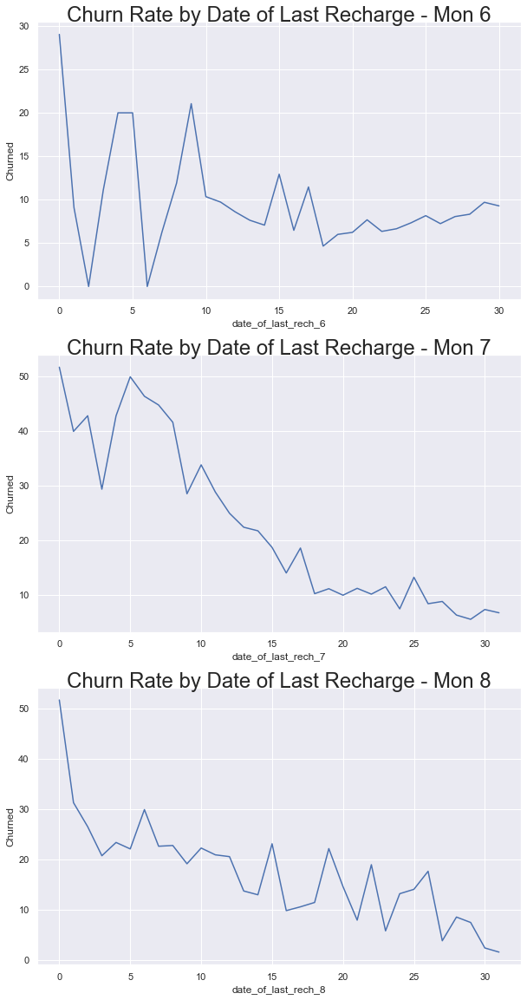

In [21]:
# Check whether it's a good idea to have imputed missing dates with 0

# Review Churn Rate by Date of Last Recharge in months 6, 7, 8

churn_last_rech_6 = hvc_data.groupby('date_of_last_rech_6').Churned.sum() / \
    hvc_data.groupby('date_of_last_rech_6').Churned.count() * 100
churn_last_rech_7 = hvc_data.groupby('date_of_last_rech_7').Churned.sum() / \
    hvc_data.groupby('date_of_last_rech_7').Churned.count() * 100
churn_last_rech_8 = hvc_data.groupby('date_of_last_rech_8').Churned.sum() / \
    hvc_data.groupby('date_of_last_rech_8').Churned.count() * 100

# Plot Relationship between Churn Rate and Data of Last Recharge in months 6, 7, 8
sns.set(rc={'figure.figsize':(10,20)})
#sns.set(font_scale=2)

plt.subplot(3, 1, 1)
g = sns.lineplot(x = churn_last_rech_6.index, y = churn_last_rech_6)
g.text(0.5, 1, "Churn Rate by Date of Last Recharge - Mon 6", size=24, ha="center", transform=g.transAxes)

plt.subplot(3, 1, 2)
g = sns.lineplot(x = churn_last_rech_7.index, y = churn_last_rech_7)
g.text(0.5, 1, "Churn Rate by Date of Last Recharge - Mon 7", size=24, ha="center", transform=g.transAxes)

plt.subplot(3, 1, 3)
g = sns.lineplot(x = churn_last_rech_8.index, y = churn_last_rech_8)
g.text(0.5, 1, "Churn Rate by Date of Last Recharge - Mon 8", size=24, ha="center", transform=g.transAxes)

plt.show()

# Plots show that 0 is indeed a good choice
# Customers with missing date of last recharge in months 6, 7, 8 have highest churn rate
# This makes business sense also -- missing data may represent no recharge in a month

In [22]:
# Remove columns with only one unique value
hvc_data.drop(hvc_data.columns[hvc_data.std() == 0], axis = 1, inplace = True)

In [23]:
# Also remove mobile number -- this is a unique identifier with no churn predictive value
hvc_data.drop('mobile_number', axis = 1, inplace = True)

In [24]:
# Review remaining columns
hvc_data.describe()

# All variables are now numeric

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Churned
count,29979.000000,29979.000000,29979.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.00000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.00000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29979.000000,29979.000000,29979.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29979.000000,29979.000000,29979.000000,29663.000000,29676.000000,29041.00000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.00000
mean,587.587624,589.424681,535.067748,299.392147,307.701888,276.459159,422.582059,428.433657,387.277278,17.613734,13.673468,13.691460,29.66101,22.281627,22.177442,95.742759,96.765436,90.000551,183.268532,183.174937,173.030627,7.053548,7.172642,6.705906,1.584424,1.882820,1.769414,286.073738,287.122076,269.745785,191.914956,202.103541,177.922163,205.376377,215.696797,185.468308,2.033503,2.05668,1.848781,399.329215,419.861391,365.243279,2.290991,2.230369,2.095

In [25]:
# Outlier Treatment

# Get interquartile range for each column; cap outliers with +/- 1.5 x IQR logic
col_list_except_churned = list(hvc_data.columns)
col_list_except_churned.remove('Churned')

for i in col_list_except_churned:
    
        
    max_value = (hvc_data[i].describe())['max']
    min_value = (hvc_data[i].describe())['min']
    p25 = np.percentile(hvc_data[i], 25)
    p75 = np.percentile(hvc_data[i], 75)    
    
    while max_value > (p75 + 1.5 * (p75-p25)) or min_value < p25 - 1.5 * (p75-p25):
        
        hvc_data[i][hvc_data[i] > (p75 + 1.5 * (p75-p25))] = p75 + 1.5 * (p75-p25)
        hvc_data[i][hvc_data[i] < (p25 - 1.5 * (p75-p25))] = p25 - 1.5 * (p75-p25)
        
        max_value = (hvc_data[i].describe())['max']
        min_value = (hvc_data[i].describe())['min']
        p25 = np.percentile(hvc_data[i], 25)
        p75 = np.percentile(hvc_data[i], 75)          

In [26]:
# Missing Values Treatment
col_list_except_churned = list(hvc_data.columns)
col_list_except_churned.remove('Churned')

for i in col_list_except_churned:
    hvc_data[i] = hvc_data[i].fillna(hvc_data[i].mean())

In [27]:
# Post Outlier/Missing Value Treatmnent, remove columns with only one unique value
hvc_data.drop(hvc_data.columns[hvc_data.std() == 0], axis = 1, inplace = True)

# Proceed with EDA

In [28]:
# Review Shape
hvc_data.shape

(29979, 113)

In [29]:
# Given large number of columns + business judgment that month 6, 7 represent 'happy' phase
# Choose one variable to represent both 6 and 7 months, drop the individual 6/7 moth variables
list_cols_mon_6 = hvc_data.filter(regex='_6$').columns

for i in list_cols_mon_6:
    j = re.sub("_6$","_7",i)
    
    if j in hvc_data.columns:
        k = re.sub("_6$","_67",i)
        hvc_data[k] = (hvc_data[i] + hvc_data[j])/2
        hvc_data.drop([i,j], axis=1, inplace=True)

In [30]:
# Review Dataset Shape
hvc_data.shape

(29979, 77)

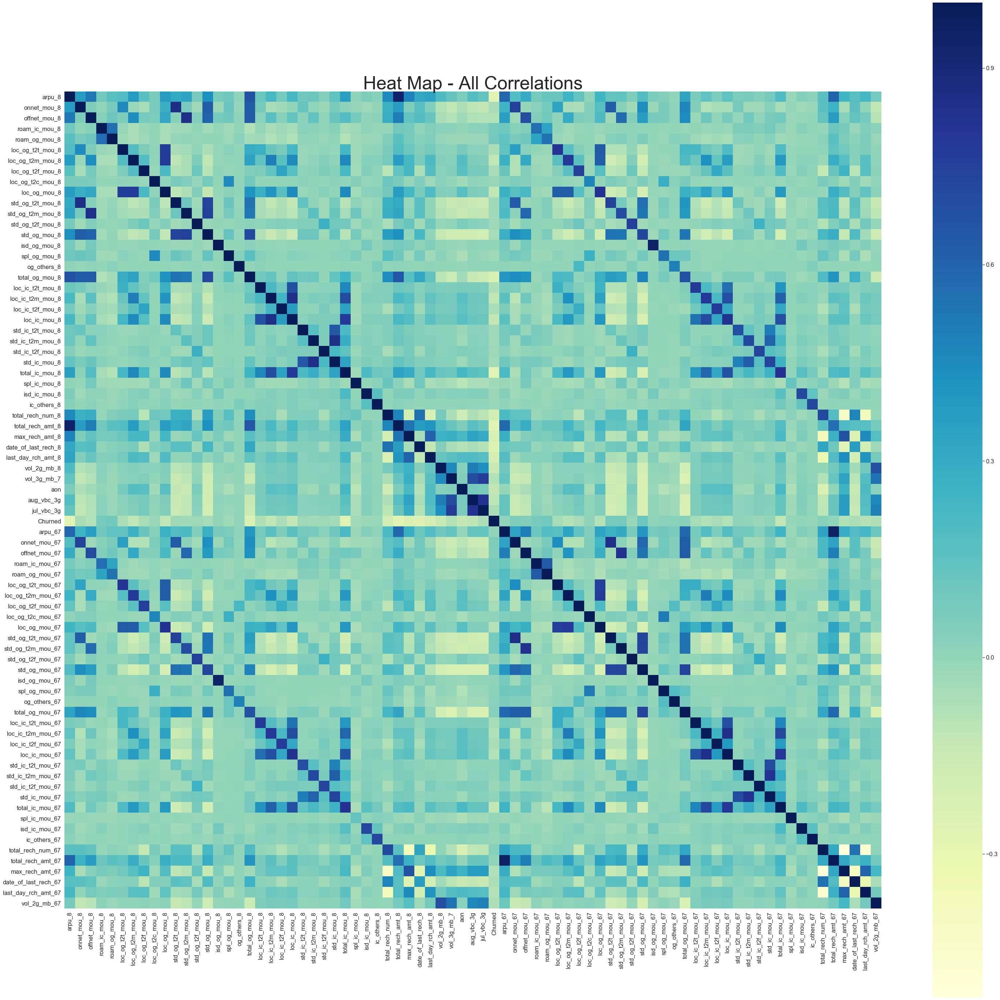

In [31]:
# Correlation Matrix
sns.set(rc={'figure.figsize':(50,50)})
sns.set(font_scale=1.5)
corr = hvc_data.corr()
#corr = corr.mask(np.tril(np.ones(corr.shape)).astype(np.bool))
g = sns.heatmap(corr, square=True, annot=False, cmap="YlGnBu")
g.set_title("Heat Map - All Correlations", y=1, x=0.5, size=50, ha="center")
plt.yticks(rotation=0)
plt.show()

In [32]:
# Notice two-diagonal dark-blue line in the correlation matrix above, parallel to the main diagonal
# These lines indicates high correl between metric value during happy phase (months 6, 7) and action phase (month 8)
# Hence unify these variables
list_cols_mon_67 = hvc_data.filter(regex='_67$').columns

for i in list_cols_mon_67:
    j = re.sub("_67$","_8",i)
    
    if j in hvc_data.columns:
        k = re.sub("_67$","",i)
        hvc_data[k] = (2*hvc_data[i] + hvc_data[j])/3 # weighted average
        hvc_data.drop([i,j], axis=1, inplace=True)

In [33]:
# Review Dataset Shape
hvc_data.shape

(29979, 41)

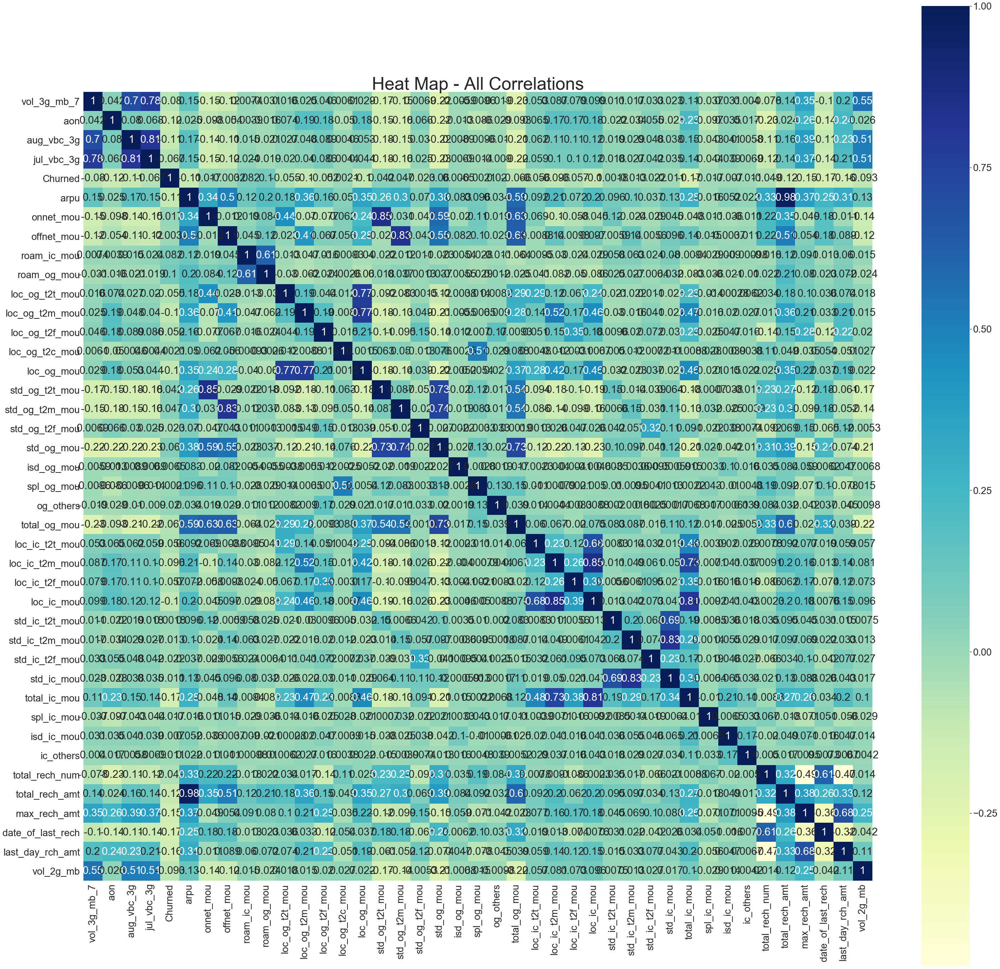

In [34]:
# Correlation Matrix
sns.set(rc={'figure.figsize':(50,50)})
sns.set(font_scale=2.5)
corr = hvc_data.corr()
#corr = corr.mask(np.tril(np.ones(corr.shape)).astype(np.bool))
g = sns.heatmap(corr, square=True, annot=True, cmap="YlGnBu")
g.set_title("Heat Map - All Correlations", y=1, x=0.5, size=50, ha="center")
plt.yticks(rotation=0)
plt.show()

In [35]:
# High Correlation between 3GVBC and 3GVolume variables; among these Jul_VBC_3G has lower correl with other variables
# Keep Jul_VBC_3G; remove others
# This also makes business sense; VBC is volume based cost and derived from volume
hvc_data.drop(['vol_3g_mb_7','aug_vbc_3g'], axis = 1, inplace = True)

# High Correlation between arpu and total_rech_amt; among these total_rech_amt has lower correl with other variables
# Keep total_rech_amt; remove arpu
# This also makes business sense; arpu is avg revenue per user and derived from user recharges in pre-paid user base
hvc_data.drop(['arpu'], axis = 1, inplace = True)

# High Correlation between onnet_mou and std_og_t2t_mou; among these std_og_t2t_mou has lower correl with other variables
# Keep std_og_t2t_mou; remove onnet_mou
# This also makes business sense; onnet_mou is derived from std_og_t2t_mou and std_og_t2m_mou
hvc_data.drop(['onnet_mou'], axis = 1, inplace = True)

# High Correlation between offnet_mou and std_og_t2m_mou; among these std_og_t2m_mou has lower correl with other variables
# Keep std_og_t2m_mou; remove offnet_mou
# This also makes business sense; removed variable derived from ones retained
hvc_data.drop(['offnet_mou'], axis = 1, inplace = True)

# High Correlation between loc_og_mou and loc_og_mou_t2t and t2m; among these loc_og_mou has higher correl with other variables
# Remove loc_og_mou; Keep others
# This also makes business sense; removed variable derived from ones retained
hvc_data.drop(['loc_og_mou'], axis = 1, inplace = True)

# High Correlation between std_og_mou and std_og_mou_t2t and t2m; among these std_og_mou has higher correl with other variables
# Remove std_og_mou; Keep others
# This also makes business sense; removed variable derived from ones retained
hvc_data.drop(['std_og_mou'], axis = 1, inplace = True)

# High Correlation between loc_ic_mou and loc_ic_mou_t2m; among these loc_ic_mou has higher correl with other variables
# Remove loc_ic_mou; Keep others
# This also makes business sense; removed variable derived from ones retained
hvc_data.drop(['loc_ic_mou'], axis = 1, inplace = True)

# High Correlation between std_ic_mou and std_ic_mou_t2m; among these std_ic_mou has higher correl with other variables
# Remove std_ic_mou; Keep others
# This also makes business sense; removed variable derived from ones retained
hvc_data.drop(['std_ic_mou'], axis = 1, inplace = True)

# High Correlation between tot_ic_mou and tot_ic_mou_t2m; among these tot_ic_mou has higher correl with other variables
# Remove tot_ic_mou; Keep others
# This also makes business sense; removed variable derived from ones retained
hvc_data.drop(['total_ic_mou'], axis = 1, inplace = True)

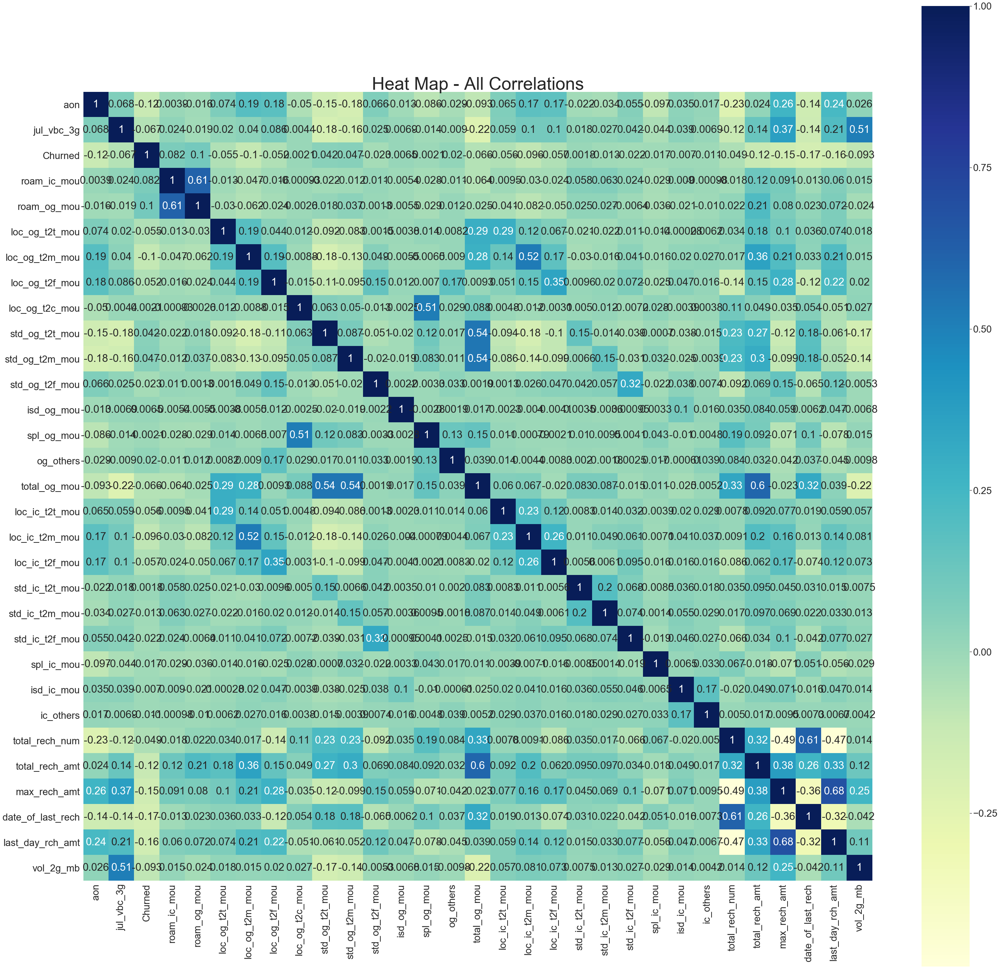

In [36]:
# Correlation Matrix
sns.set(rc={'figure.figsize':(50,50)})
sns.set(font_scale=2.5)
corr = hvc_data.corr()
#corr = corr.mask(np.tril(np.ones(corr.shape)).astype(np.bool))
g = sns.heatmap(corr, square=True, annot=True, cmap="YlGnBu")
g.set_title("Heat Map - All Correlations", y=1, x=0.5, size=50, ha="center")
plt.yticks(rotation=0)
plt.show()

# Now, our X variables are far less inter-correlated versus before

# Further Exploratory Analysis

In [37]:
# Separate X and Y variables
Y_hvc_data = hvc_data.pop('Churned')

In [38]:
# Review distributions of the variables
var_dist = hvc_data.describe()
var_dist

,aon,jul_vbc_3g,roam_ic_mou,roam_og_mou,loc_og_t2t_mou,loc_og_t2m_mou,loc_og_t2f_mou,loc_og_t2c_mou,std_og_t2t_mou,std_og_t2m_mou,std_og_t2f_mou,isd_og_mou,spl_og_mou,og_others,total_og_mou,loc_ic_t2t_mou,loc_ic_t2m_mou,loc_ic_t2f_mou,std_ic_t2t_mou,std_ic_t2m_mou,std_ic_t2f_mou,spl_ic_mou,isd_ic_mou,ic_others,total_rech_num,total_rech_amt,max_rech_amt,date_of_last_rech,last_day_rch_amt,vol_2g_mb
count,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000
mean,1264.050736,1.264417,14.992888,24.706693,94.169582,179.824699,6.977365,1.745553,190.646887,202.180494,1.979655,2.205530,6.867125,0.269943,628.267998,69.546935,160.830082,15.882195,16.345928,32.539552,2.901060,0.038065,11.932018,1.324348,10.753906,634.071756,149.227531,27.328308,89.192974,8.001353
std,974.860695,2.183823,62.277920,87.692025,220.735395,219.820757,19.934698,6.046657,372.163487,374.351739,11.180219,44.303601,17.615270,2.021867,439.729211,146.693517,200.802768,42.050648,69.580335,91.811557,18.117052,0.113436,65.130836,12.412315,6.264727,278.427137,78.032352,2.615703,60.915301,11.673828
min,180.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,246.000000,9.000000,18.666667,0.000000,0.000000
25%,480.000000,0.000000,0.000000,0.000000,13.108333,41.610000,0.000000,0.000000,0.236667,5.161667,0.000000,0.000000,0.183333,0.000000,301.231667,13.036667,45.093333,0.463333,0.153333,2.436667,0.000000,0.000000,0.000000,0.000000,6.000000,430.333333,98.000000,25.833333,40.000000,0.000000
50%,914.000000,0.000000,0.000000,0.000000,37.767586,111.556667,1.256667,0.033333,24.983333,54.816667,0.000000,0.000000,2.483333,0.000000,524.796667,33.680000,102.166667,3.656667,3.070000,10.566667,0.000000,0.000000,0.000000,0.000000,9.000000,552.666667,127.333333,28.000000,80.000000,0.000000
75%,1923.500000,2.025000,5.886667,12.605000,93.453333,237.676667,5.876667,1.460000,207.873694,232.657769,0.403333,0.000000,7.405000,0.020369,862.065000,74.127298,202.456667,13.850000,12.366667,30.178333,1.070000,0.036667,2.725000,0.425770,14.000000,768.333333,191.666667,29.333333,123.333333,14.010417
max,4088.750000,5.062500,3238.733333,3298.940000,6773.026667,4420.553333,891.280000,292.446667,7096.896667,9708.676667,407.860000,5690.826667,783.863333,240.320000,1855.223333,4708.870000,4546.080000,1293.283333,5189.926667,3963.676667,1254.993333,11.183333,3458.570000,1349.980000,27.833333,1468.833333,354.833333,30.666667,288.166667,32.545833


In [39]:
# Observe that multiple variables have max >> mean + 3*stdev; tolerate max deviance as 4*stdevs from mean

# So cap max value
for colname in var_dist.columns:

    max_val = (hvc_data[colname].describe())['max']
    mean = (hvc_data[colname].describe())['mean']
    stdev = (hvc_data[colname].describe())['std']

    while max_val > mean + 4*stdev:

        capped_max = mean + 4*stdev
        hvc_data[colname] = hvc_data[colname].apply(lambda x: capped_max if x > capped_max else x)

        max_val = (hvc_data[colname].describe())['max']
        mean = (hvc_data[colname].describe())['mean']
        stdev = (hvc_data[colname].describe())['std']

In [40]:
# Review distributions of the variables
var_dist = hvc_data.describe()
var_dist

,aon,jul_vbc_3g,roam_ic_mou,roam_og_mou,loc_og_t2t_mou,loc_og_t2m_mou,loc_og_t2f_mou,loc_og_t2c_mou,std_og_t2t_mou,std_og_t2m_mou,std_og_t2f_mou,isd_og_mou,spl_og_mou,og_others,total_og_mou,loc_ic_t2t_mou,loc_ic_t2m_mou,loc_ic_t2f_mou,std_ic_t2t_mou,std_ic_t2m_mou,std_ic_t2f_mou,spl_ic_mou,isd_ic_mou,ic_others,total_rech_num,total_rech_amt,max_rech_amt,date_of_last_rech,last_day_rch_amt,vol_2g_mb
count,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000
mean,1264.050736,1.264417,10.137224,17.995106,79.322622,174.543298,5.773725,1.398295,181.190713,190.145472,0.969782,0.205282,5.909735,0.203349,628.267998,60.601074,154.502053,13.272058,11.742707,26.204861,1.651533,0.035928,6.142383,0.666044,10.753906,634.071756,149.227531,27.328308,89.192974,8.001353
std,974.860695,2.183823,24.052353,40.849548,111.596808,189.352053,10.621479,2.721089,316.139538,303.309165,2.511785,0.612299,8.801121,0.478837,439.729211,76.205242,161.708526,23.319993,21.006952,40.641884,3.782767,0.072253,15.657361,1.541440,6.264727,278.427137,78.032352,2.615703,60.915301,11.673828
min,180.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,246.000000,9.000000,18.666667,0.000000,0.000000
25%,480.000000,0.000000,0.000000,0.000000,13.108333,41.610000,0.000000,0.000000,0.236667,5.161667,0.000000,0.000000,0.183333,0.000000,301.231667,13.036667,45.093333,0.463333,0.153333,2.436667,0.000000,0.000000,0.000000,0.000000,6.000000,430.333333,98.000000,25.833333,40.000000,0.000000
50%,914.000000,0.000000,0.000000,0.000000,37.767586,111.556667,1.256667,0.033333,24.983333,54.816667,0.000000,0.000000,2.483333,0.000000,524.796667,33.680000,102.166667,3.656667,3.070000,10.566667,0.000000,0.000000,0.000000,0.000000,9.000000,552.666667,127.333333,28.000000,80.000000,0.000000
75%,1923.500000,2.025000,5.886667,12.605000,93.453333,237.676667,5.876667,1.460000,207.873694,232.657769,0.403333,0.000000,7.405000,0.020369,862.065000,74.127298,202.456667,13.850000,12.366667,30.178333,1.070000,0.036667,2.725000,0.425770,14.000000,768.333333,191.666667,29.333333,123.333333,14.010417
max,4088.750000,5.062500,106.346638,181.393300,525.709855,931.951508,48.259642,12.282652,1445.748867,1403.382131,11.016921,2.654476,41.114219,2.118696,1855.223333,365.422043,801.336155,106.552031,95.770516,188.772397,16.782602,0.324942,68.771827,6.831804,27.833333,1468.833333,354.833333,30.666667,288.166667,32.545833


In [41]:
# Check if 40% or more observations have 1 single value for a given variable
# If so, convert variable into a binary categorical

bin_variables_created = list() # initialise

for colname in hvc_data.columns:
    
    # Review Value Counts
    val_count_check = hvc_data[colname].value_counts() / len(hvc_data) * 100
    
    # Check if most-frequent value occurs >= 40% of the times
    if val_count_check.iloc[0] >= 40:
        
        hvc_data[colname] = hvc_data[colname].apply(lambda x: 0 if x == val_count_check.index[0] else 1) # make binary
        bin_variables_created.append(colname)

# Univariate and Bivariate Analyses
- If binary, analyse variable by reviewing both classes
    - Do univariate analysis (Histogram, Cumulative Distribution chart))
    - For bivariate analysis (Churn Rate by Variable Class)

- Else, break down into quantiles and analyse variable by reviewing each quantile
    - Do univariate analysis (Boxplot, Histogram, Cumulative Distribution chart)
    - For bivariate analysis (Churn Rate by Quantile)



Variable Name: aon; Type: Numeric


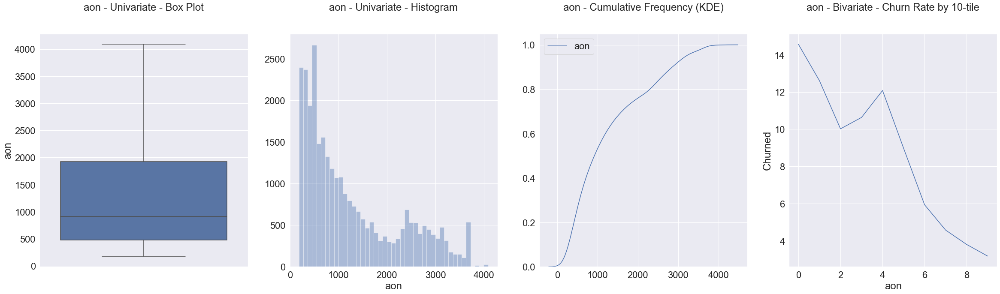



Variable Name: jul_vbc_3g; Type: Binary


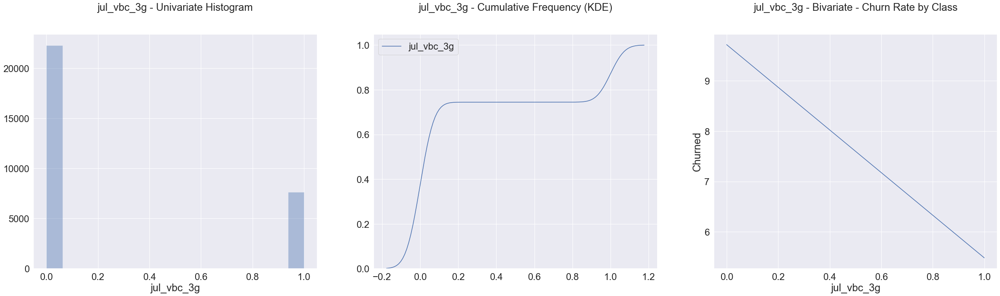



Variable Name: roam_ic_mou; Type: Binary


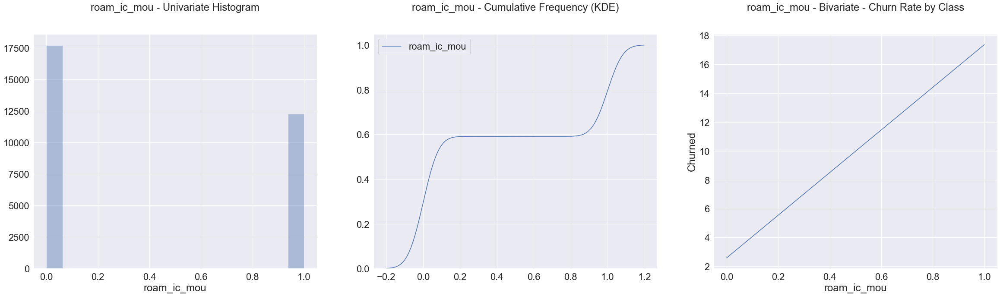



Variable Name: roam_og_mou; Type: Binary


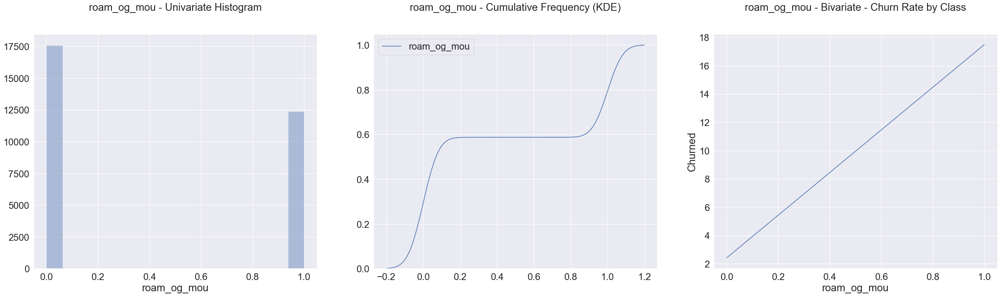



Variable Name: loc_og_t2t_mou; Type: Numeric


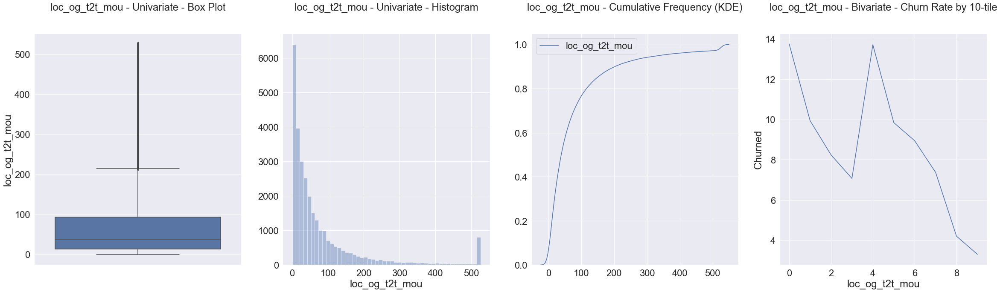



Variable Name: loc_og_t2m_mou; Type: Numeric


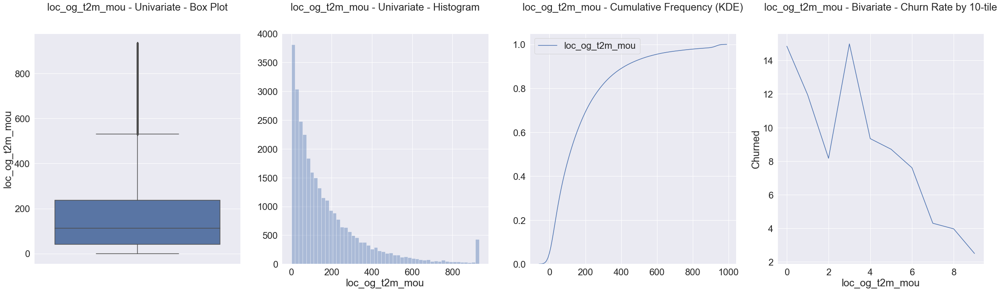



Variable Name: loc_og_t2f_mou; Type: Numeric


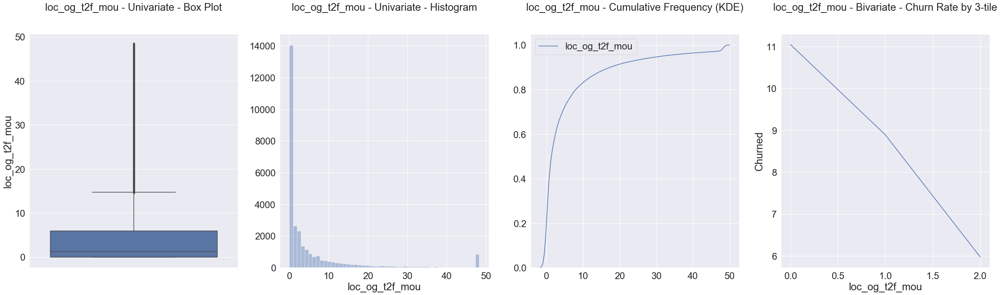



Variable Name: loc_og_t2c_mou; Type: Binary


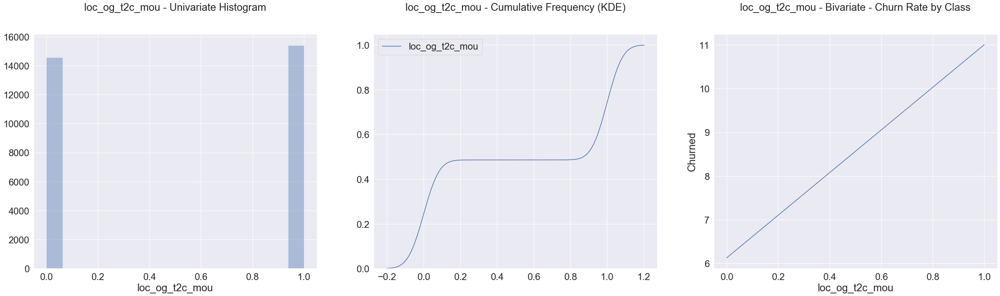



Variable Name: std_og_t2t_mou; Type: Numeric


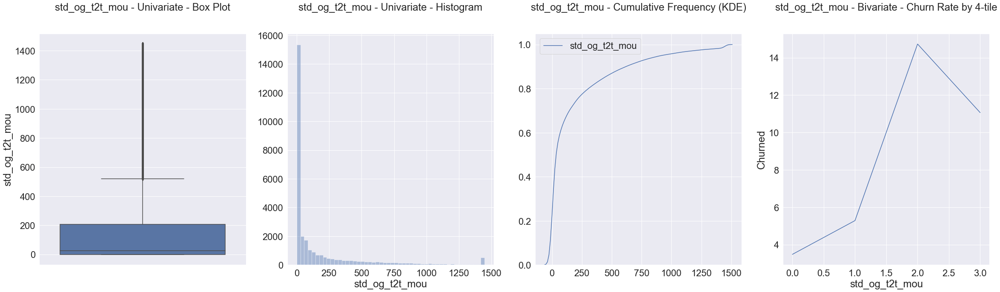



Variable Name: std_og_t2m_mou; Type: Numeric


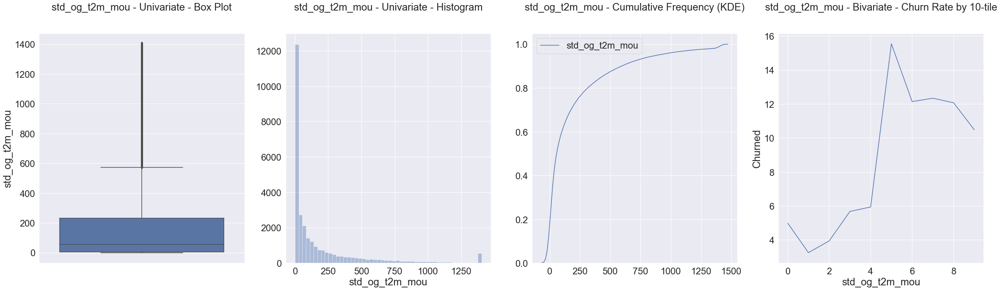



Variable Name: std_og_t2f_mou; Type: Binary


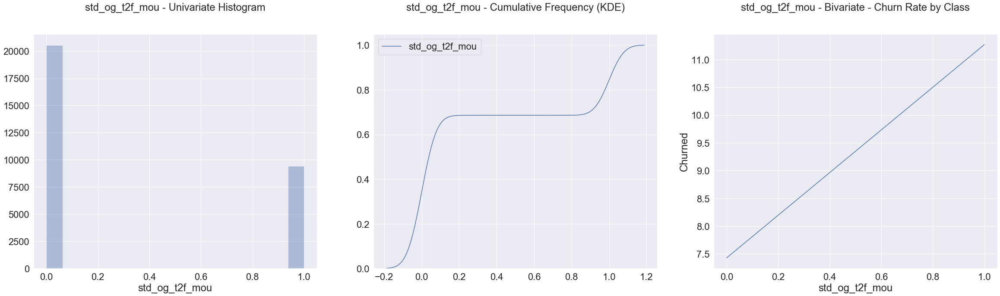



Variable Name: isd_og_mou; Type: Binary


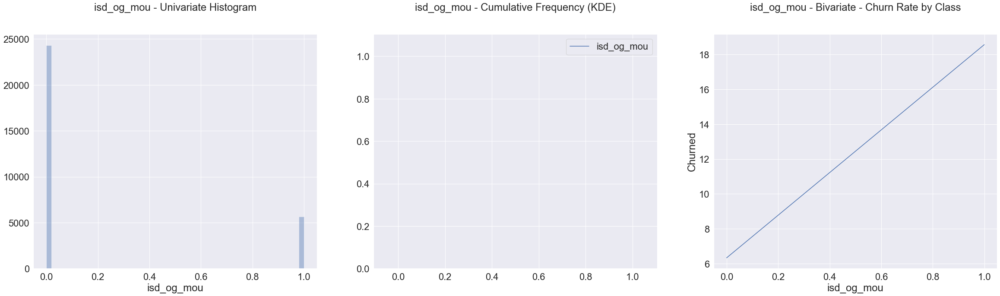



Variable Name: spl_og_mou; Type: Numeric


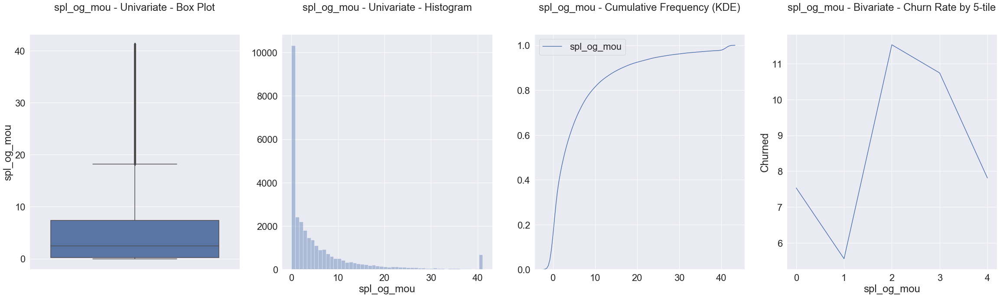



Variable Name: og_others; Type: Binary


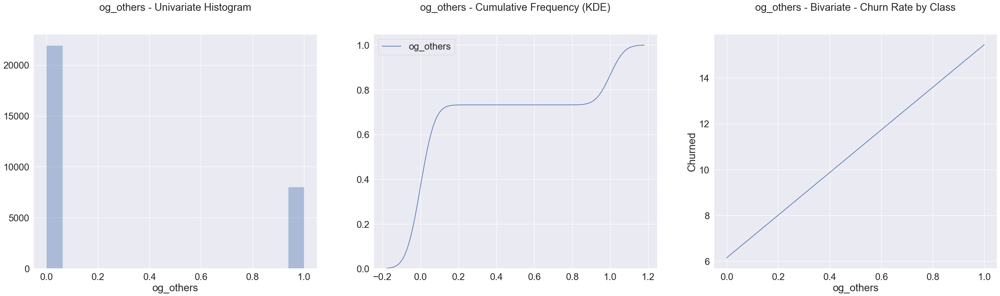



Variable Name: total_og_mou; Type: Numeric


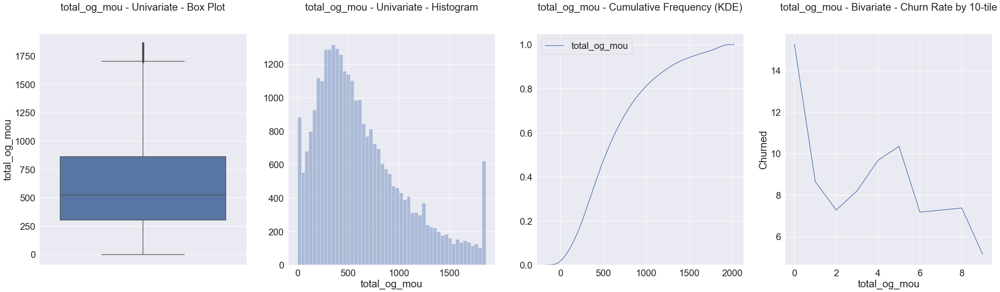



Variable Name: loc_ic_t2t_mou; Type: Numeric


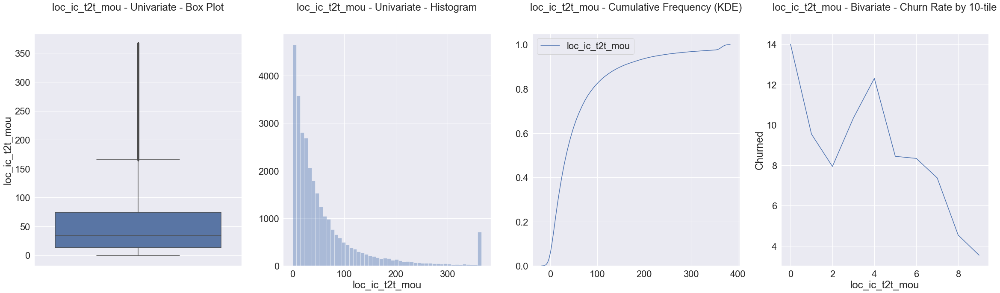



Variable Name: loc_ic_t2m_mou; Type: Numeric


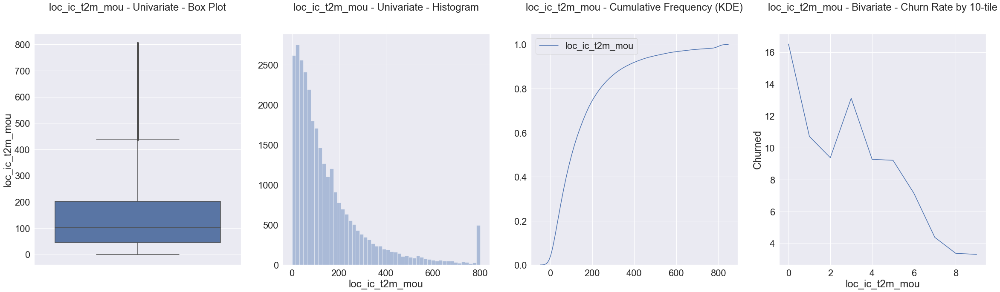



Variable Name: loc_ic_t2f_mou; Type: Numeric


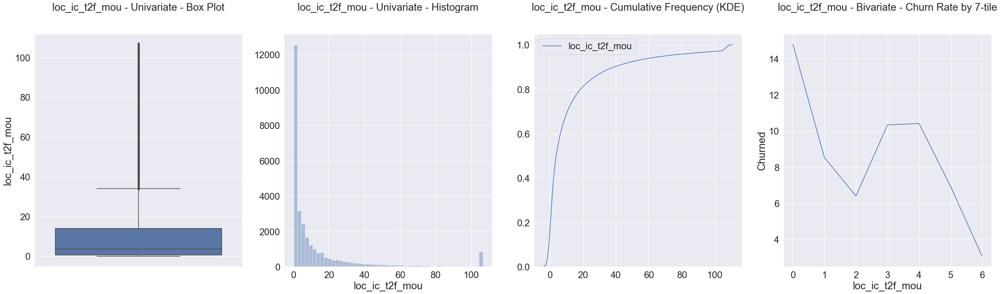



Variable Name: std_ic_t2t_mou; Type: Numeric


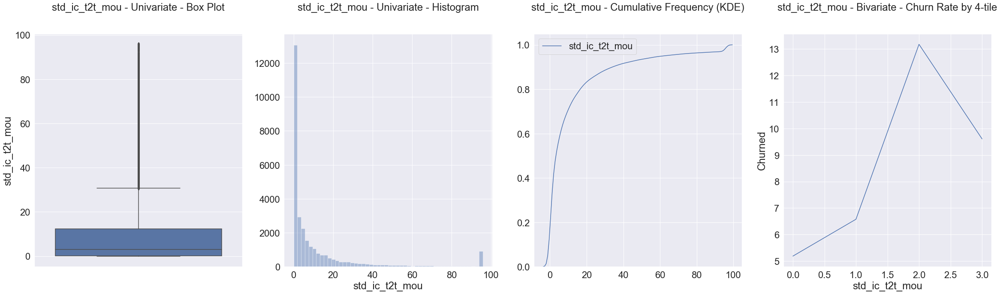



Variable Name: std_ic_t2m_mou; Type: Numeric


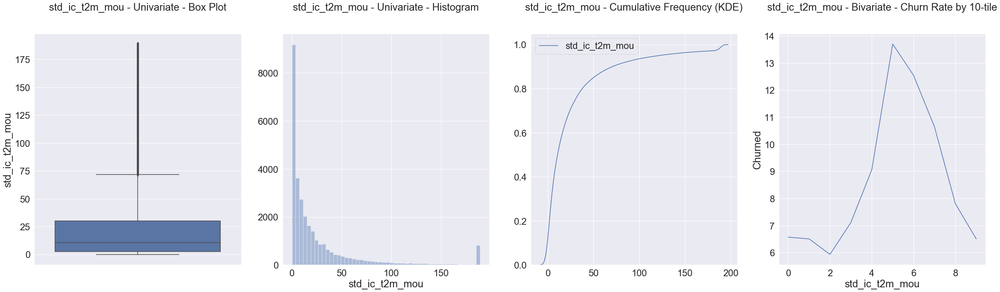



Variable Name: std_ic_t2f_mou; Type: Binary


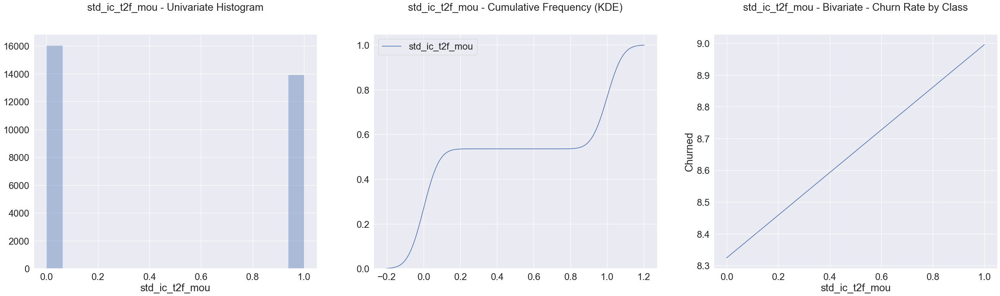



Variable Name: spl_ic_mou; Type: Binary


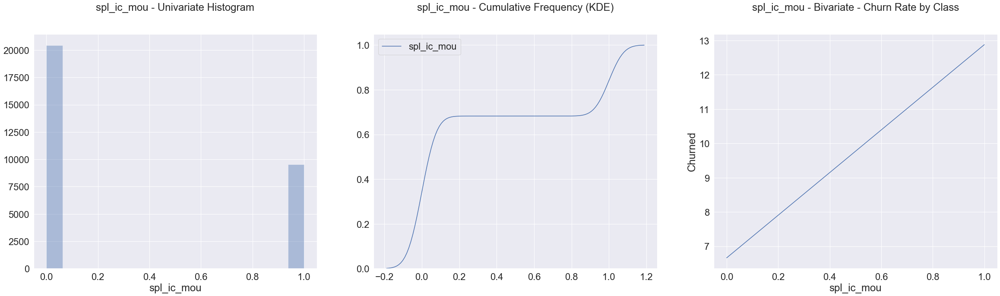



Variable Name: isd_ic_mou; Type: Binary


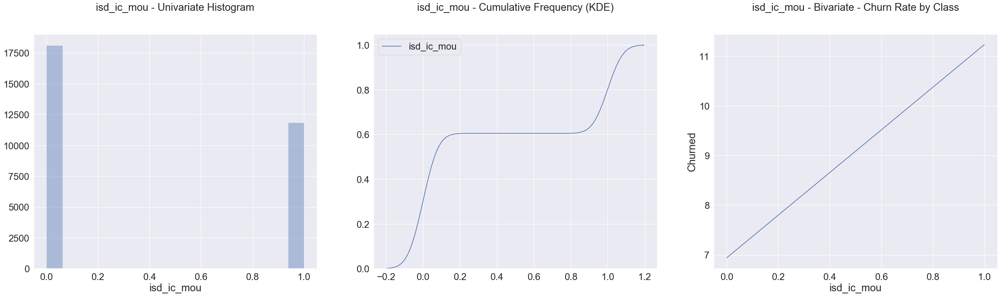



Variable Name: ic_others; Type: Binary


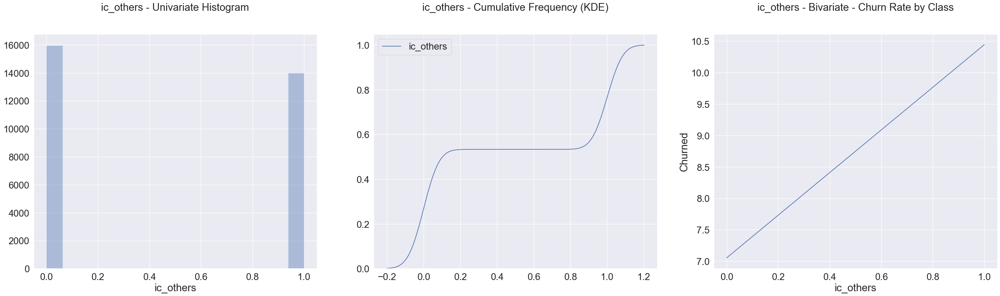



Variable Name: total_rech_num; Type: Numeric


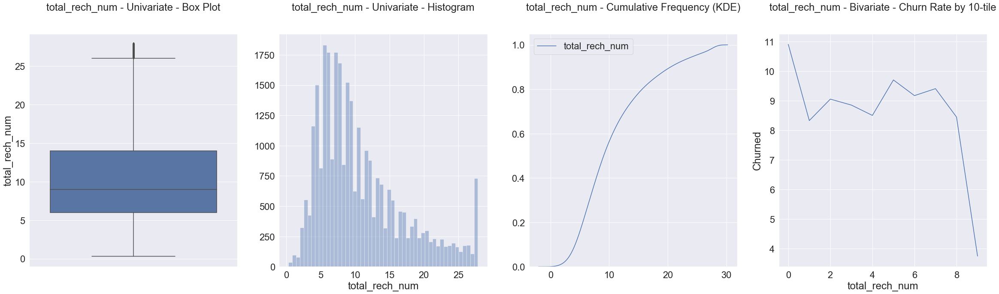



Variable Name: total_rech_amt; Type: Numeric


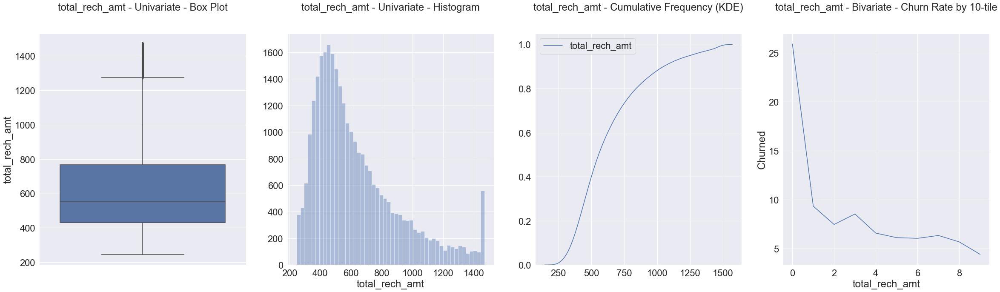



Variable Name: max_rech_amt; Type: Numeric


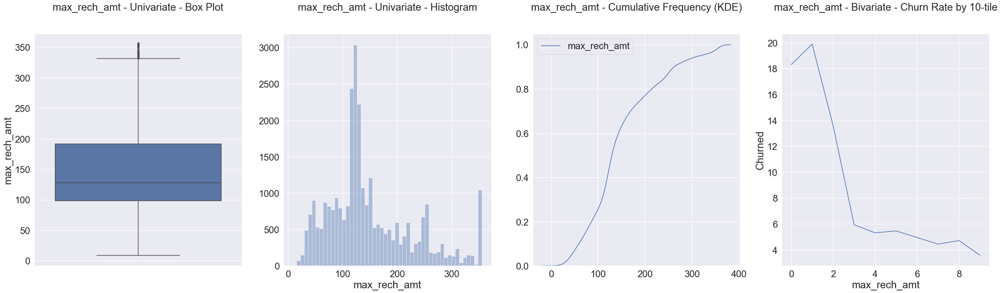



Variable Name: date_of_last_rech; Type: Numeric


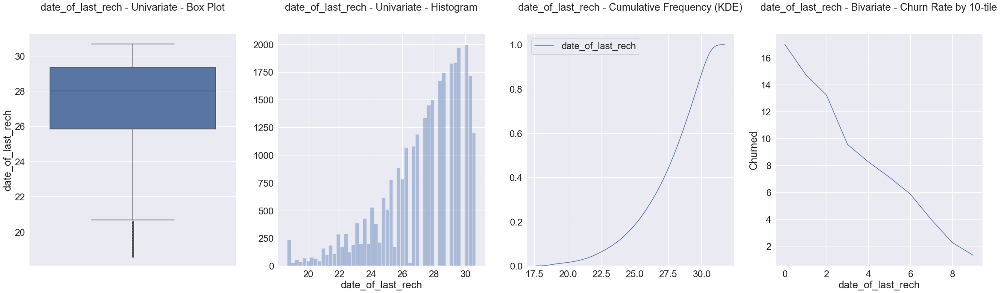



Variable Name: last_day_rch_amt; Type: Numeric


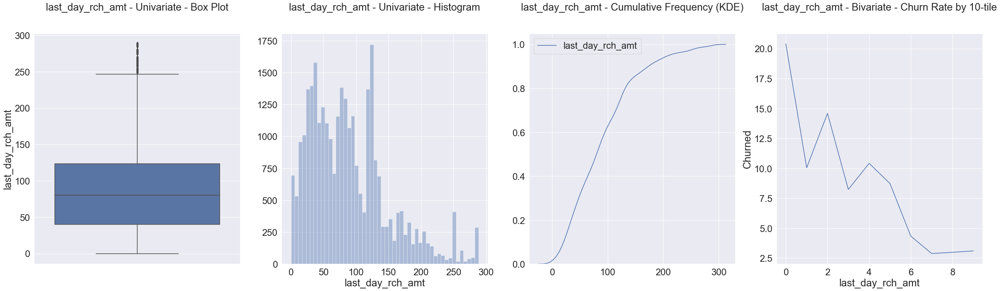



Variable Name: vol_2g_mb; Type: Binary


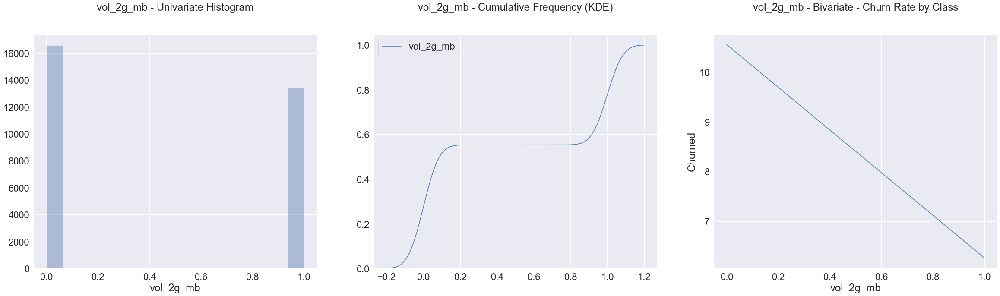

In [42]:
# Begin procedure
for colname in hvc_data.columns:
    
    # Set up Plot Canvas
    sns.set(rc={'figure.figsize':(40,10)})
    sns.set(font_scale=2)

    # Work out whether variable is binary or should be broken into n-tiles
    if colname in bin_variables_created:
        
        # Print out Variable Name and Type
        print("\n\n" + "Variable Name: " + colname + "; Type: Binary")
        
        # Univariate: Histogram
        plt.subplot(1, 3, 1)
        g = sns.distplot(hvc_data[colname], kde=False)
        g.text(0.5, 1.1, colname + " - Univariate Histogram", size=24, ha="center", transform=g.transAxes)
        g.ylab = 'Frequency'

        # Univariate: Cumulative Frequency Chart - Kernel Distribution (KDE)
        plt.subplot(1, 3, 2)
        g = sns.kdeplot(hvc_data[colname], cumulative=True)
        g.text(0.5, 1.1, colname + " - Cumulative Frequency (KDE)", size=24, ha="center", transform=g.transAxes)
        g.ylab = 'Cumulative Frequency'
        
        # For Bivariate, get Churn Rate by both classes
        churn_by_class = pd.concat([hvc_data[colname], Y_hvc_data], axis=1) # get churned info for each customer
        churn_by_class_summ = churn_by_class.groupby(colname).Churned.sum() \
                            / churn_by_class.groupby(colname).Churned.count() * 100 # get churn rate for each class        
        
        # Bivariate: Churn Rate by Variable Classes
        plt.subplot(1, 3, 3)
        g = sns.lineplot(x = churn_by_class_summ.index, y = churn_by_class_summ)
        g.text(0.5, 1.1, colname + " - Bivariate - Churn Rate by Class", size=24, ha="center", transform=g.transAxes)
        g.ylab = 'Churn Rate'        
        
    else:
        
        # Print out Variable Name and Num Quantiles
        print("\n\n" + "Variable Name: " + colname + "; Type: Numeric")
        
        # Univariate: Box Plot
        plt.subplot(1, 4, 1)
        g = sns.boxplot(hvc_data[colname], orient='v')
        g.text(0.5, 1.1, colname + " - Univariate - Box Plot", size=24, ha="center", transform=g.transAxes)
        
        # Univariate: Histogram
        plt.subplot(1, 4, 2)
        g = sns.distplot(hvc_data[colname], kde=False)
        g.text(0.5, 1.1, colname + " - Univariate - Histogram", size=24, ha="center", transform=g.transAxes)
        g.ylab = 'Frequency'
        
        # Univariate: Cumulative Frequency Chart - Kernel Distribution (KDE)
        plt.subplot(1, 4, 3)
        g = sns.kdeplot(hvc_data[colname], cumulative=True)
        g.text(0.5, 1.1, colname + " - Cumulative Frequency (KDE)", size=24, ha="center", transform=g.transAxes)
        g.ylab = 'Cumulative Frequency'
        
        # For Bivariate Analysis, find number number of quantiles (n) to break variable into
        val_count_check = hvc_data[colname].value_counts() / len(hvc_data) * 100
        
        if val_count_check.iloc[0] <= 100/10:
            
            n = 10
        
        elif val_count_check.iloc[0] <= 100/9:
            
            n = 9
            
        elif val_count_check.iloc[0] <= 100/8:
            
            n = 8
            
        elif val_count_check.iloc[0] <= 100/7:
            
            n = 7
            
        elif val_count_check.iloc[0] <= 100/6:
            
            n = 6
            
        elif val_count_check.iloc[0] <= 100/5:
            
            n = 5
            
        elif val_count_check.iloc[0] <= 100/4:
            
            n = 4
            
        else: # binaries covered above; unaries removed from data
            
            n = 3
        
        # Get Churn Rate by Variable Decile - for Bivariate Analysis
        n_tiles = pd.qcut(x=hvc_data[colname], q=n, labels=np.arange(n)) # bucket each customer by variable n-tile
        churn_by_n_tile = pd.concat([n_tiles, Y_hvc_data], axis=1) # get churned info for each customer
        churn_by_n_tile_summ = churn_by_n_tile.groupby(colname).Churned.sum() \
                            / churn_by_n_tile.groupby(colname).Churned.count() * 100 # get churn rate for each n-tile
        
        # Bivariate: Churn Rate by Variable Deciles
        plt.subplot(1, 4, 4)
        g = sns.lineplot(x = churn_by_n_tile_summ.index, y = churn_by_n_tile_summ)
        g.text(0.5, 1.1, colname + " - Bivariate - Churn Rate by " + str(n) + "-tile", size=24, ha="center", transform=g.transAxes)
        g.ylab = 'Churn Rate'
    
    plt.show()

# Insights from EDA
- One generic note: Unless mentioned all variable values averaged over months 6, 7, and 8

### Variable 1 of 30: aon
- 50% of customers have age-on-network < 1000 units; distribution lopsided, with positive skew
- Non-linear relationship between Churn Rate and age on network

### Variable 2 of 30: jul_vbc_3g
- Binarised variable - 3G Volume Based Cost - over 70% customers have value 0 (no cost), others 1 (some cost)
- Customers who don't use 3G in month 2 (e.g. Jul) of happy period (jul_vbc_3g = 0) have higher Churn Rate on average

### Variables 3 & 4 of 30: roam_ic_mou, roam_og_mou
- Binarised variable - Roaming Incoming/Outgoing Minutes of Usage - ~60% users have value 0 (no usage), others 1 (some usage)
- Customers who don't use Roaming call facilities (whether incoming or outgoing) in roaming zones have lower Churn Rate on average

### Variables 5 & 6 of 30: loc_og_t2t_mou and loc_og_t2m_mou
- Both distributions (minutes of usage during local outgoing calls to operator and other operator mobiles) lopsided, with positive skews
- Non-linear relationship between Churn Rate and local mobile outgoing usage

### Variable 7 of 30: loc_og_t2f_mou
- Over 50% of customers have this metric (minutes of usage of local outgoing facility to operator fixed line) < 5, but a long tail exists, skewing the distribution positively
- Churn Rate has an approximately negative linear relationship with usage of outgoing facility to operator fixed line

### Variable 8 of 30: loc_og_t2c_mou
- Binarised variable - minutes of usage of local outgoing facility to operator's call center - ~50% customers have value 0 (no call to call center), others 1 (at least one call to call center)
- Customers who reached out to the call center have higher Churn Rate on average

### Variables 9 & 10 of 30: std_og_t2t_mou, std_og_t2m_mou
- Both distributions (minutes of usage during STD outgoing calls to operator and other operator mobiles) lopsided, with positive skews
- Non-linear relationship between Churn Rate and STD-mobile outgoing usage

### Variables 11 & 12 of 30: std_og_t2f_mou, isd_og_mou
- Binarised variable - STD Outgoing to Operator Fixed Lines/ ISD Outgoing Minutes of Usage - ~60% users have value 0 (no usage), others 1 (some usage)
- Customers who don't use STD Outgoing to Operator Fixed Lines/ ISD Outgoing facilities have lower Churn Rate on average

### Variable 13 of 30: spl_og_mou
- Over 50% of customers have this metric (minutes of usage of special outgoing calls) < 5, but a long tail exists, skewing the distribution positively
- Non-linear relationship between Churn Rate and minutes of usage of special outgoing calls

### Variable 14 of 30: og_others
- Binarised variable - minutes of usage of 'other' outgoing facility - over 70% customers have value 0 (no 'other' outgoing calls), others 1 (at least one 'other' outgoing call)
- Customers who made 'other' outgoing calls have higher Churn Rate on average

### Variables 15 - 18 of 30: total_og_mou, loc_ic_t2t_mou, loc_ic_t2m_mou, loc_ic_t2f_mou
- All distributions (minutes of usage all outgoing calls / local incoming calls whether from operator mobiles, other operator mobiles or operator fixed lines) lopsided, with positive skews
- Non-linear relationship between Churn Rate and usage of these facilities

### Variables 19 - 20 of 30: std_ic_t2t_mou, std_ic_t2m_mou
- Both distributions (minutes of STD incoming usage whether from operator mobiles or other operator mobiles) lopsided, with positive skews
- Non-linear relationship between Churn Rate and usage of these facilities

### Variables 21 - 24 of 30: std_ic_t2f_mou, spl_ic_mou, isd_ic_mou, ic_others
- Binarised variable - STD Incoming from Operator Fixed Lines/ Special, ISD and Other Incoming Minutes of Usage - over 50% users have value 0 (no usage), others 1 (some usage)
- Customers who don't use STD Incoming from Operator Fixed Lines/ Special, ISD or Other Incoming facilities have lower Churn Rate on average

### Variable 25 of 30: total_rech_num
- Over 50% of customers have this metric (total # recharges) < 10, but a tail exists, skewing the distribution positively
- Non-linear relationship between Churn Rate and total number of recharges

### Variables 26 - 27 of 30: total_rech_amt, max_rech_amt
- Both distributions (Total and Max Recharge Amounts) lopsided, with positive skews
- Negative non-linear relationship between Churn Rate and total / max recharge amounts

### Variable 28 of 30: date_of_last_rech
- Over 50% of customers have this metric (data of last recharge) > 28, but a tail exists, skewing the distribution negatively
- Approximately negative linear relationship between Churn Rate and date of last recharge

### Variable 29 of 30: last_day_rch_amt
- Over 50% of customers have this metric (last day of month recharge amount) < 100, but a tail exists, skewing the distribution positively
- Non-linear relationship between Churn Rate and last day of month recharge amount

### Variable 30 of 30: vol_2g_mb
- Binarised variable - 2G Usage Volume - over 50% users have value 0 (no usage), others 1 (some usage)
- Customers who use 2G have higher Churn Rate on average

# Further Data Prep for Modelling

In [43]:
# Get Train Test Splits
np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(hvc_data, Y_hvc_data, train_size = 0.7, test_size = 0.3, random_state = 100)

In [44]:
# Standardise all variables (except binaries) in the datasets

# Get all non-binary variables
col_need_std = [colname for colname in X_train.columns if colname not in bin_variables_created]
X_train_need_std = X_train[col_need_std]
X_test_need_std = X_test[col_need_std]

# Scale
scaler = StandardScaler()
X_train_post_std = pd.DataFrame(scaler.fit_transform(X_train_need_std), columns=col_need_std)
X_test_post_std = pd.DataFrame(scaler.transform(X_test_need_std), columns=col_need_std)

# Get dataset back with Binary Variables as well
X_train_std = pd.concat([X_train_post_std.reset_index(drop=True),
                         X_train[bin_variables_created].reset_index(drop=True)], axis = 1)
y_train = pd.DataFrame(y_train, columns=['Churned'])
X_test_std = pd.concat([X_test_post_std.reset_index(drop=True),
                        X_test[bin_variables_created].reset_index(drop=True)], axis = 1)
y_test = pd.DataFrame(y_test, columns=['Churned'])

# Handle Class Imbalance

In [45]:
# Address Class Imbalance, given that overall churn rate ~= 8%

# Resample data to balance classes
cc = ClusterCentroids(random_state=0)
X_train_std, y_train = cc.fit_sample(X_train_std, y_train)

# Check new Overall Churn Rate
overall_churn_rate = np.round(y_train.sum()/len(y_train)*100, 2)
overall_churn_rate

50.0

# Dimensionality Reduction via PCA

In [46]:
# Review dimensionality of dataset prior to PCA
X_train_std.shape

(3548, 30)

In [47]:
# Initialise PCA function, with default number of components
pca = IncrementalPCA()
pca.fit(X_train_std)

IncrementalPCA(batch_size=None, copy=True, n_components=None, whiten=False)

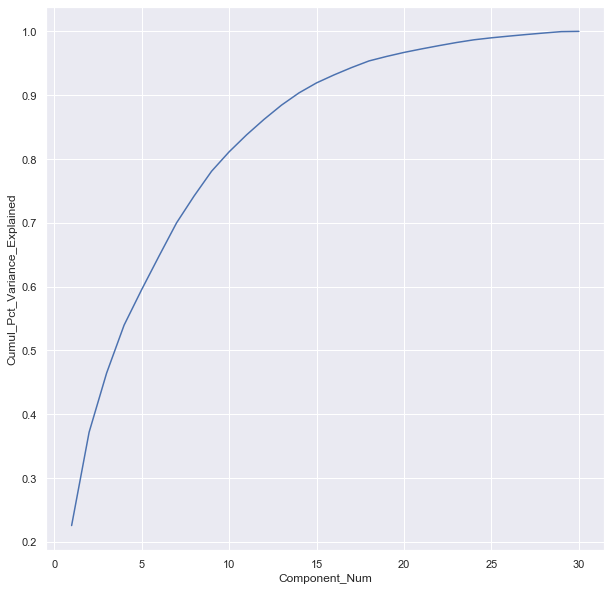

In [48]:
# Build Scree Plot to tune n_components hyperparameter
sns.set(rc={'figure.figsize':(10,10)})
sns.set(font_scale=1)
component_num = pd.DataFrame(np.arange(1, len(pca.explained_variance_ratio_) + 1), columns=['Component_Num'])
explained_pct = pd.DataFrame(pca.explained_variance_ratio_.cumsum(), columns=['Cumul_Pct_Variance_Explained'])
scree_data = pd.concat([component_num, explained_pct], axis=1)
scree_data = scree_data.set_index('Component_Num')
sns.lineplot(x=scree_data.index, y='Cumul_Pct_Variance_Explained', data=scree_data)

In [49]:
# Of the 30 principal components, 18 are sufficient to explain 95% variance
print(scree_data)

               Cumul_Pct_Variance_Explained
Component_Num                              
1                                  0.225669
2                                  0.371854
3                                  0.464508
4                                  0.539652
5                                  0.595105
6                                  0.648072
7                                  0.699949
8                                  0.741934
9                                  0.780766
10                                 0.811120
11                                 0.837771
12                                 0.862074
13                                 0.884433
14                                 0.903612
15                                 0.919231
16                                 0.931753
17                                 0.943220
18                                 0.953664
19                                 0.960656
20                                 0.966975
21                              

In [50]:
# Hence tune hyperparameter n_components to 18
pca_final = IncrementalPCA(n_components = 18)
X_train_pca = pca_final.fit_transform(X_train_std)

# Predictive Modeling using Principal Components

## Model 1: Logistic Regression
- Submodel 1

In [51]:
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_pca)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3529
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1302.4
Date:                Sun, 24 Nov 2019   Deviance:                       2604.8
Time:                        13:27:49   Pearson chi2:                 4.88e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0171      0.054     -0.317      0.751      -0.123       0.089
x1            -0.9854      0.036    -27.494      0.000      -1.056      -0.915
x2            -0.1423      0.028     -5.043      0.000      -0.198      -0.087
x3             0.1128      0.037      3.024      0.002       0.040       0.186
x4             0.2465      0.042      5.811      0.000       0.163       0.330
x5             0.4083      0.053      7.719      0.000       0.305       0.512
x6             0.4274      0.049      8.804      0.000       0.332       0.523
x7             0.6652      0.051     12.951      0.000       0.564       0.766
x8            -0.5170      0.056     -9.256      0.000      -0.626      -0.407
x9             0.4747      0.067      7.052      0.000       0.343       0.607
x10           -0.4258      0.066     -6.453      0.000      -0.555      -0.296
x11            0.1159      0.071      1.622      0.105      -0.024       0.256
x12           -0.3204      0.071     -4.509      0.000      -0.460      -0.181
x13            0.6054      0.074      8.194      0.000       0.461       0.750
x14           -0.0656      0.088     -0.742      0.458      -0.239       0.108
x15           -0.3669      0.087     -4.231      0.000      -0.537      -0.197
x16            1.1937      0.093     12.901      0.000       1.012       1.375
x17            0.0787      0.101      0.780      0.435      -0.119       0.277
x18            0.1985      0.110      1.806      0.071      -0.017       0.414
==============================================================================
"""

## Model 1: Logistic Regression
- Submodel 2 - Variable #14 has very high p-value, and must be removed

In [52]:
X_train_logml = np.delete(X_train_pca, obj = 13, axis = 1)
X_test_logml = np.delete(pca_final.transform(X_test_std), obj = 13, axis = 1)

logm1 = sm.GLM(y_train,(sm.add_constant(X_train_logml)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3530
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1302.7
Date:                Sun, 24 Nov 2019   Deviance:                       2605.4
Time:                        13:27:49   Pearson chi2:                 4.84e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0193      0.054     -0.359      0.720      -0.125       0.086
x1            -0.9857      0.036    -27.498      0.000      -1.056      -0.915
x2            -0.1426      0.028     -5.058      0.000      -0.198      -0.087
x3             0.1146      0.037      3.080      0.002       0.042       0.188
x4             0.2459      0.042      5.804      0.000       0.163       0.329
x5             0.4077      0.053      7.706      0.000       0.304       0.511
x6             0.4268      0.048      8.804      0.000       0.332       0.522
x7             0.6647      0.051     12.948      0.000       0.564       0.765
x8            -0.5150      0.056     -9.230      0.000      -0.624      -0.406
x9             0.4759      0.067      7.056      0.000       0.344       0.608
x10           -0.4291      0.066     -6.524      0.000      -0.558      -0.300
x11            0.1196      0.071      1.673      0.094      -0.020       0.260
x12           -0.3165      0.071     -4.471      0.000      -0.455      -0.178
x13            0.6051      0.074      8.199      0.000       0.460       0.750
x14           -0.3697      0.087     -4.271      0.000      -0.539      -0.200
x15            1.1951      0.093     12.917      0.000       1.014       1.376
x16            0.0763      0.101      0.756      0.450      -0.122       0.274
x17            0.2038      0.110      1.856      0.063      -0.011       0.419
==============================================================================
"""

## Model 1: Logistic Regression
- Submodel 3 - Variable #16 has high p-value, and must be removed

In [53]:
X_train_logml = np.delete(X_train_logml, obj = 15, axis = 1)
X_test_logml = np.delete(X_test_logml, obj = 15, axis = 1)

logm1 = sm.GLM(y_train,(sm.add_constant(X_train_logml)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3531
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1303.0
Date:                Sun, 24 Nov 2019   Deviance:                       2606.0
Time:                        13:27:49   Pearson chi2:                 4.84e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0221      0.054     -0.411      0.681      -0.127       0.083
x1            -0.9869      0.036    -27.529      0.000      -1.057      -0.917
x2            -0.1420      0.028     -5.034      0.000      -0.197      -0.087
x3             0.1144      0.037      3.072      0.002       0.041       0.187
x4             0.2462      0.042      5.812      0.000       0.163       0.329
x5             0.4079      0.053      7.714      0.000       0.304       0.511
x6             0.4256      0.048      8.789      0.000       0.331       0.520
x7             0.6634      0.051     12.942      0.000       0.563       0.764
x8            -0.5136      0.056     -9.208      0.000      -0.623      -0.404
x9             0.4762      0.068      7.053      0.000       0.344       0.609
x10           -0.4272      0.066     -6.505      0.000      -0.556      -0.299
x11            0.1209      0.071      1.691      0.091      -0.019       0.261
x12           -0.3165      0.071     -4.472      0.000      -0.455      -0.178
x13            0.6071      0.074      8.227      0.000       0.462       0.752
x14           -0.3675      0.086     -4.249      0.000      -0.537      -0.198
x15            1.1958      0.093     12.921      0.000       1.014       1.377
x16            0.2063      0.110      1.883      0.060      -0.008       0.421
==============================================================================
"""

## Model 1: Logistic Regression
- Submodel 4 - Variable #11 has high p-value, and must be removed

In [54]:
X_train_logml = np.delete(X_train_logml, obj = 10, axis = 1)
X_test_logml = np.delete(X_test_logml, obj = 10, axis = 1)

logm1 = sm.GLM(y_train,(sm.add_constant(X_train_logml)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3532
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1304.4
Date:                Sun, 24 Nov 2019   Deviance:                       2608.8
Time:                        13:27:49   Pearson chi2:                 4.89e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0275      0.053     -0.515      0.607      -0.132       0.077
x1            -0.9879      0.036    -27.538      0.000      -1.058      -0.918
x2            -0.1430      0.028     -5.085      0.000      -0.198      -0.088
x3             0.1163      0.037      3.130      0.002       0.043       0.189
x4             0.2498      0.042      5.937      0.000       0.167       0.332
x5             0.4065      0.053      7.711      0.000       0.303       0.510
x6             0.4214      0.048      8.733      0.000       0.327       0.516
x7             0.6596      0.051     12.904      0.000       0.559       0.760
x8            -0.5143      0.056     -9.250      0.000      -0.623      -0.405
x9             0.4664      0.067      6.963      0.000       0.335       0.598
x10           -0.4142      0.065     -6.371      0.000      -0.542      -0.287
x11           -0.3304      0.070     -4.710      0.000      -0.468      -0.193
x12            0.6125      0.074      8.311      0.000       0.468       0.757
x13           -0.3674      0.086     -4.254      0.000      -0.537      -0.198
x14            1.2024      0.093     12.991      0.000       1.021       1.384
x15            0.2120      0.109      1.940      0.052      -0.002       0.426
==============================================================================
"""

## Model 1: Logistic Regression
- Submodel 5 - Variable #15 has high p-value, and must be removed

In [55]:
X_train_logml = np.delete(X_train_logml, obj = 14, axis = 1)
X_test_logml = np.delete(X_test_logml, obj = 14, axis = 1)

logm1 = sm.GLM(y_train,(sm.add_constant(X_train_logml)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3533
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1306.3
Date:                Sun, 24 Nov 2019   Deviance:                       2612.6
Time:                        13:27:49   Pearson chi2:                 4.94e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0293      0.053     -0.550      0.583      -0.134       0.075
x1            -0.9878      0.036    -27.552      0.000      -1.058      -0.918
x2            -0.1422      0.028     -5.055      0.000      -0.197      -0.087
x3             0.1168      0.037      3.144      0.002       0.044       0.190
x4             0.2484      0.042      5.898      0.000       0.166       0.331
x5             0.3998      0.053      7.580      0.000       0.296       0.503
x6             0.4208      0.048      8.719      0.000       0.326       0.515
x7             0.6581      0.051     12.893      0.000       0.558       0.758
x8            -0.5177      0.056     -9.314      0.000      -0.627      -0.409
x9             0.4720      0.067      7.093      0.000       0.342       0.602
x10           -0.4148      0.065     -6.368      0.000      -0.542      -0.287
x11           -0.3307      0.070     -4.711      0.000      -0.468      -0.193
x12            0.6126      0.074      8.303      0.000       0.468       0.757
x13           -0.3660      0.086     -4.234      0.000      -0.535      -0.197
x14            1.2090      0.093     13.064      0.000       1.028       1.390
==============================================================================
"""

# Model 1: Logistic Regression
- Check that PCA has removed multicollinearity

In [56]:
# Check VIF
vif = pd.DataFrame()
vif['VIF'] = [np.round(variance_inflation_factor(pd.DataFrame(X_train_logml).values, i), 2) for i in range(X_train_logml.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

# All VIFs < 2

    VIF
0   1.0
1   1.0
2   1.0
3   1.0
4   1.0
5   1.0
6   1.0
7   1.0
8   1.0
9   1.0
10  1.0
11  1.0
12  1.0
13  1.0


## Model 1: Logistic Regression
- Predict churn and evaluate model

In [57]:
# Predict
y_test_pred_logml_prob = logml_inst.predict(sm.add_constant(X_test_logml))

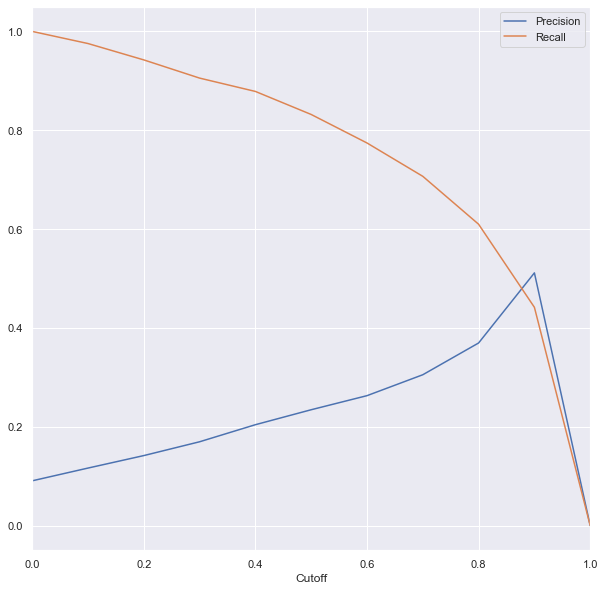

In [58]:
# Find optimal cutoff point for converting churn probabilities to churn predictions
opt_cut_off = pd.DataFrame(columns = ['Cutoff','Precision','Recall']) # create empty dataframe
for i in np.arange(0, 1.1, 0.1): # for each cutoff point, get precision, recall
    y_test_pred_logml = list(map(lambda x: 1 if x > i else 0, y_test_pred_logml_prob))
    opt_cut_off = opt_cut_off.append({'Cutoff': i, 'Precision': metrics.precision_score(y_test, y_test_pred_logml), 
                                      'Recall': metrics.recall_score(y_test, y_test_pred_logml)}, ignore_index = True)

# Plot precision-recall curve
opt_cut_off.plot(x='Cutoff', y = ['Precision','Recall'])

In [59]:
# Considering cutoff to be 0.85, predict Churn
y_test_pred_logml = list(map(lambda x: 1 if x > 0.85 else 0, y_test_pred_logml_prob))

# Compute final precision and recall scores
print(metrics.classification_report(y_test, y_test_pred_logml))
print(metrics.confusion_matrix(y_test, y_test_pred_logml))

# Recall of 54%, precision is 43%

             precision    recall  f1-score   support

          0       0.95      0.93      0.94      8179
          1       0.43      0.54      0.48       815

avg / total       0.91      0.89      0.90      8994

[[7600  579]
 [ 377  438]]


In [60]:
# Considering cutoff to be 0.5, predict Churn
y_test_pred_logml = list(map(lambda x: 1 if x > 0.5 else 0, y_test_pred_logml_prob))

# Compute final precision and recall scores
print(metrics.classification_report(y_test, y_test_pred_logml))
print(metrics.confusion_matrix(y_test, y_test_pred_logml))

# Recall of 83%, precision is 23%

             precision    recall  f1-score   support

          0       0.98      0.73      0.84      8179
          1       0.23      0.83      0.37       815

avg / total       0.91      0.74      0.79      8994

[[5965 2214]
 [ 137  678]]


# Model 2: Random Forest
- Fit model with default hyperparameters & evaluate model

In [61]:
# Instantiate Model with Default Hyperparameters
rfc = RandomForestClassifier(oob_score=True, random_state=42)

# Train Model
rfc.fit(X_train_pca, y_train)

# Predict
X_test = pca_final.transform(X_test_std)
y_test_pred = rfc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 75% with 21% precision

             precision    recall  f1-score   support

          0       0.97      0.72      0.82      8179
          1       0.21      0.75      0.33       815

avg / total       0.90      0.72      0.78      8994

[[5877 2302]
 [ 207  608]]


In [62]:
# Out-of-bag score also good
rfc.oob_score_

0.7801578354002254

## Model 2: Random Forest
- Tune max_depth with the objective of getting better recall with better precision / at least without much loss in precision
- Fit best model on data and evaluate model

In [63]:
# Specify universe of potential values for hyperparameters 
param_grid = {'max_depth': range(1, 25, 1)}

# Instantiate grid search
rfc_grid_search = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator = rfc_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 24 candidates, totalling 72 fits
[CV] max_depth=1 .....................................................
[CV] max_depth=1 .....................................................
[CV] max_depth=1 .....................................................
[CV] max_depth=2 .....................................................
[CV] max_depth=2 .....................................................
[CV] max_depth=2 .....................................................
[CV] max_depth=3 .....................................................
[CV] max_depth=3 .....................................................
[CV] max_depth=3 .....................................................
[CV] max_depth=4 .....................................................
[CV] ............ max_depth=1, score=0.7584459459459459, total=   0.0s
[CV] max_depth=4 .....................................................
[CV] ............ max_depth=1, score=0.7783417935702199, total=   0.0s
[CV] ...........

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0669s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  17 out of  72 | elapsed:    0.2s remaining:    0.7s


[CV] max_depth=22 ....................................................
[CV] ............ max_depth=8, score=0.8037225042301185, total=   0.1s
[CV] max_depth=23 ....................................................
[CV] ............ max_depth=9, score=0.7989864864864865, total=   0.1s
[CV] max_depth=9 .....................................................
[CV] ............ max_depth=10, score=0.805414551607445, total=   0.1s
[CV] max_depth=10 ....................................................
[CV] ........... max_depth=11, score=0.8037225042301185, total=   0.1s
[CV] max_depth=12 ....................................................
[CV] ........... max_depth=14, score=0.7800338409475466, total=   0.1s
[CV] max_depth=14 ....................................................
[CV] ............ max_depth=13, score=0.785472972972973, total=   0.1s
[CV] max_depth=13 ....................................................
[CV] ........... max_depth=15, score=0.7851099830795262, total=   0.1s
[CV] m

[Parallel(n_jobs=-1)]: Done  72 out of  72 | elapsed:    0.7s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': range(1, 25)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='recall', verbose=10)

In [64]:
grid_search.best_score_, grid_search.best_params_

(0.8032694475760992, {'max_depth': 10})

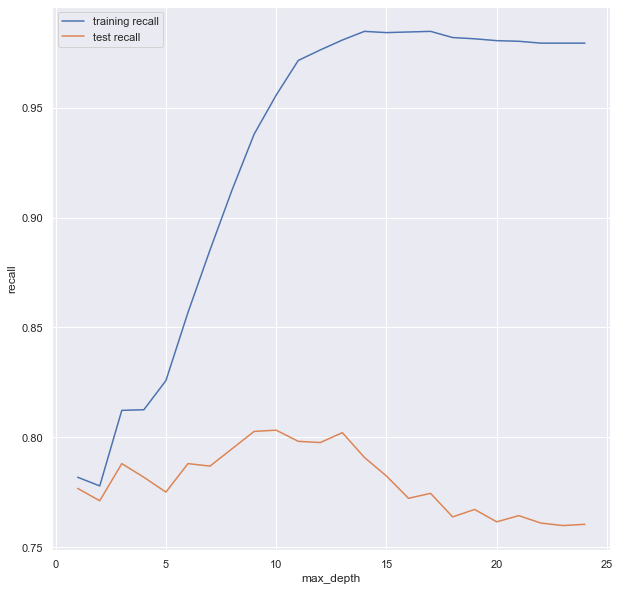

In [65]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_max_depth"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_max_depth"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("recall")
plt.legend()
plt.show()

In [66]:
# Instantiate Model with Tuned Hyperparameter
rfc = RandomForestClassifier(oob_score=True, random_state=42, max_depth = 10)

# Train Model
rfc.fit(X_train_pca, y_train)

# Predict
y_test_pred = rfc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 81% with 21% precision -- 6 pts gain in recall without loss in precision

             precision    recall  f1-score   support

          0       0.97      0.69      0.81      8179
          1       0.21      0.81      0.33       815

avg / total       0.90      0.70      0.76      8994

[[5636 2543]
 [ 157  658]]


## Model 2: Random Forest
- Tune min_samples_leaf with the objective of getting better recall with better precision / at least without much loss in precision
- Fit best model on data and evaluate model

In [67]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'max_depth':[10], # learned above
    'min_samples_leaf': [30, 40, 50, 60, 70, 80, 90, 100]}

# Instantiate grid search
rfc_grid_search = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator = rfc_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] max_depth=10, min_samples_leaf=30 ...............................
[CV] max_depth=10, min_samples_leaf=30 ...............................
[CV] max_depth=10, min_samples_leaf=30 ...............................
[CV] max_depth=10, min_samples_leaf=40 ...............................
[CV] max_depth=10, min_samples_leaf=40 ...............................
[CV] max_depth=10, min_samples_leaf=40 ...............................
[CV] max_depth=10, min_samples_leaf=50 ...............................
[CV] max_depth=10, min_samples_leaf=50 ...............................
[CV] max_depth=10, min_samples_leaf=50 ...............................
[CV] max_depth=10, min_samples_leaf=60 ...............................
[CV] max_depth=10, min_samples_leaf=60 ...............................
[CV] max_depth=10, min_samples_leaf=60 ...............................
[CV]  max_depth=10, min_samples_leaf=30, score=0.7820945945945946, total=   0.1s
[CV] ma

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0940s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done   4 out of  24 | elapsed:    0.1s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done   7 out of  24 | elapsed:    0.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  10 out of  24 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  13 out of  24 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  16 out of  24 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  19 out of  24 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  22 out of  24 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:    0.2s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [10], 'min_samples_leaf': [30, 40, 50, 60, 70, 80, 90, 100]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [68]:
grid_search.best_score_, grid_search.best_params_

(0.7717023675310034, {'max_depth': 10, 'min_samples_leaf': 40})

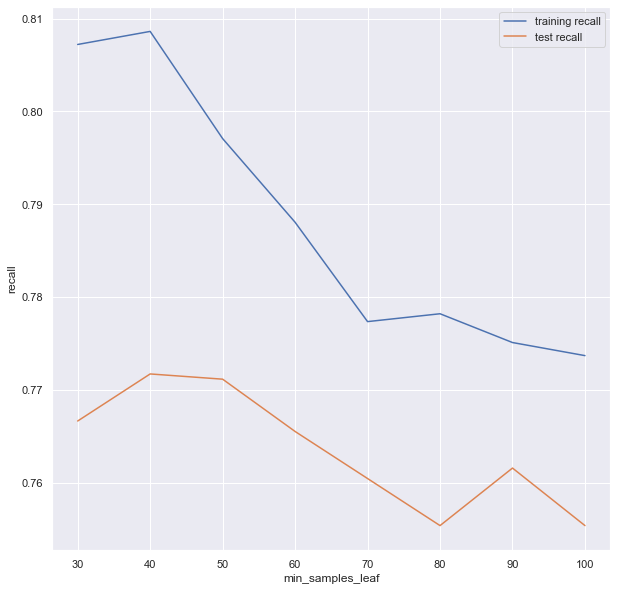

In [69]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_min_samples_leaf"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_min_samples_leaf"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("recall")
plt.legend()
plt.show()

In [70]:
# Instantiate Model with Tuned Hyperparameters
rfc = RandomForestClassifier(oob_score=True, random_state=42, max_depth = 10, min_samples_leaf = 40)

# Train Model
rfc.fit(X_train_pca, y_train)

# Predict
y_test_pred = rfc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 77% with 22% precision -- 4 pts loss in recall, 1 pt gain in precision

             precision    recall  f1-score   support

          0       0.97      0.72      0.83      8179
          1       0.22      0.77      0.34       815

avg / total       0.90      0.73      0.78      8994

[[5917 2262]
 [ 185  630]]


## Model 2: Random Forest
- Tune n_estimators with the objective of getting better recall with better precision / at least without much loss in precision
- Fit best model on data and evaluate model

In [71]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'max_depth': [10], # learned above
    'min_samples_leaf': [40],
    'n_estimators': range(10, 410, 10)}

# Instantiate grid search
rfc_grid_search = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator = rfc_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 40 candidates, totalling 120 fits
[CV] max_depth=10, min_samples_leaf=40, n_estimators=10 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=10 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=10 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=20 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=20 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=20 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=30 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=30 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=30 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=40 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=40 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=40 ..............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=10, score=0.768581081081081, tot

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1132s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.3s


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=40, score=0.7516891891891891, total=   0.3s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=40, score=0.7715736040609137, total=   0.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=80 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=80 ..............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=40, score=0.7614213197969543, total=   0.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=80 ..............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=50, score=0.7550675675675675, total=   0.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=90 ..............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=50, score=0.7563451776649747, total=   0.3s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=50, score=0.7715736040609137, total=   0.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=90 ..............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=100 

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.6s


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=80, score=0.766497461928934, total=   0.4s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=150 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=80, score=0.7529610829103215, total=   0.5s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=150 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=80, score=0.7635135135135135, total=   0.5s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=160 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=90, score=0.7635135135135135, total=   0.5s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=90 ..............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=90, score=0.7563451776649747, total=   0.5s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=100 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=100, score=0.7715736040609137, total=   0.6s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=100 

[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    1.6s


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=160, score=0.7681895093062606, total=   0.9s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=160 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=110, score=0.7766497461928934, total=   0.7s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=190 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=120, score=0.7601351351351351, total=   0.7s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=190 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=120, score=0.7580372250423012, total=   0.7s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=200 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=130, score=0.7715736040609137, total=   1.0s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=210 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=140, score=0.7580372250423012, total=   1.0s
[CV] max_depth=10, min_samples_leaf=40, n_estimator

[Parallel(n_jobs=-1)]: Batch computation too slow (2.0933s.) Setting batch_size=1.


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=190, score=0.7567567567567568, total=   1.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=190 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=190, score=0.7648054145516074, total=   1.2s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=200 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=200, score=0.7732656514382402, total=   1.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=200 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=210, score=0.7567567567567568, total=   1.2s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=210 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=170, score=0.7681895093062606, total=   1.0s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=250 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=210, score=0.7681895093062606, total=   1.2s
[CV] max_depth=10, min_samples_leaf=40, n_estimator

[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    3.8s


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=180, score=0.7533783783783784, total=   1.1s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=250 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=180, score=0.766497461928934, total=   1.0s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=260 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=230, score=0.7601351351351351, total=   1.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=230 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=230, score=0.7631133671742809, total=   1.4s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=240 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=240, score=0.7749576988155669, total=   1.4s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=240 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=190, score=0.7715736040609137, total=   1.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators

[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    6.4s


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=270, score=0.7618243243243243, total=   1.9s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=270 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=270, score=0.766497461928934, total=   1.8s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=280 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=280, score=0.7749576988155669, total=   1.9s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=280 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=250, score=0.7732656514382402, total=   1.7s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=320 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=290, score=0.768581081081081, total=   2.0s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=290 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=290, score=0.7698815566835872, total=   2.0s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=

[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:   10.0s


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=330, score=0.7652027027027027, total=   2.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=370 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=330, score=0.7732656514382402, total=   2.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=370 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=330, score=0.7698815566835872, total=   2.2s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=370 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=340, score=0.7652027027027027, total=   2.4s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=340, score=0.7749576988155669, total=   2.2s
[CV] max_depth=10, min_samples_leaf=40, n_estimators=380 .............
[CV] max_depth=10, min_samples_leaf=40, n_estimators=380 .............
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=340, score=0.7681895093062606, total=   2.3s
[CV] max_depth=10, min_samples_leaf=40, n_estimator

[Parallel(n_jobs=-1)]: Done 110 out of 120 | elapsed:   13.5s remaining:    1.2s


[CV]  max_depth=10, min_samples_leaf=40, n_estimators=380, score=0.7749576988155669, total=   2.4s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=380, score=0.7652027027027027, total=   2.5s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=380, score=0.7698815566835872, total=   2.5s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=390, score=0.7652027027027027, total=   2.3s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=390, score=0.7749576988155669, total=   2.2s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=390, score=0.7648054145516074, total=   2.1s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=400, score=0.7749576988155669, total=   2.1s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=400, score=0.7635135135135135, total=   2.1s
[CV]  max_depth=10, min_samples_leaf=40, n_estimators=400, score=0.7648054145516074, total=   2.0s


[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:   14.9s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [10], 'min_samples_leaf': [40], 'n_estimators': range(10, 410, 10)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [72]:
grid_search.best_score_, grid_search.best_params_

(0.7717023675310034,
 {'max_depth': 10, 'min_samples_leaf': 40, 'n_estimators': 10})

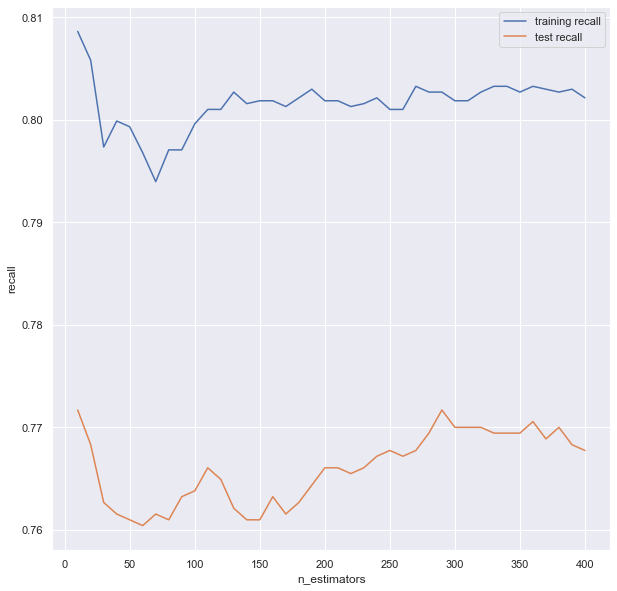

In [73]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_n_estimators"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_n_estimators"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("recall")
plt.legend()
plt.show()

In [74]:
# Instantiate Model with Tuned Hyperparameters
rfc = RandomForestClassifier(oob_score=True, random_state=42,
                            max_depth = 10, min_samples_leaf = 40, n_estimators = 10)

# Train Model
rfc.fit(X_train_pca, y_train)

# Predict
y_test_pred = rfc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 77% with 22% precision -- stable

             precision    recall  f1-score   support

          0       0.97      0.72      0.83      8179
          1       0.22      0.77      0.34       815

avg / total       0.90      0.73      0.78      8994

[[5917 2262]
 [ 185  630]]


## Model 2: Random Forest
- Tune max_features with the objective of getting better recall with better precision / at least without much loss in precision
- Fit best model on data and evaluate model

In [75]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'max_depth': [10], # learned above
    'min_samples_leaf': [40],
    'n_estimators': [10],
    'max_features': range(1,19,1)}

# Instantiate grid search
rfc_grid_search = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator = rfc_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 18 candidates, totalling 54 fits
[CV] max_depth=10, max_features=1, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=1, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=1, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=2, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=2, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=2, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=3, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=3, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=3, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=4, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, max_features=1, min_samples_leaf=40, n_estimators=10, score=0.7263513513513513, total=   0.0s
[CV] max_depth=10, max_features=4, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, ma

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0785s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  13 out of  54 | elapsed:    0.2s remaining:    0.7s


[CV]  max_depth=10, max_features=7, min_samples_leaf=40, n_estimators=10, score=0.7516891891891891, total=   0.1s
[CV] max_depth=10, max_features=17, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, max_features=7, min_samples_leaf=40, n_estimators=10, score=0.7732656514382402, total=   0.1s
[CV] max_depth=10, max_features=18, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, max_features=7, min_samples_leaf=40, n_estimators=10, score=0.7800338409475466, total=   0.1s
[CV]  max_depth=10, max_features=8, min_samples_leaf=40, n_estimators=10, score=0.7753378378378378, total=   0.1s
[CV]  max_depth=10, max_features=8, min_samples_leaf=40, n_estimators=10, score=0.7986463620981388, total=   0.1s
[CV]  max_depth=10, max_features=8, min_samples_leaf=40, n_estimators=10, score=0.7918781725888325, total=   0.1s
[CV]  max_depth=10, max_features=9, min_samples_leaf=40, n_estimators=10, score=0.7837837837837838, total=   0.1s
[CV] max_depth=10, max_features=9, min_samples_leaf=40

[Parallel(n_jobs=-1)]: Done  19 out of  54 | elapsed:    0.3s remaining:    0.5s


[CV]  max_depth=10, max_features=10, min_samples_leaf=40, n_estimators=10, score=0.7986463620981388, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, n_estimators=10, score=0.8057432432432432, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, n_estimators=10, score=0.7952622673434856, total=   0.1s
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, n_estimators=10, score=0.7884940778341794, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, n_estimators=10 
[CV] max_depth=10, max_features=15, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, max_features=9, min_samples_leaf=40, n_estimators=10, score=0.7952622673434856, total=   0.1s
[CV] max_depth=10, max_features=10, min_samples_leaf=40, n_estimators=10 
[CV]  max_depth=10, max_features=16, min_samples_leaf=40

[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed:    0.9s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [10], 'min_samples_leaf': [40], 'n_estimators': [10], 'max_features': range(1, 19)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [76]:
grid_search.best_score_, grid_search.best_params_

(0.798196166854566,
 {'max_depth': 10,
  'max_features': 13,
  'min_samples_leaf': 40,
  'n_estimators': 10})

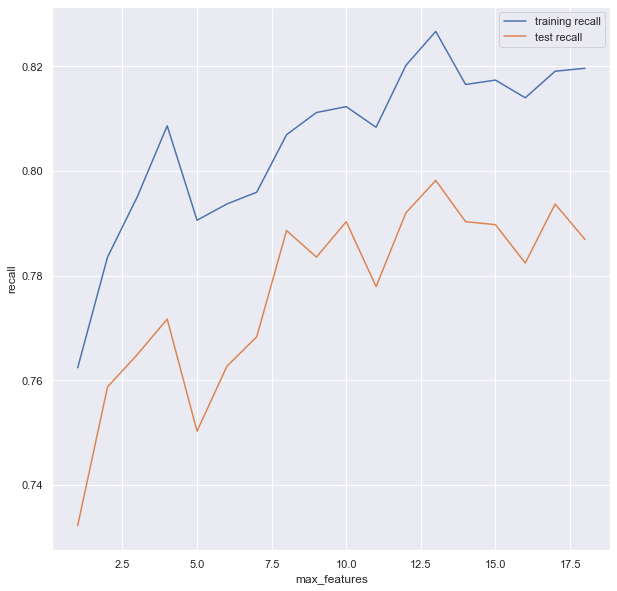

In [77]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_max_features"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_max_features"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("recall")
plt.legend()
plt.show()

In [78]:
# Instantiate Model with Tuned Hyperparameters
rfc = RandomForestClassifier(oob_score=True, random_state=42,
                            max_depth = 10, min_samples_leaf = 40, n_estimators = 10, max_features = 13)

# Train Model
rfc.fit(X_train_pca, y_train)

# Predict
y_test_pred = rfc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 77% with 22% precision -- stable

             precision    recall  f1-score   support

          0       0.97      0.72      0.83      8179
          1       0.22      0.77      0.34       815

avg / total       0.90      0.73      0.78      8994

[[5898 2281]
 [ 189  626]]


## Model 2: Random Forest
- Tune min_samples_split with the objective of getting better recall with better precision / at least without much loss in precision
- Fit best model on data and evaluate model

In [79]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'max_depth': [10], # learned above
    'min_samples_leaf': [40],
    'n_estimators': [10],
    'max_features': [13],
    'min_samples_split': [30, 40, 50, 60 ,70, 80, 90, 100]}

# Instantiate grid search
rfc_grid_search = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator = rfc_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=30, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=30, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=30, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=40, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=40, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=40, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=50, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=50, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=50, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=6

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1790s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   4 out of  24 | elapsed:    0.2s remaining:    1.0s
[Parallel(n_jobs=-1)]: Done   7 out of  24 | elapsed:    0.2s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  10 out of  24 | elapsed:    0.3s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  13 out of  24 | elapsed:    0.4s remaining:    0.3s


[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=70, n_estimators=10, score=0.7986463620981388, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.8006756756756757, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.8006756756756757, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7952622673434856, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.8003384094754653, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7986463620981388, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.7952622673434856, total=   0.2s
[CV]  max_depth=10, max_features=13, min_

[Parallel(n_jobs=-1)]: Done  16 out of  24 | elapsed:    0.4s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  19 out of  24 | elapsed:    0.4s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  22 out of  24 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:    0.4s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [10], 'min_samples_leaf': [40], 'n_estimators': [10], 'max_features': [13], 'min_samples_split': [30, 40, 50, 60, 70, 80, 90, 100]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [80]:
grid_search.best_score_, grid_search.best_params_

(0.7987598647125141,
 {'max_depth': 10,
  'max_features': 13,
  'min_samples_leaf': 40,
  'min_samples_split': 90,
  'n_estimators': 10})

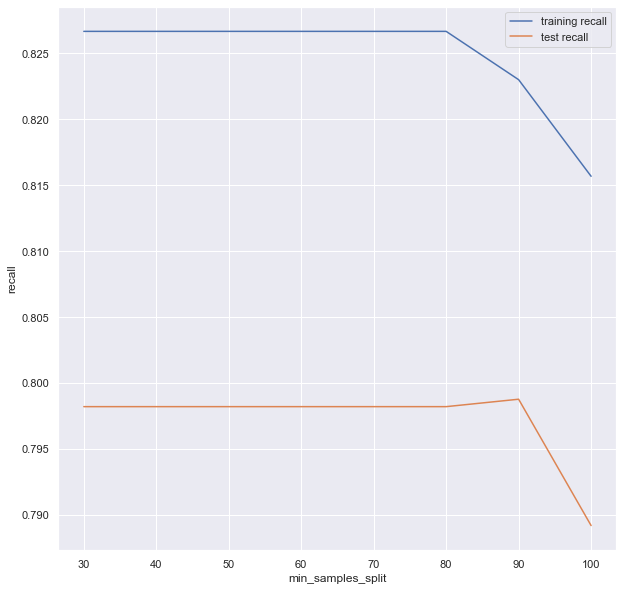

In [81]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_min_samples_split"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_min_samples_split"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("recall")
plt.legend()
plt.show()

In [88]:
# Instantiate Model with Tuned Hyperparameters
rfc = RandomForestClassifier(oob_score=True, random_state=42,
                max_depth = 10, min_samples_leaf = 40, n_estimators = 10, max_features = 13, min_samples_split=90)

# Train Model
rfc.fit(X_train_pca, y_train)

# Predict
y_test_pred = rfc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 78% with 21% precision -- stable

             precision    recall  f1-score   support

          0       0.97      0.72      0.82      8179
          1       0.21      0.78      0.34       815

avg / total       0.90      0.72      0.78      8994

[[5855 2324]
 [ 183  632]]


## Model 2: Random Forest
- Fine tune all hyperparameters using learnings from above iterations with the objective of getting better recall with better precision / at least without much loss in precision
- Fit best model on data and evaluate model

In [83]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'max_depth': [8, 9, 10, 11, 12], # learned above
    'min_samples_leaf': [30, 35, 40, 45, 50],
    'min_samples_split': [80, 85, 90, 95, 100],
    'n_estimators': [5, 7, 10, 12, 15], 
    'max_features': [11, 12, 13, 14, 15]
}

# Instantiate grid search
rfc_grid_search = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator = rfc_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 3125 candidates, totalling 9375 fits
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estima

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1138s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.2s


[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.777027027027027, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.7817258883248731, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=85, n_es

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.4s


[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.7804054054054054, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7732656514382402, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7766497461928934, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, n

[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.6s


[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7719594594594594, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7715736040609137, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7969543147208121, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=12, score=0.7837837837837838, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=

[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.9s


[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7804054054054054, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7817258883248731, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=95, 

[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.3s


[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.7901861252115059, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7901861252115059, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=30, min_samples_split=100, 

[Parallel(n_jobs=-1)]: Done  98 tasks      | elapsed:    1.6s


[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7884940778341794, total=   0.3s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7766497461928934, total=   0.2s
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7804054054054054, total=   0.1s
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7956081081081081, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV] max_depth=8, max_features=11, m

[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    2.1s


[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.7800338409475466, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7766497461928934, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=35, min_samples_split=10

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    2.5s


[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.7884940778341794, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.785472972972973, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.7905405405405406, 

[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    2.9s


[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7956081081081081, total=   0.2s
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7817258883248731, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7868020304568528, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split

[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    3.4s


[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.7681895093062606, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.7922297297297297, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7888513513513513, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=90,

[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=10, score=0.7681895093062606, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12 


[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    3.8s


[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.7732656514382402, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7766497461928934, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7787162162162162, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.7698815566835872, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split

[Parallel(n_jobs=-1)]: Done 290 tasks      | elapsed:    4.3s


[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.8023648648648649, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7749576988155669, total=   0.2s
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7800338409475466, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7715736040609137, total=   0.2s
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=8

[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7989864864864865, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7749576988155669, total=   0.2s
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=10 


[Parallel(n_jobs=-1)]: Done 328 tasks      | elapsed:    4.7s


[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=5, score=0.785472972972973, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.785472972972973, total=   0.1s
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV] max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7732656514382402, total=   0.1s
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.793918918918919, total=   0.1s
[CV] max_depth=8, max_features=11, min

[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=15 
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.7766497461928934, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.8071065989847716, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=5 


[Parallel(n_jobs=-1)]: Done 370 tasks      | elapsed:    5.2s


[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.7918781725888325, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.8040540540540541, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=15, score=0.8121827411167513, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=15 
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=85, n

[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.8108108108108109, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.8003384094754653, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7905405405405406, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.8104906937394247, total=   0.1s
[CV] max_depth=8, max_features=12,

[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:    5.7s


[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.7956081081081081, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7749576988155669, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7969543147208121, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.805414551607445, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=95

[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7868020304568528, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7868020304568528, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7817258883248731, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.7804054054054054, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n

[Parallel(n_jobs=-1)]: Done 458 tasks      | elapsed:    6.4s


[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=10, score=0.7868020304568528, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.785472972972973, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7986463620981388, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=10 
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.7749576988155669, total=   0.1s
[CV] max_depth=8, max_features=12, min_

[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.8087986463620981, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=7, score=0.8057432432432432, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80,

[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    7.0s


[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7800338409475466, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=85, 

[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.7820945945945946, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7800338409475466, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.8037225042301185, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.7956081081081081, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=90, n

[Parallel(n_jobs=-1)]: Done 554 tasks      | elapsed:    7.7s


[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV] max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=12, score=0.7766497461928934, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV] max_depth=8, max_features=12, mi

[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=7, score=0.7851099830795262, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.7749576988155669, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7804054054054054, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.7884940778341794, 

[Parallel(n_jobs=-1)]: Done 604 tasks      | elapsed:    8.5s


[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.7783417935702199, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=15 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.805414551607445, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=85, n_

[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.8023648648648649, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.8006756756756757, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split

[Parallel(n_jobs=-1)]: Done 658 tasks      | elapsed:    9.3s


[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.8040540540540541, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=5 
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=45, min_samples_split=95,

[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=5, score=0.7753378378378378, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7753378378378378, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=95, n

[Parallel(n_jobs=-1)]: Done 712 tasks      | elapsed:   10.2s


[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7956081081081081, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7956081081081081, total=   0.1s
[CV] max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7851099830795262, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=12, min_samples_leaf=50, min_samples_split=9

[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.8057432432432432, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.8023648648648649, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=90, 

[Parallel(n_jobs=-1)]: Done 770 tasks      | elapsed:   10.9s


[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.8037225042301185, total=   0.2s
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7800338409475466, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.785472972972973, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=85, 

[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.7922297297297297, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=85, n

[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   11.7s


[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.8006756756756757, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.8003384094754653, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.7901861252115059, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_

[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.793918918918919, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7952622673434856, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.8020304568527918, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=12, score=0.7989864864864865, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=8

[Parallel(n_jobs=-1)]: Done 890 tasks      | elapsed:   12.6s


[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.8125, total=   0.1s
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7800338409475466, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators

[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.8125, total=   0.3s
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7918781725888325, total=   0.3s
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=13,

[Parallel(n_jobs=-1)]: Done 952 tasks      | elapsed:   13.7s


[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=7, score=0.7800338409475466, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.7851099830795262, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7834179357021996, total=   0.3s
[CV]  max_depth=8, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7989864864864865, total=   0.3s
[CV]  max_depth=8, max_features=13,

[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.7834179357021996, total=   0.3s
[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7732656514382402, total=   0.2s
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=90, 

[Parallel(n_jobs=-1)]: Done 1018 tasks      | elapsed:   14.7s


[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7901861252115059, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV] max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.8023648648648649, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.7783417935702199, total=   0.2s
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.7888513513513513, total=   0.1s
[CV]  max_depth=8, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=13, m

[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7888513513513513, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7922297297297297, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=85, n_

[Parallel(n_jobs=-1)]: Done 1084 tasks      | elapsed:   15.7s


[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7732656514382402, total=   0.2s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.8037225042301185, total=   0.1s
[CV] max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.7922297297297297, total=   0.1s
[CV]  max_depth=8, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=8, max_features=13,

[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=15, score=0.7918781725888325, total=   0.4s
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.8206429780033841, total=   0.1s
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.8023648648648649, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.7868020304568528, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=90, n_es

[Parallel(n_jobs=-1)]: Done 1154 tasks      | elapsed:   16.9s


[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.8020304568527918, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.8087986463620981, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=10

[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7871621621621622, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.8192567567567568, total=   0.1s
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=85,

[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   18.1s


[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7766497461928934, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.7817258883248731, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.8006756756756757, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=90,

[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.785472972972973, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=7, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=85, n_

[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.8023648648648649, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.8040540540540541, total=   0.2s
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.7817258883248731, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=7 


[Parallel(n_jobs=-1)]: Done 1298 tasks      | elapsed:   19.5s


[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=12, score=0.7918781725888325, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=95, 

[CV] max_depth=8, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.8074324324324325, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=7, score=0.8108108108108109, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=7 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.766497461928934, total=   0.2s
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=85,

[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.8108108108108109, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=12 


[Parallel(n_jobs=-1)]: Done 1372 tasks      | elapsed:   20.9s


[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.8074324324324325, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.8023648648648649, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.766497461928934, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=85, n_

[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.793918918918919, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=85, n_

[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7871621621621622, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=90, 

[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:   22.2s


[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7580372250423012, total=   0.3s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=15 
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV] max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=90

[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.766497461928934, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.805414551607445, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7884940778341794, total=   0.2s
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=14, min_samples_leaf=50, min_samples_split=100, 

[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.8006756756756757, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.8121827411167513, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7851099830795262, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n

[Parallel(n_jobs=-1)]: Done 1528 tasks      | elapsed:   23.6s


[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.8003384094754653, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=95,

[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.8074324324324325, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.8138747884940778, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.793918918918919, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=5, score=0.7989864864864865, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=85, n

[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7868020304568528, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.8003384094754653, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=100, 

[Parallel(n_jobs=-1)]: Done 1610 tasks      | elapsed:   25.2s


[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=12, score=0.7884940778341794, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7783417935702199, total=   0.2s
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=5, score=0.7935702199661591, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.7884940778341794, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=

[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.8108108108108109, total=   0.3s
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7986463620981388, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.8057432432432432, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=90

[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7884940778341794, total=   0.2s
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.8125, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=12, score=0.7972972972972973, total= 

[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   26.8s


[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=7 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.8023648648648649, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.8091216216216216, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=7 
[CV]  max_depth=8, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.7834179357021

[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7681895093062606, total=   0.1s
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.8006756756756757, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=85, n_

[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7956081081081081, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7989864864864865, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=1

[Parallel(n_jobs=-1)]: Done 1778 tasks      | elapsed:   28.3s


[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.7868020304568528, total=   0.3s
[CV] max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=8, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV] max_depth=8, max_features=15

[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=10 
[CV]  max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7922297297297297, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7918781725888325, total=   0.2s
[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7766497461928934, total=   0.1s
[CV] max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=95, n_e

[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7719594594594594, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7952622673434856, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=8, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n

[Parallel(n_jobs=-1)]: Done 1864 tasks      | elapsed:   29.7s


[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7969543147208121, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=7 
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.7851099830795262, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.7986463620981388, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=80, n

[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7820945945945946, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7901861252115059, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7635135135135135, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.7698815566835872, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=90

[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7635135135135135, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.785472972972973, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, 

[Parallel(n_jobs=-1)]: Done 1954 tasks      | elapsed:   31.0s


[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.7868020304568528, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=15, score=0.7901861252115059, total=   0.2s
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.7787162162162162, total=   0.1s
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=85, n

[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7732656514382402, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.783417935

[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7753378378378378, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.7820945945945946, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.7749576988155669, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=85, n

[Parallel(n_jobs=-1)]: Done 2044 tasks      | elapsed:   32.2s


[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=12, score=0.7817258883248731, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7884940778341794, total=   0.2s
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=90, 

[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7766497461928934, total=   0.3s
[CV] max_depth=9, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.8071065989847716, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=85

[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.7715736040609137, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.7804054054054054, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.7631133671742809, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7681895093062606, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_e

[Parallel(n_jobs=-1)]: Done 2138 tasks      | elapsed:   33.5s


[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7597292724196277, total=   0.2s
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=10, score=0.766497461928934, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7681895093062606, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=45, min_samples_split=100,

[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7766497461928934, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.805414551607445, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=7, score=0.7614213197969543, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=85, n_e

[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=15 
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7614213197969543, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7851099830795262, total=   0.1s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=1

[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   34.9s


[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.8006756756756757, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=85

[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.8003384094754653, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.8023648648648649, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7749576988155669, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7851099830795262, total=   0.1s
[CV] max_depth=9, max_features=12, min_

[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV] max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=15 
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7851099830795262, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7851099830795262, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_

[Parallel(n_jobs=-1)]: Done 2330 tasks      | elapsed:   36.5s


[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.805414551607445, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=12, score=0.7851099830795262, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=90, n

[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7837837837837838, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7871621621621622, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=

[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.793918918918919, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.8074324324324325, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7817258883248731, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=90, 

[Parallel(n_jobs=-1)]: Done 2428 tasks      | elapsed:   38.2s


[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7969543147208121, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7884940778341794, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=100,

[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.7787162162162162, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=12 
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.7787162162162162, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.793918918918919

[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.7800338409475466, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7986463620981388, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.7800338409475466, total=   0.3s
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV] max_depth=9, max_features=12, min

[Parallel(n_jobs=-1)]: Done 2530 tasks      | elapsed:   39.8s


[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=5 
[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV] max_depth=9, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=80

[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=5, score=0.8240270727580372, total=   0.1s
[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=90, n_

[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7901861252115059, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.78510998307952

[Parallel(n_jobs=-1)]: Done 2632 tasks      | elapsed:   41.5s


[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.8023648648648649, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.7935702199661591, total=   0.2s
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=85, n_

[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.8003384094754653, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=10, score=0.7986463620981388, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.8071065989847716, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV]  max_depth=9, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=12, score=0.7989864864864865, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=80

[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.8104906937394247, total=   0.1s
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.8057432432432432, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=10 
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.8040540540540541, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=90, n_

[Parallel(n_jobs=-1)]: Done 2738 tasks      | elapsed:   43.4s


[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=5, score=0.8121827411167513, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=7, score=0.8037225042301185, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7969543147208121, total=   0.3s
[CV]  max_depth=9, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=9, max_features=13,

[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.8125, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7884940778341794, total=   0

[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=12, score=0.7817258883248731, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7905405405405406, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7989864864864865, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7817258883248731, total=   0.1s
[CV] max_depth=9, max_features=13, 

[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   45.3s


[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=15 
[CV]  max_depth=9, max_features=13, min_samples_leaf=40, min_samples_split=100,

[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.7783417935702199, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=5 
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7698815566835872, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=100

[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.7972972972972973, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7766497461928934, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=5, score=0.8037225042301185, total=   0.1s
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, 

[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=15 
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=15 


[Parallel(n_jobs=-1)]: Done 2954 tasks      | elapsed:   47.1s


[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7922297297297297, total=   0.2s
[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7732656514382402, total=   0.3s
[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7732656514382402, total=   0.3s
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=9, max_features=13, m

[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.8006756756756757, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7986463620981388, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7918781725888325, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.7851099830795262, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=85, n

[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7901861252115059, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7851099830795262, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.785472972972973, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.8020304568527918, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=95, n

[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV]  max_depth=9, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=5, score=0.7972972972972973, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7888513513513513, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85,

[Parallel(n_jobs=-1)]: Done 3064 tasks      | elapsed:   49.2s


[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=85, n_e

[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7952622673434856, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7884940778341794, total=   0.3s
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7989864864864865, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.8074324324324325, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=100

[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.7715736040609137, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7868020304568528, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.8125, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7817258883248731, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators

[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=12 


[Parallel(n_jobs=-1)]: Done 3178 tasks      | elapsed:   51.1s


[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.7614213197969543, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7986463620981388, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7580372250423012, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=40, min_samples_split=95

[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.8057432432432432, total=   0.1s
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.8057432432432432, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=85, n_

[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.8074324324324325, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7749576988155669, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.7698815566835872, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=95, n

[CV]  max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7614213197969543, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85,

[Parallel(n_jobs=-1)]: Done 3292 tasks      | elapsed:   53.1s


[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=12 
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=80, n

[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7871621621621622, total=   0.2s
[CV] max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=95

[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.793918918918919, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.793918918918919, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=80, n_e

[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7851099830795262, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7986463620981388, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7918781725888325, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.7935702199661591, total=   0.4s
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=90,

[Parallel(n_jobs=-1)]: Done 3410 tasks      | elapsed:   55.2s


[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.8037225042301185, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7868020304568528, total=   0.2s
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.7986463620981388, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=30, min_samples_split=9

[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=15, score=0.8040540540540541, total=   0.4s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=15, score=0.8020304568527918, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7884940778341794, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=85, n

[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.8020304568527918, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.8023648648648649, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7868020304568528, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=5, score=0.8158783783783784, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=100,

[CV]  max_depth=9, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.805414551607445, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.8023648648648649, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7884940778341794, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=80, n

[Parallel(n_jobs=-1)]: Done 3528 tasks      | elapsed:   57.6s


[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.7851099830795262, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.8040540540540541, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7766497461928934, total=   0.2s
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV] max_depth=9, max_features=15, min_

[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=12, score=0.7868020304568528, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.8091216216216216, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7766497461928934, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=40, min_samples_split=

[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7681895093062606, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.7972972972972973, total=   0.3s
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7783417935702199, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=90, n_e

[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.8040540540540541, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.8057432432432432, total=   0.1s
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.8040540540540541, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=5 
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7851099830795262, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=1

[Parallel(n_jobs=-1)]: Done 3650 tasks      | elapsed:   59.8s


[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.7952622673434856, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7817258883248731, total=   0.2s
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.7884940778341794, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=45, min_samples_split=1

[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7766497461928934, total=   0.2s
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=10 
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=90, n

[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7956081081081081, total=   0.3s
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV] max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7834179357021996, total=   0.3s
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split

[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=9, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.7753378378378378, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.7817258883248731, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.773265651

[Parallel(n_jobs=-1)]: Done 3772 tasks      | elapsed:  1.0min


[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7766497461928934, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7597292724196277, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.7787162162162162, total=   0.3s
[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_

[CV] max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7918781725888325, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7986463620981388, total=   0.3s
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7736486486486487, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_s

[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.7715736040609137, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=7 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.785472972972973, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.7868020304568528, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_spli

[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=7 
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7736486486486487, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=10, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV]  max_d

[Parallel(n_jobs=-1)]: Done 3898 tasks      | elapsed:  1.1min


[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7820945945945946, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7868020304568528, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7719594594594594, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_

[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.7753378378378378, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.7804054054054054, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.7698815566835872, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=12, score=0.7766497461928934, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=40, min_sample

[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.7681895093062606, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.8071065989847716, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7766497461928934, total=   0.3s
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.793918918918919, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.7989864864864865, to

[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7783417935702199, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=5 
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.766497461928934, total=   0.1s
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.7732656514382402, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_

[Parallel(n_jobs=-1)]: Done 4024 tasks      | elapsed:  1.1min


[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.8074324324324325, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.7749576988155669, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7989864864864865, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_sam

[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7648054145516074, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7766497461928934, total=   0.3s
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7648054145516074, total=   0.2s
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_s

[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.7648054145516074, total=   0.2s
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7631133671742809, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=5, score=0.8155668358714044, total=   0.1s
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV] max_depth=10, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=11, min_samples_leaf=50, min_samp

[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.7783417935702199, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.7817258883248731, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_spl

[Parallel(n_jobs=-1)]: Done 4154 tasks      | elapsed:  1.1min


[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.8023648648648649, total=   0.1s
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.8037225042301185, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV] max_depth=10, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=30, min_samples

[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7868020304568528, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7922297297297297, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7935702199661591, total=   0.1s
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_sp

[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=5 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7851099830795262, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=5 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.78172

[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7834179357021996, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.8006756756756757, total=   0.1s
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.8074324324324325, total=   0.2s
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.8057432432432432, total=   0.2s
[CV] max_depth=10, max_featur

[Parallel(n_jobs=-1)]: Done 4284 tasks      | elapsed:  1.2min


[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.8006756756756757, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_s

[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV] max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.8023648648648649, total=   0.1s
[CV]  max_depth=10, max_features=12, min_samples_leaf=40, min_sample

[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.7787162162162162, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=12 
[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_sp

[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.8121827411167513, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7800338409475466, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.8006756756756757, total=   0.1s
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples

[Parallel(n_jobs=-1)]: Done 4418 tasks      | elapsed:  1.2min


[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV]  max_depth=10, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7989864864864865, total=   0.2s
[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_

[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.8240270727580372, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=10, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=10, max_features=12, min_samples_leaf=50, min_sample

[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=15, score=0.8006756756756757, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=15 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.802030

[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.805414551607445, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.8087986463620981, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.7905405405405406, total=   0.1s
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=10, max_featur

[Parallel(n_jobs=-1)]: Done 4552 tasks      | elapsed:  1.2min


[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7972972972972973, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7935702199661591, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV]  max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7956081081081081, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=15 
[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples

[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.8003384094754653, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.7986463620981388, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=12, score=0.8023648648648649, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.8003384094754653, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_spl

[CV] max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=5, score=0.7922297297297297, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.8057432432432432, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.795262

[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.8138747884940778, total=   0.1s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.8071065989847716, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_spl

[Parallel(n_jobs=-1)]: Done 4690 tasks      | elapsed:  1.3min


[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.7884940778341794, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7905405405405406, total=   0.1s
[CV]  max_depth=10, max_features=13, min_samples_leaf=40, min_sample

[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.8003384094754653, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_spli

[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.7715736040609137, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV]  max_depth=10, max_features=13, min_samples_leaf=45, min_samp

[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=5 
[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.78885135

[Parallel(n_jobs=-1)]: Done 4828 tasks      | elapsed:  1.3min


[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7918781725888325, total=   0.3s
[CV] max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV]  max_depth=10, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7888513513513513, total=   0.1s
[CV] max_depth=10, max_featu

[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.8003384094754653, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.785472972972973, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.7986463620981388, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.790540540

[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.805414551607445, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.817258883248731, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7922297297297297, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split

[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7986463620981388, total=   0.3s
[CV]  max_depth=10, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV] max_depth=10, max_featu

[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.7766497461928934, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=12 


[Parallel(n_jobs=-1)]: Done 4970 tasks      | elapsed:  1.4min


[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.8074324324324325, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7766497461928934, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.7817258883248731, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_sp

[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.785472972972973, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_s

[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.8108108108108109, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.8040540540540541, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.7817258883248731, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.80033840

[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.8003384094754653, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=7, score=0.7732656514382402, total=   0.2s
[CV]  max_depth=10, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples

[Parallel(n_jobs=-1)]: Done 5112 tasks      | elapsed:  1.4min


[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.7648054145516074, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.8074324324324325, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.8108108108108109, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=12 
[CV] max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_

[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7648054145516074, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV]  max_depth=10, max_features=14, min_samples_leaf=45, min_samples_s

[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV] max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_

[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=10, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7972972972972973, total=   0.1s
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=5, score=0.7956081081081081, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_sp

[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7817258883248731, total=   0.3s
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=12, score=0.8006756756756757, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=12 


[Parallel(n_jobs=-1)]: Done 5258 tasks      | elapsed:  1.5min


[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.7986463620981388, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=12, score=0.7800338409475466, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.8057432432432432, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_sp

[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.8074324324324325, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.803

[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.8003384094754653, total=   0.1s
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7918781725888325, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=10 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7986463620981388, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.8057432432432432, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_spl

[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.79

[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.8003384094754653, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.8023648648648649, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.8091216216216216, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.7918781725888325, total=   0.4s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_sp

[Parallel(n_jobs=-1)]: Done 5404 tasks      | elapsed:  1.5min


[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7884940778341794, total=   0.3s
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.8057432432432432, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7935702199661591, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_s

[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7800338409475466, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.8006756756756757, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=40, min_samples_

[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7783417935702199, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_sp

[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7989864864864865, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7817258883248731, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samp

[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=7, score=0.7698815566835872, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7918781725888325, total=   0.3s
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=10, max_feat

[Parallel(n_jobs=-1)]: Done 5554 tasks      | elapsed:  1.5min


[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7956081081081081, total=   0.3s
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.8006756756756757, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=12 
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.78341793

[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=15 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7766497461928934, total=   0.3s
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV] max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15 
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7918781725888325, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7922297297297297, total=   0.2s
[CV]  max_depth=10, max_features=15, min_samples_leaf=50, min_samples

[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.8037225042301185, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.8003384094754653, total=   0.1s
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.7851099830795262, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_s

[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.7868020304568528, total=   0.1s
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.785472972972973, total=   0.3s
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.7753378378378378, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.7715736040609137, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=30, min_sampl

[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=15, score=0.7918781725888325, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.785472972972973, total=   0.2s
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=10, score=0.7800338409475466, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7901861

[Parallel(n_jobs=-1)]: Done 5704 tasks      | elapsed:  1.6min


[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.7868020304568528, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=15, score=0.7918781725888325, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_sp

[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7834179357021996, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=7, score=0.7783417935702199, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_sampl

[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7851099830795262, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.7837837837837838, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7753378378378378, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_s

[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_sampl

[CV]  max_depth=11, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.7817258883248731, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.7989864864864865, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.7989864864864865, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_s

[Parallel(n_jobs=-1)]: Done 5858 tasks      | elapsed:  1.6min


[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.7681895093062606, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.7681895093062606, total=   0.3s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_spl

[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.785472972972973, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.805414551607445, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7597292724196277, total=   0.1s
[CV]  max_depth=11, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.7732656514382402, total=   0.2s
[CV] max_depth=11, max_feature

[CV] max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7719594594594594, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7631133671742809, total=   0.1s
[CV] max_depth=11, max_features=1

[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.7732656514382402, total=   0.3s
[CV] max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7956081081081081, total=   0.2s
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV]  max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7952622673434856, total=   0.1s
[CV] max_depth=11, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV] max_depth=11, max_feat

[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=12, score=0.7956081081081081, total=   0.2s
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.7888513513513513, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7935702199661591, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.7817258883248731, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_sp

[Parallel(n_jobs=-1)]: Done 6012 tasks      | elapsed:  1.7min


[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.805414551607445, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=15, score=0.8155668358714044, total=   0.3s
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.7989864864864865, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7766497461928934, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_sp

[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.7986463620981388, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7989864864864865, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7956081081081081, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=30, min_samples

[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_

[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=12, score=0.7732656514382402, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=35, min_samples_

[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=10, score=0.8006756756756757, total=   0.2s
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7989864864864865, total=   0.1s
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.7986463620981388, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_spl

[Parallel(n_jobs=-1)]: Done 6170 tasks      | elapsed:  1.7min


[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.793918918918919, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7935702199661591, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.8071065989847716, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_spl

[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV]  max_depth=11, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_

[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.7787162162162162, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=10 
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7905405405405406, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7922297297297297, total=   0.2s
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV]  max_depth=11, max_features

[CV] max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.7952622673434856, total=   0.3s
[CV]  max_depth=11, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7884940778341794, total=   0.4s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.8240270727580372, total=   0.1s
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_sampl

[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7749576988155669, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7989864864864865, total=   0.2s
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=10 
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_s

[Parallel(n_jobs=-1)]: Done 6328 tasks      | elapsed:  1.8min


[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7851099830795262, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7851099830795262, total=   0.3s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=11, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7956081081081081, total=   0.2s
[CV] max_depth=11, max_features=12, min_samples_leaf=50, min_samples_

[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=5, score=0.8071065989847716, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7969543147208121, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.8023648648648649, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7922297297297297, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_sp

[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.8087986463620981, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.8037225042301185, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.8020304568527918, total=   0.3s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_spl

[CV]  max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7969543147208121, total=   0.3s
[CV] max_depth=11, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=15 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7972972972972973, total=   0.1s
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7952622673434856, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples

[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.8121827411167513, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.8091216216216216, total=   0.1s
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_sp

[Parallel(n_jobs=-1)]: Done 6490 tasks      | elapsed:  1.8min


[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7834179357021996, total=   0.3s
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7905405405405406, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7884940778341794, total=   0.2s
[CV]  max_depth=11, max_features=13, min_samples_leaf=35, min_sampl

[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7884940778341794, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7986463620981388, total=   0.2s
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.8138747884940778, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=90, n_estimators=5 
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_s

[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7972972972972973, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7884940778341794, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7, score=0.7905405405405406, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_sampl

[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.7698815566835872, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.7956081081081081, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV]  max_depth=11, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7834179357021996, total=   0.3s
[CV] max_depth=11, max_featu

[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.8006756756756757, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV] max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.7715736040609137, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.8023648648648649, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=12, score=0.7715736040609137, total=   0.2s
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_sampl

[Parallel(n_jobs=-1)]: Done 6652 tasks      | elapsed:  1.8min


[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7749576988155669, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_spl

[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7888513513513513, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7918781725888325, total=   0.3s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_s

[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV] max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.7922297297297297, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7888513513513513, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samp

[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=7, score=0.8037225042301185, total=   0.2s
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=12, score=0.7918781725888325, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=15 
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=5, score=0.8206429780033841, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.7884940

[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7986463620981388, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=10, score=0.8006756756756757, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=7, score=0.7956081081081081, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=30, min_sample

[Parallel(n_jobs=-1)]: Done 6818 tasks      | elapsed:  1.9min


[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7952622673434856, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7935702199661591, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_spl

[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7989864864864865, total=   0.2s
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7884940778341794, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.8074324324324325, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7952622673434856, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=35, min_samples_

[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=7, score=0.7698815566835872, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.8071065989847716, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.8125, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=85, n_est

[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.8057432432432432, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.7614213197969543, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7986463620981388, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=40, min_samples_s

[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.7905405405405406, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=11, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.8003384094754653, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.80574

[Parallel(n_jobs=-1)]: Done 6984 tasks      | elapsed:  1.9min


[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.8023648648648649, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=12 
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_s

[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7648054145516074, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.793918918918919, total=   0.1s
[CV]  max_depth=11, max_features=14, min_samples_leaf=45, min_samples

[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=12 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7972972972972973, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7732656514

[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7614213197969543, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.7614213197969543, total=   0.3s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=11, max_features=14, min_samples_leaf=50, min_samples

[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.8057432432432432, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.7986463620981388, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.8020304568527918, total=   0.2s
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7868020304568528, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=12 
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples

[Parallel(n_jobs=-1)]: Done 7154 tasks      | elapsed:  2.0min


[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7851099830795262, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.8040540540540541, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples

[CV] max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=15 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.8138747884940778, total=   0.1s
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7986463620981388, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7868020304568528, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_

[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7783417935702199, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.7901861252115059, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7972972972972973, total=   0.4s
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.8040540540540541, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_

[CV] max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=7, score=0.7834179357021996, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.8006756756756757, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.8057432432432432, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=11, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7969543147208121, total=   0.3s
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_sp

[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.8091216216216216, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.8091216216216216, total=   0.1s
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.8040540540540541, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7935702199661591, total=   0.2s
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV] max_depth=11, max_features

[Parallel(n_jobs=-1)]: Done 7324 tasks      | elapsed:  2.1min


[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=5, score=0.8125, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=12 
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.8023648648648649, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=15 
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.7935702199661591, total=   0.1s
[CV]  max_depth=11, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV] max_depth=11, max_features=15, mi

[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.7783417935702199, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=7, score=0.8006756756756757, total=   0.2s
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_spl

[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.8006756756756757, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7817258883248731, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=5 
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=45, min_samp

[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7922297297297297, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7766497461928934, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=10 
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_spl

[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15 
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7956081081081081, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.7901861252115059, total=   0.3s
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7698815566835872, total=   0.1s
[CV] max_depth=11, max_features=15, min_samples_leaf=50, min_samples

[Parallel(n_jobs=-1)]: Done 7498 tasks      | elapsed:  2.1min


[CV]  max_depth=11, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.768581081081081, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.777027027027027, total=   0.2s
[CV] max_depth=12, max_features=

[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7986463620981388, total=   0.2s
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=12, score=0.7820945945945946, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.7753378378378378, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=95, n_estimators=10, score=0.7787162162162162, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_sampl

[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.7901861252115059, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7884940778341794, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=30, min_samples_sp

[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7787162162162162, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.7834179357021996, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=35, min_samples_s

[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7901861252115059, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7851099830795262, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7702702702702703, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_spl

[Parallel(n_jobs=-1)]: Done 7672 tasks      | elapsed:  2.1min


[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=5, score=0.7681895093062606, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7905405405405406, total=   0.3s
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7753378378378378, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV] max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7698815566835872, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=90, n_estimators=10, score=0.766497461928934, total=   0.2s
[CV] max_depth=12, max_features=

[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.7783417935702199, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.766497461928934, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=11, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.7922297297297297, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_

[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=5, score=0.7989864864864865, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=80, n_estimators=15, score=0.7783417935702199, total=   0.3s
[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.7989864864864865, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=10 
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=10 
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7817258883248731, total=   0.2s
[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7820945945945946, total=   0.1s
[CV] max_depth=12, max_featur

[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV]  max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.7749576988155669, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7952622673434856, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=5, score=0.805414551607445, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=80, n_estimators=7 
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_s

[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7719594594594594, total=   0.1s
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7766497461928934, total=   0.3s
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=7, score=0.7631133671742809, total=   0.1s
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.7648054145516074, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_s

[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=5 
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=10 


[Parallel(n_jobs=-1)]: Done 7850 tasks      | elapsed:  2.2min


[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.8006756756756757, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7783417935702199, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=11, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_s

[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.7851099830795262, total=   0.3s
[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=80, n_estimators=15, score=0.7989864864864865, total=   0.3s
[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=5 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7834179357021996, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=10 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=85, n_estimators=12, score=0.7956081081081081, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=5 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_s

[CV] max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=100, n_estimators=12 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=95, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=5, score=0.7905405405405406, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=12, min_samples_leaf=30, min_samples_split=90, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=80, n_estimators=5, score=0.7884940778341794, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_s

[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=12, score=0.7851099830795262, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.7952622673434856, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=5, score=0.805414551607445, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_spli

[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7918781725888325, total=   0.3s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=95, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7817258883248731, total=   0.2s
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.8074324324324325, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=12 
[CV] max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=10 
[CV]  max_depth=12, max_features=12, min_samples_leaf=35, min_samples_split=100, n_estimators=7, score=0.8074324324324325, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samp

[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7834179357021996, total=   0.2s


[Parallel(n_jobs=-1)]: Done 8028 tasks      | elapsed:  2.2min


[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=10 
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7766497461928934, total=   0.1s
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=12, score=0.7834179357021996, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=12 
[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=7, score=0.785472972972973, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_spl

[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.793918918918919, total=   0.3s
[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7820945945945946, total=   0.3s
[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7800338409475466, total=   0.3s
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=5 
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples

[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.7783417935702199, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=40, min_samples_split=100, n_estimators=15, score=0.7935702199661591, total=   0.3s
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12, score=0.7922297297297297, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=90, n_estimators=10 
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_

[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.7935702199661591, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=95, n_estimators=10, score=0.8040540540540541, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=12 
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=7, score=0.7969543147208121, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=5, score=0.8121827411167513, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=45, min_samp

[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=5, score=0.8240270727580372, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=80, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=7 
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_spl

[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7749576988155669, total=   0.3s
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=12 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.8240270727580372, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samp

[Parallel(n_jobs=-1)]: Done 8210 tasks      | elapsed:  2.3min


[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV] max_depth=12, max_features=12, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  max_depth=12, max_features=12, min_samples_leaf=50, min_samp

[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=10, score=0.8020304568527918, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=15, score=0.7884940778341794, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=90, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=85, n_estimators=7, score=0.8104906937394247, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_spl

[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.8006756756756757, total=   0.1s
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.7905405405405406, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=12, score=0.7989864864864865, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=5 
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_sample

[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=7, score=0.8037225042301185, total=   0.1s
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=12, score=0.7868020304568528, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.817258883248731, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=13, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.7969543147208121, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_spl

[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=15, score=0.7969543147208121, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=90, n_estimators=15 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.8091216216216216, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples

[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7952622673434856, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=12, score=0.7918781725888325, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.8125, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7 


[Parallel(n_jobs=-1)]: Done 8392 tasks      | elapsed:  2.3min


[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7952622673434856, total=   0.1s
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.8006756756756757, total=   0.3s
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7884940778341794, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=13, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples

[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7969543147208121, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=95, n_estimators=12, score=0.8006756756756757, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=40, min_samples_s

[CV]  max_depth=12, max_features=13, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=0.7817258883248731, total=   0.3s
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.7972972972972973, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=80, n_estimators=10, score=0.7956081081081081, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.7972972972972973, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_

[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7698815566835872, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_s

[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7922297297297297, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=15, score=0.7884940778341794, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=80, n_estimators=7, score=0.7749576988155669, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_sampl

[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7935702199661591, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7871621621621622, total=   0.1s
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7749576988155669, total=   0.1s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7888513513513513, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_sp

[Parallel(n_jobs=-1)]: Done 8578 tasks      | elapsed:  2.4min


[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7918781725888325, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7888513513513513, total=   0.3s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=90, n_estimators=12, score=0.7972972972972973, total=   0.2s
[CV] max_depth=12, max_features=13, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=13, min_samples_leaf=50, min_samples

[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.8003384094754653, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.785472972972973, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.7956081081081081, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=80, n_estimators=5, score=0.8040540540540541, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_spli

[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=12, score=0.7986463620981388, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.805414551607445, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.817258883248731, total=   0.1s
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split

[CV] max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7972972972972973, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=80, n_estimators=12 
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=14, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_sample

[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=10 
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7, score=0.8074324324324325, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.7766497461928934, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=85, n_estimators=15, score=0.79729729

[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7681895093062606, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=12 
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=95, n_estimators=15, score=0.7888513513513513, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=14, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples

[Parallel(n_jobs=-1)]: Done 8764 tasks      | elapsed:  2.5min


[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=10, score=0.8006756756756757, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.8071065989847716, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7817258883248731, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=12, score=0.7884940778341794, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_s

[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=90, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=7, score=0.8057432432432432, total=   0.1s
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.8057432432432432, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.7817258883248731, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=14, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7868020304568528, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=40, min_samples_

[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.7868020304568528, total=   0.1s
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=12, score=0.766497461928934, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=12 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=80, n_estimators=7, score=0.7648054145516074, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=7, score=0.8108108108108109, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_spli

[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=10 
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=10, score=0.7800338409475466, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.8023648648648649, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=90, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=5 
[CV]  max_dept

[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7749576988155669, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7972972972972973, total=   0.3s
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=95, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=45, min_samples_split=100, n_estimators=12, score=0.7901861252115059, total=   0.2s
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV]  max_depth=12, max_feat

[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=5, score=0.7972972972972973, total=   0.1s
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=5, score=0.7800338409475466, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=12 
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=90, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=15 
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7732656514382402, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split

[Parallel(n_jobs=-1)]: Done 8954 tasks      | elapsed:  2.5min


[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=85, n_estimators=15, score=0.7614213197969543, total=   0.3s
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=100, n_estimators=7 
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=14, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7956081081081081, total=   0.1s
[CV] max_depth=12, max_features=14, min_samples_leaf=50, min_samples_s

[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=10, score=0.7935702199661591, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=7, score=0.7918781725888325, total=   0.1s
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=12, score=0.7868020304568528, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=80, n_estimators=12 
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_s

[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=5, score=0.8104906937394247, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=7, score=0.7868020304568528, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=10 
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=90, n_estimators=10, score=0.7901861252115059, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=85, n_estimators=15, score=0.8006756756756757, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=30, min_samples_s

[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=15, score=0.805414551607445, total=   0.4s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=95, n_estimators=15, score=0.7969543147208121, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5, score=0.8074324324324325, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=80, n_estimators=10, score=0.8074324324324325, total=   0.2s
[CV]  max_depth=12, max_features=15, min_samples_leaf=30, min_samples_split=100, n_estimators=12, score=0.8138747884940778, total=   0.3s
[CV] max_depth=12, max_feature

[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.8108108108108109, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=5, score=0.7901861252115059, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=12, score=0.8023648648648649, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=90, n_estimators=10, score=0.8040540540540541, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_spl

[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=7, score=0.7834179357021996, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=5, score=0.8003384094754653, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=10, score=0.7969543147208121, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=15, score=0.7918781725888325, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=35, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples

[Parallel(n_jobs=-1)]: Done 9144 tasks      | elapsed:  2.6min


[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.8040540540540541, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=7, score=0.7766497461928934, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=10 
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15, score=0.8108108108108109, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=80, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=5, score=0.7969543147208121, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=35, min_samples_sp

[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=85, n_estimators=15, score=0.8023648648648649, total=   0.4s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=15, score=0.7868020304568528, total=   0.4s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=90, n_estimators=12, score=0.7989864864864865, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=40, min_samples_

[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=95, n_estimators=15, score=0.7952622673434856, total=   0.3s
[CV]  max_depth=12, max_features=15, min_samples_leaf=40, min_samples_split=100, n_estimators=12, score=0.7969543147208121, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=10 
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=80, n_estimators=5, score=0.8023648648648649, total=   0.1s
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=5, score=0.8023648648648649, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=5 
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_

[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=12, score=0.7851099830795262, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=90, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=7, score=0.7851099830795262, total=   0.2s
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=85, n_estimators=15, score=0.7868020304568528, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=5, score=0.7918781725888325, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=95, n_estimators=15 
[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_spl

[CV] max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=15 
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=45, min_samples_split=100, n_estimators=10, score=0.7851099830795262, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.793918918918919, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=10, score=0.7918781725888325, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=80, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=5, score=0.783417

[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=10 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=5, score=0.7834179357021996, total=   0.1s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=5 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=85, n_estimators=12, score=0.7783417935702199, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=12 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=7, score=0.7922297297297297, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=7 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=90, n_estimators=15, score=0.7922297297297297, total=   0.3s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_spl

[Parallel(n_jobs=-1)]: Done 9352 out of 9375 | elapsed:  2.6min remaining:    0.4s


[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.7922297297297297, total=   0.2s
[CV] max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15 
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.7922297297297297, total=   0.2s
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=15, score=0.7901861252115059, total=   0.2s
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=0.7681895093062606, total=   0.1s
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=12, score=0.7956081081081081, total=   0.2s
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=95, n_estimators=15, score=0.7901861252115059, total=   0.2s
[CV]  max_depth=12, max_features=15, min_samples_leaf=50, min_samples_split=1

[Parallel(n_jobs=-1)]: Done 9375 out of 9375 | elapsed:  2.6min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [8, 9, 10, 11, 12], 'min_samples_leaf': [30, 35, 40, 45, 50], 'min_samples_split': [80, 85, 90, 95, 100], 'n_estimators': [5, 7, 10, 12, 15], 'max_features': [11, 12, 13, 14, 15]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [84]:
grid_search.best_score_, grid_search.best_params_

(0.8111612175873731,
 {'max_depth': 9,
  'max_features': 12,
  'min_samples_leaf': 40,
  'min_samples_split': 100,
  'n_estimators': 5})

In [85]:
# Predict
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 76% with 21% precision -- 2pt loss in recall -- worse than previous model

             precision    recall  f1-score   support

          0       0.97      0.72      0.83      8179
          1       0.21      0.76      0.33       815

avg / total       0.90      0.72      0.78      8994

[[5881 2298]
 [ 192  623]]


# Model 3: XGBoost
- Fit model with default hyperparameters and evaluate goodness of fit

In [87]:
# Convert Data to DMatrix
X_train_xgb = xgb.DMatrix(X_train_pca, label=y_train)
X_test_xgb = xgb.DMatrix(X_test)

# Train Model
bst = xgb.train({'objective':'binary:logistic'}, X_train_xgb)

# Predict
y_test_pred = list(map(lambda x: 1 if x > 0.5 else 0, bst.predict(X_test_xgb)))

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 81% with 21% precision

             precision    recall  f1-score   support

          0       0.97      0.69      0.81      8179
          1       0.21      0.81      0.33       815

avg / total       0.90      0.70      0.77      8994

[[5668 2511]
 [ 154  661]]


# Model 3: XGBoost
- Tune n_estimators with the objective of getting better recall with better precision / at least without much loss in precision
- Fit on dataset and evaluate goodness of fit

In [89]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'n_estimators': range(10, 410, 10)
}

# Instantiate grid search
xgb_grid_search = XGBClassifier(random_state=42)
grid_search = GridSearchCV(estimator = xgb_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 40 candidates, totalling 120 fits
[CV] n_estimators=10 .................................................
[CV] n_estimators=10 .................................................
[CV] n_estimators=10 .................................................
[CV] n_estimators=20 .................................................
[CV] n_estimators=20 .................................................
[CV] n_estimators=20 .................................................
[CV] n_estimators=30 .................................................
[CV] n_estimators=30 .................................................
[CV] n_estimators=30 .................................................
[CV] n_estimators=40 .................................................
[CV] n_estimators=40 .................................................
[CV] n_estimators=40 .................................................
[CV] ........ n_estimators=10, score=0.7804054054054054, total=   0.1s
[CV] n_estimato

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1244s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.3s


[CV] ........ n_estimators=30, score=0.8071065989847716, total=   0.3s
[CV] n_estimators=70 .................................................
[CV] ........ n_estimators=40, score=0.8091216216216216, total=   0.3s
[CV] n_estimators=80 .................................................
[CV] ........ n_estimators=40, score=0.8189509306260575, total=   0.3s
[CV] n_estimators=80 .................................................
[CV] ........ n_estimators=40, score=0.8155668358714044, total=   0.3s
[CV] n_estimators=80 .................................................
[CV] ........ n_estimators=50, score=0.8108108108108109, total=   0.4s
[CV] n_estimators=90 .................................................
[CV] ........ n_estimators=50, score=0.8206429780033841, total=   0.4s
[CV] ......... n_estimators=50, score=0.817258883248731, total=   0.4s
[CV] n_estimators=90 .................................................
[CV] n_estimators=100 ................................................
[CV] .

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.7s


[CV] ........ n_estimators=80, score=0.8226351351351351, total=   0.6s
[CV] ........ n_estimators=80, score=0.8409475465313029, total=   0.6s
[CV] n_estimators=150 ................................................
[CV] n_estimators=150 ................................................
[CV] ........ n_estimators=80, score=0.8307952622673435, total=   0.6s
[CV] n_estimators=160 ................................................
[CV] ........ n_estimators=90, score=0.8293918918918919, total=   0.6s
[CV] n_estimators=90 .................................................
[CV] ........ n_estimators=90, score=0.8358714043993232, total=   0.6s
[CV] n_estimators=100 ................................................
[CV] ....... n_estimators=100, score=0.8358714043993232, total=   0.7s
[CV] n_estimators=100 ................................................
[CV] ....... n_estimators=110, score=0.8293918918918919, total=   0.8s
[CV] n_estimators=110 ................................................
[CV] .

[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    2.0s


[CV] ....... n_estimators=110, score=0.8392554991539763, total=   0.8s
[CV] n_estimators=190 ................................................
[CV] ........ n_estimators=120, score=0.831081081081081, total=   0.9s
[CV] n_estimators=190 ................................................
[CV] ....... n_estimators=120, score=0.8443316412859561, total=   0.9s
[CV] n_estimators=200 ................................................
[CV] ....... n_estimators=140, score=0.8378378378378378, total=   1.0s
[CV] n_estimators=210 ................................................
[CV] ....... n_estimators=130, score=0.8392554991539763, total=   1.0s
[CV] n_estimators=210 ................................................
[CV] ....... n_estimators=140, score=0.8409475465313029, total=   1.0s
[CV] n_estimators=220 ................................................


[Parallel(n_jobs=-1)]: Batch computation too slow (2.0472s.) Setting batch_size=1.


[CV] ....... n_estimators=170, score=0.8344594594594594, total=   1.2s
[CV] n_estimators=170 ................................................
[CV] ....... n_estimators=150, score=0.8375634517766497, total=   1.1s
[CV] n_estimators=230 ................................................
[CV] ....... n_estimators=170, score=0.8527918781725888, total=   1.2s
[CV] n_estimators=180 ................................................
[CV] ....... n_estimators=160, score=0.8344594594594594, total=   1.1s
[CV] n_estimators=230 ................................................
[CV] ....... n_estimators=160, score=0.8494077834179357, total=   1.1s
[CV] ....... n_estimators=180, score=0.8375634517766497, total=   1.3s
[CV] n_estimators=180 ................................................
[CV] n_estimators=240 ................................................
[CV] ........ n_estimators=190, score=0.839527027027027, total=   1.3s
[CV] n_estimators=190 ................................................
[CV] .

[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    4.3s


[CV] ....... n_estimators=180, score=0.8378378378378378, total=   1.3s
[CV] n_estimators=250 ................................................
[CV] ........ n_estimators=180, score=0.856175972927242, total=   1.3s
[CV] n_estimators=260 ................................................
[CV] ....... n_estimators=230, score=0.8429054054054054, total=   1.6s
[CV] n_estimators=230 ................................................
[CV] ....... n_estimators=230, score=0.8527918781725888, total=   1.6s
[CV] n_estimators=240 ................................................
[CV] ....... n_estimators=190, score=0.8324873096446701, total=   1.3s
[CV] n_estimators=270 ................................................
[CV] ....... n_estimators=240, score=0.8426395939086294, total=   1.8s
[CV] n_estimators=240 ................................................
[CV] ....... n_estimators=200, score=0.8544839255499154, total=   1.4s
[CV] n_estimators=270 ................................................
[CV] .

[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    6.8s


[CV] ....... n_estimators=270, score=0.8544839255499154, total=   2.0s
[CV] n_estimators=280 ................................................
[CV] ....... n_estimators=280, score=0.8409475465313029, total=   2.1s
[CV] n_estimators=280 ................................................
[CV] ....... n_estimators=250, score=0.8460236886632826, total=   1.8s
[CV] n_estimators=310 ................................................
[CV] ....... n_estimators=290, score=0.8496621621621622, total=   2.1s
[CV] n_estimators=310 ................................................
[CV] ....... n_estimators=290, score=0.8443316412859561, total=   2.1s
[CV] n_estimators=310 ................................................
[CV] ....... n_estimators=290, score=0.8527918781725888, total=   2.1s
[CV] n_estimators=320 ................................................
[CV] ....... n_estimators=260, score=0.8496621621621622, total=   1.9s
[CV] n_estimators=320 ................................................
[CV] .

[Parallel(n_jobs=-1)]: Done  91 tasks      | elapsed:   10.5s


[CV] ....... n_estimators=320, score=0.8496621621621622, total=   2.5s
[CV] n_estimators=360 ................................................
[CV] ....... n_estimators=320, score=0.8443316412859561, total=   2.6s
[CV] n_estimators=360 ................................................
[CV] ....... n_estimators=320, score=0.8443316412859561, total=   2.6s
[CV] n_estimators=360 ................................................
[CV] ....... n_estimators=330, score=0.8496621621621622, total=   2.7s
[CV] ....... n_estimators=330, score=0.8409475465313029, total=   2.6s
[CV] n_estimators=370 ................................................
[CV] n_estimators=370 ................................................
[CV] ....... n_estimators=330, score=0.8443316412859561, total=   2.6s
[CV] n_estimators=370 ................................................
[CV] ....... n_estimators=340, score=0.8513513513513513, total=   2.7s
[CV] n_estimators=380 ................................................
[CV] .

[Parallel(n_jobs=-1)]: Done 110 out of 120 | elapsed:   14.4s remaining:    1.3s


[CV] ....... n_estimators=380, score=0.8496621621621622, total=   2.9s
[CV] ....... n_estimators=380, score=0.8409475465313029, total=   2.8s
[CV] ....... n_estimators=380, score=0.8443316412859561, total=   2.7s
[CV] ....... n_estimators=390, score=0.8496621621621622, total=   2.5s
[CV] ....... n_estimators=390, score=0.8392554991539763, total=   2.5s
[CV] ....... n_estimators=390, score=0.8426395939086294, total=   2.4s
[CV] ....... n_estimators=400, score=0.8513513513513513, total=   2.4s
[CV] ....... n_estimators=400, score=0.8392554991539763, total=   2.3s
[CV] ....... n_estimators=400, score=0.8409475465313029, total=   2.3s


[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:   16.2s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=42, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'n_estimators': range(10, 410, 10)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [90]:
grid_search.best_score_, grid_search.best_params_

(0.8494926719278467, {'n_estimators': 250})

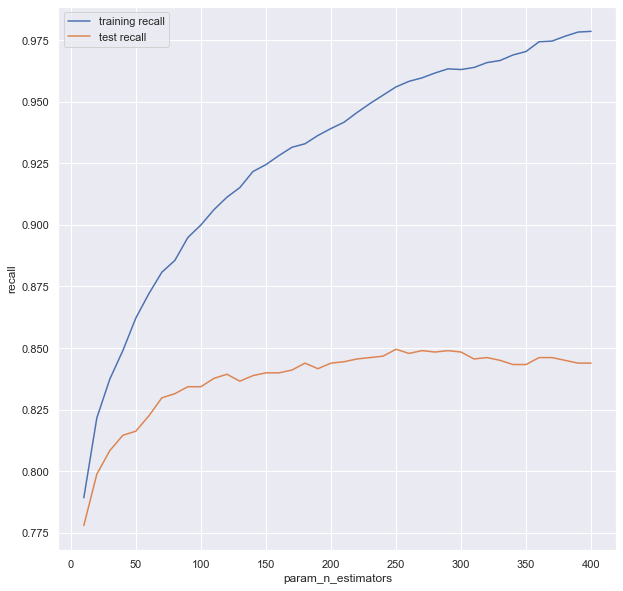

In [91]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_n_estimators"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_n_estimators"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("param_n_estimators")
plt.ylabel("recall")
plt.legend()
plt.show()

In [92]:
# Predict
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 85% with 20% precision -- 4 pts gain in recall at the cost of 1 pt of precision

             precision    recall  f1-score   support

          0       0.98      0.66      0.79      8179
          1       0.20      0.85      0.32       815

avg / total       0.91      0.68      0.74      8994

[[5389 2790]
 [ 126  689]]


# Model 3: XGBoost
- Tune max_depth with the objective of getting better recall with better precision / at least without much loss in precision
- Fit on dataset and evaluate goodness of fit

In [93]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'n_estimators': [250], # learned above
    'max_depth': range(2, 25, 1)
}

# Instantiate grid search
xgb_grid_search = XGBClassifier(random_state=42)
grid_search = GridSearchCV(estimator = xgb_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 23 candidates, totalling 69 fits
[CV] max_depth=2, n_estimators=250 ...................................
[CV] max_depth=2, n_estimators=250 ...................................
[CV] max_depth=2, n_estimators=250 ...................................
[CV] max_depth=3, n_estimators=250 ...................................
[CV] max_depth=3, n_estimators=250 ...................................
[CV] max_depth=3, n_estimators=250 ...................................
[CV] max_depth=4, n_estimators=250 ...................................
[CV] max_depth=4, n_estimators=250 ...................................
[CV] max_depth=4, n_estimators=250 ...................................
[CV] max_depth=5, n_estimators=250 ...................................
[CV] max_depth=5, n_estimators=250 ...................................
[CV] max_depth=5, n_estimators=250 ...................................
[CV]  max_depth=2, n_estimators=250, score=0.8462837837837838, total=   1.2s
[CV] max_d

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.3s


[CV]  max_depth=3, n_estimators=250, score=0.847972972972973, total=   1.7s
[CV] max_depth=7, n_estimators=250 ...................................
[CV]  max_depth=3, n_estimators=250, score=0.8460236886632826, total=   1.7s
[CV] max_depth=7, n_estimators=250 ...................................
[CV]  max_depth=3, n_estimators=250, score=0.8544839255499154, total=   1.7s
[CV] max_depth=7, n_estimators=250 ...................................
[CV]  max_depth=4, n_estimators=250, score=0.8581081081081081, total=   2.2s
[CV] max_depth=8, n_estimators=250 ...................................
[CV]  max_depth=4, n_estimators=250, score=0.8426395939086294, total=   2.2s
[CV]  max_depth=4, n_estimators=250, score=0.8375634517766497, total=   2.2s
[CV] max_depth=8, n_estimators=250 ...................................
[CV] max_depth=8, n_estimators=250 ...................................


[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.3s


[CV]  max_depth=5, n_estimators=250, score=0.8293918918918919, total=   2.7s
[CV] max_depth=9, n_estimators=250 ...................................
[CV]  max_depth=5, n_estimators=250, score=0.8494077834179357, total=   2.7s
[CV] max_depth=9, n_estimators=250 ...................................
[CV]  max_depth=5, n_estimators=250, score=0.8477157360406091, total=   2.8s
[CV] max_depth=9, n_estimators=250 ...................................
[CV]  max_depth=6, n_estimators=250, score=0.8378378378378378, total=   3.5s
[CV] max_depth=10, n_estimators=250 ..................................
[CV]  max_depth=6, n_estimators=250, score=0.8426395939086294, total=   3.5s
[CV] max_depth=10, n_estimators=250 ..................................
[CV]  max_depth=6, n_estimators=250, score=0.8443316412859561, total=   3.5s
[CV] max_depth=10, n_estimators=250 ..................................
[CV]  max_depth=7, n_estimators=250, score=0.8494077834179357, total=   3.8s
[CV] max_depth=11, n_estimators=250

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    5.8s


[CV]  max_depth=8, n_estimators=250, score=0.8510998307952623, total=   4.2s
[CV] max_depth=12, n_estimators=250 ..................................
[CV]  max_depth=8, n_estimators=250, score=0.8378378378378378, total=   4.3s
[CV] max_depth=12, n_estimators=250 ..................................
[CV]  max_depth=8, n_estimators=250, score=0.8595600676818951, total=   4.4s
[CV] max_depth=12, n_estimators=250 ..................................
[CV]  max_depth=9, n_estimators=250, score=0.8443316412859561, total=   4.4s
[CV] max_depth=13, n_estimators=250 ..................................
[CV]  max_depth=9, n_estimators=250, score=0.8429054054054054, total=   4.5s
[CV] max_depth=13, n_estimators=250 ..................................
[CV]  max_depth=9, n_estimators=250, score=0.8544839255499154, total=   4.6s
[CV] max_depth=13, n_estimators=250 ..................................
[CV]  max_depth=10, n_estimators=250, score=0.8378378378378378, total=   4.5s
[CV] max_depth=14, n_estimators=25

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    9.4s


[CV]  max_depth=11, n_estimators=250, score=0.8412162162162162, total=   4.6s
[CV] max_depth=15, n_estimators=250 ..................................
[CV]  max_depth=11, n_estimators=250, score=0.8494077834179357, total=   4.6s
[CV] max_depth=15, n_estimators=250 ..................................
[CV]  max_depth=11, n_estimators=250, score=0.8494077834179357, total=   4.7s
[CV] max_depth=15, n_estimators=250 ..................................
[CV]  max_depth=12, n_estimators=250, score=0.8494077834179357, total=   4.5s
[CV] max_depth=16, n_estimators=250 ..................................
[CV]  max_depth=12, n_estimators=250, score=0.839527027027027, total=   4.6s
[CV] max_depth=16, n_estimators=250 ..................................
[CV]  max_depth=12, n_estimators=250, score=0.8477157360406091, total=   4.7s
[CV] max_depth=16, n_estimators=250 ..................................
[CV]  max_depth=13, n_estimators=250, score=0.8460236886632826, total=   4.6s
[CV] max_depth=17, n_estimato

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s


[CV] max_depth=18, n_estimators=250 ..................................
[CV]  max_depth=15, n_estimators=250, score=0.8378378378378378, total=   4.8s
[CV] max_depth=19, n_estimators=250 ..................................
[CV]  max_depth=15, n_estimators=250, score=0.8477157360406091, total=   4.7s
[CV] max_depth=19, n_estimators=250 ..................................
[CV]  max_depth=15, n_estimators=250, score=0.856175972927242, total=   4.8s
[CV] max_depth=19, n_estimators=250 ..................................
[CV]  max_depth=16, n_estimators=250, score=0.8375634517766497, total=   4.7s
[CV] max_depth=20, n_estimators=250 ..................................
[CV]  max_depth=16, n_estimators=250, score=0.839527027027027, total=   4.7s
[CV] max_depth=20, n_estimators=250 ..................................
[CV]  max_depth=16, n_estimators=250, score=0.8510998307952623, total=   4.7s
[CV] max_depth=20, n_estimators=250 ..................................
[CV]  max_depth=17, n_estimators=250,

[Parallel(n_jobs=-1)]: Done  53 out of  69 | elapsed:   20.2s remaining:    6.1s


[CV]  max_depth=19, n_estimators=250, score=0.8595600676818951, total=   4.8s
[CV] max_depth=23, n_estimators=250 ..................................
[CV]  max_depth=20, n_estimators=250, score=0.8375634517766497, total=   4.8s
[CV] max_depth=24, n_estimators=250 ..................................
[CV]  max_depth=20, n_estimators=250, score=0.839527027027027, total=   4.9s
[CV] max_depth=24, n_estimators=250 ..................................
[CV]  max_depth=20, n_estimators=250, score=0.8544839255499154, total=   4.9s
[CV] max_depth=24, n_estimators=250 ..................................
[CV]  max_depth=21, n_estimators=250, score=0.8375634517766497, total=   4.8s
[CV]  max_depth=21, n_estimators=250, score=0.839527027027027, total=   4.9s
[CV]  max_depth=21, n_estimators=250, score=0.8544839255499154, total=   4.8s


[Parallel(n_jobs=-1)]: Done  60 out of  69 | elapsed:   22.1s remaining:    3.3s


[CV]  max_depth=22, n_estimators=250, score=0.8375634517766497, total=   4.4s
[CV]  max_depth=22, n_estimators=250, score=0.839527027027027, total=   4.6s
[CV]  max_depth=22, n_estimators=250, score=0.8544839255499154, total=   4.4s
[CV]  max_depth=23, n_estimators=250, score=0.8375634517766497, total=   4.0s
[CV]  max_depth=23, n_estimators=250, score=0.8544839255499154, total=   3.9s
[CV]  max_depth=23, n_estimators=250, score=0.839527027027027, total=   4.4s
[CV]  max_depth=24, n_estimators=250, score=0.8375634517766497, total=   3.7s
[CV]  max_depth=24, n_estimators=250, score=0.839527027027027, total=   3.8s
[CV]  max_depth=24, n_estimators=250, score=0.8544839255499154, total=   3.5s


[Parallel(n_jobs=-1)]: Done  67 out of  69 | elapsed:   24.7s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done  69 out of  69 | elapsed:   24.9s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=42, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'n_estimators': [250], 'max_depth': range(2, 25)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [94]:
grid_search.best_score_, grid_search.best_params_

(0.8517474633596392, {'max_depth': 14, 'n_estimators': 250})

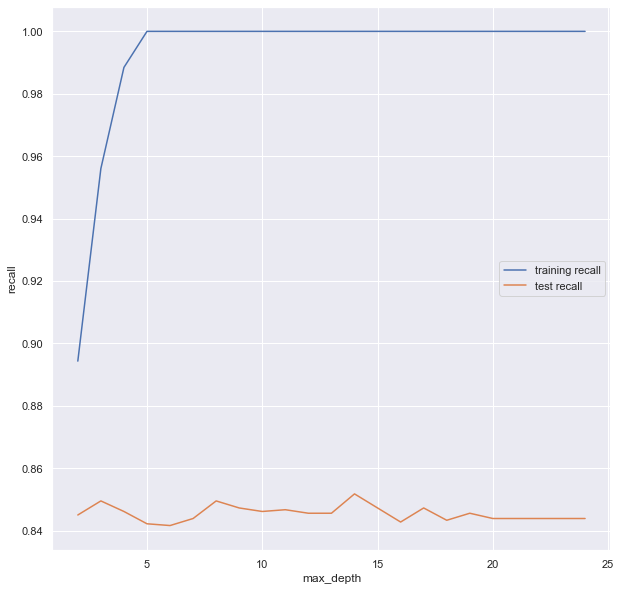

In [95]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_max_depth"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_max_depth"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("recall")
plt.legend()
plt.show()

In [96]:
# Predict
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 86% with 20% precision -- 1 pt increase in recall, stable precision

             precision    recall  f1-score   support

          0       0.98      0.65      0.78      8179
          1       0.20      0.86      0.32       815

avg / total       0.91      0.67      0.74      8994

[[5303 2876]
 [ 118  697]]


# Model 4: Linear Support Vector Machine
- Fit Linear SVM with default hyperparameters and evaluate goodness of fit

In [97]:
# Instantiate model with default hyperparameters
lsvc = LinearSVC()

# Train model
lsvc.fit(X_train_pca, y_train)

# Predict
y_pred = lsvc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))

# Observe recall of 86% with 20% precision

             precision    recall  f1-score   support

          0       0.98      0.65      0.78      8179
          1       0.20      0.86      0.32       815

avg / total       0.91      0.67      0.74      8994



# Model 4: Linear Support Vector Machine
- Tune hyperparameter C with the objective of getting better recall with better precision / at least without much loss in precision
- Fit on dataset and evaluate goodness of fit

In [98]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100, 1000],
    'dual': [False]
}

# Instantiate grid search
lsvm_grid_search = LinearSVC(random_state=42)
grid_search = GridSearchCV(estimator = lsvm_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] C=0.01, dual=False ..............................................
[CV] C=0.01, dual=False ..............................................
[CV] C=0.01, dual=False ..............................................
[CV] C=0.1, dual=False ...............................................
[CV] C=0.1, dual=False ...............................................
[CV] ..... C=0.01, dual=False, score=0.8175675675675675, total=   0.0s
[CV] C=0.1, dual=False ...............................................
[CV] ..... C=0.01, dual=False, score=0.8240270727580372, total=   0.0s
[CV] C=1, dual=False .................................................
[CV] ..... C=0.01, dual=False, score=0.8527918781725888, total=   0.0s
[CV] C=1, dual=False .................................................
[CV] ...... C=0.1, dual=False, score=0.8158783783783784, total=   0.0s
[CV] C=1, dual=False .................................................
[CV] ...... C=0.1

[Parallel(n_jobs=-1)]: Batch computation too fast (0.0357s.) Setting batch_size=10.
[Parallel(n_jobs=-1)]: Done   3 out of  18 | elapsed:    0.0s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done   5 out of  18 | elapsed:    0.1s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done   7 out of  18 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done   9 out of  18 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  11 out of  18 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  13 out of  18 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  15 out of  18 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:    0.1s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=42, tol=0.0001,
     verbose=0),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000], 'dual': [False]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [99]:
grid_search.best_score_, grid_search.best_params_

(0.8314543404735062, {'C': 0.01, 'dual': False})

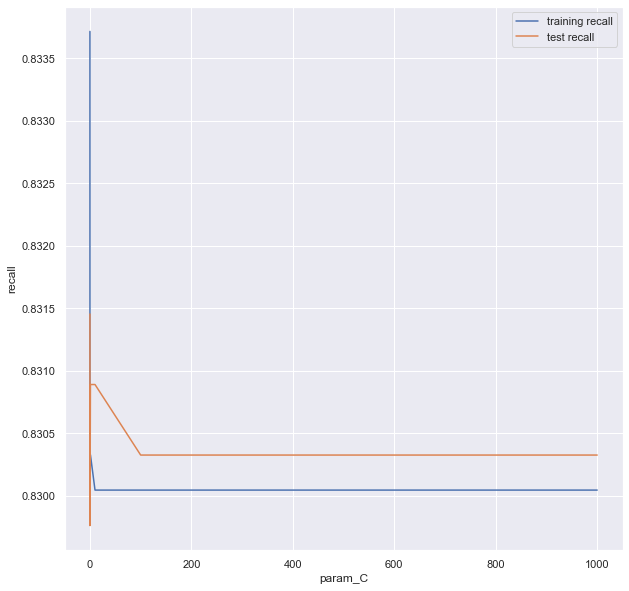

In [100]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_C"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_C"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("param_C")
plt.ylabel("recall")
plt.legend()
plt.show()

In [101]:
# Predict
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 83% with 23% precision

             precision    recall  f1-score   support

          0       0.98      0.73      0.83      8179
          1       0.23      0.83      0.36       815

avg / total       0.91      0.74      0.79      8994

[[5943 2236]
 [ 136  679]]


# Model 5: RBF Support Vector Machine
- Fit model with default hyperparameters and evaluate goodness of fit

In [102]:
# Instantiate model with default hyperparameters
svc = SVC(kernel = 'rbf')

# Train model
svc.fit(X_train_pca, y_train)

# Predict
y_pred = svc.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))

# Observe recall of 83% with 23% precision

             precision    recall  f1-score   support

          0       0.98      0.73      0.83      8179
          1       0.23      0.83      0.36       815

avg / total       0.91      0.74      0.79      8994



# Model 5: RBF Support Vector Machine
- Tune hyperparameter C with the objective of getting better recall with better precision / at least without much loss in precision
- Fit on dataset and evaluate goodness of fit

In [103]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100, 1000],
    'kernel': ['rbf'],
}

# Instantiate grid search
svm_grid_search = SVC(random_state=42)
grid_search = GridSearchCV(estimator = svm_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] C=0.01, kernel=rbf ..............................................
[CV] C=0.01, kernel=rbf ..............................................
[CV] C=0.01, kernel=rbf ..............................................
[CV] C=0.1, kernel=rbf ...............................................
[CV] C=0.1, kernel=rbf ...............................................
[CV] C=0.1, kernel=rbf ...............................................
[CV] C=1, kernel=rbf .................................................
[CV] C=1, kernel=rbf .................................................
[CV] C=1, kernel=rbf .................................................
[CV] C=10, kernel=rbf ................................................
[CV] C=10, kernel=rbf ................................................
[CV] C=10, kernel=rbf ................................................
[CV] ........ C=1, kernel=rbf, score=0.8392554991539763, total=   0.3s
[CV] C=100, kerne

[Parallel(n_jobs=-1)]: Done   3 out of  18 | elapsed:    0.4s remaining:    2.1s
[Parallel(n_jobs=-1)]: Done   5 out of  18 | elapsed:    0.5s remaining:    1.2s
[Parallel(n_jobs=-1)]: Done   7 out of  18 | elapsed:    0.5s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done   9 out of  18 | elapsed:    0.5s remaining:    0.5s


[CV] ..... C=0.01, kernel=rbf, score=0.7038917089678511, total=   0.4s
[CV] ..... C=0.01, kernel=rbf, score=0.6920473773265652, total=   0.4s
[CV] ...... C=100, kernel=rbf, score=0.8578680203045685, total=   0.4s


[Parallel(n_jobs=-1)]: Done  11 out of  18 | elapsed:    0.6s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  13 out of  18 | elapsed:    0.8s remaining:    0.3s


[CV] ....... C=100, kernel=rbf, score=0.839527027027027, total=   0.4s
[CV] ...... C=100, kernel=rbf, score=0.8595600676818951, total=   0.4s
[CV] ..... C=1000, kernel=rbf, score=0.8274111675126904, total=   0.4s
[CV] ..... C=1000, kernel=rbf, score=0.8358714043993232, total=   0.4s
[CV] ..... C=1000, kernel=rbf, score=0.8209459459459459, total=   0.5s


[Parallel(n_jobs=-1)]: Done  15 out of  18 | elapsed:    0.8s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:    0.9s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=42, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000], 'kernel': ['rbf']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [104]:
grid_search.best_score_, grid_search.best_params_

(0.8641488162344984, {'C': 10, 'kernel': 'rbf'})

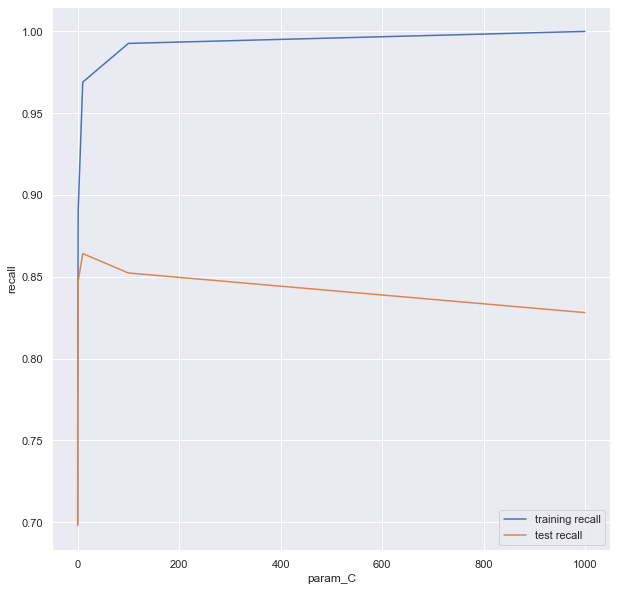

In [105]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_C"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_C"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("param_C")
plt.ylabel("recall")
plt.legend()
plt.show()

In [106]:
# Predict
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 88% with 20% precision -- 5 pts increase in recall at the cost of 3 pts loss in precision

             precision    recall  f1-score   support

          0       0.98      0.65      0.78      8179
          1       0.20      0.88      0.33       815

avg / total       0.91      0.67      0.74      8994

[[5341 2838]
 [ 100  715]]


# Model 5: RBF Support Vector Machine
- Tune hyperparameter gamma with the objective of getting better recall with better precision / at least without much loss in precision
- Fit on dataset and evaluate goodness of fit

In [107]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'C': [10], # learned above
    'kernel': ['rbf'],
    'gamma': [0.0001, 0.001, 0.01, 0.1, 0.5, 0.7, 0.9, 1]
}

# Instantiate grid search
svm_grid_search = SVC(random_state=42)
grid_search = GridSearchCV(estimator = svm_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] C=10, gamma=0.1, kernel=rbf .....................................
[CV] C=10, gamma=0.1, kernel=rbf .....................................
[CV] C=10, gamma=0.1, kernel=rbf .....................................
[CV]  C=10, gamma=0.01, kernel=rbf, score=0.8581081081081081, total=   0.2s
[CV]  C=10, 

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done   4 out of  24 | elapsed:    0.4s remaining:    1.8s
[Parallel(n_jobs=-1)]: Done   7 out of  24 | elapsed:    0.4s remaining:    1.0s


[CV] C=10, gamma=1, kernel=rbf .......................................
[CV]  C=10, gamma=0.1, kernel=rbf, score=0.8460236886632826, total=   0.4s
[CV] C=10, gamma=1, kernel=rbf .......................................
[CV]  C=10, gamma=0.1, kernel=rbf, score=0.8595600676818951, total=   0.3s
[CV] C=10, gamma=1, kernel=rbf .......................................


[Parallel(n_jobs=-1)]: Done  10 out of  24 | elapsed:    0.5s remaining:    0.8s


[CV]  C=10, gamma=0.5, kernel=rbf, score=0.6531302876480541, total=   0.5s
[CV] ......... C=10, gamma=0.5, kernel=rbf, score=0.625, total=   0.5s
[CV]  C=10, gamma=0.7, kernel=rbf, score=0.5922165820642978, total=   0.5s
[CV]  C=10, gamma=0.7, kernel=rbf, score=0.5523648648648649, total=   0.5s
[CV]  C=10, gamma=0.9, kernel=rbf, score=0.49493243243243246, total=   0.5s
[CV]  C=10, gamma=0.7, kernel=rbf, score=0.5634517766497462, total=   0.5s
[CV]  C=10, gamma=0.9, kernel=rbf, score=0.5431472081218274, total=   0.5s
[CV]  C=10, gamma=0.9, kernel=rbf, score=0.49915397631133673, total=   0.5s
[CV]  C=10, gamma=0.5, kernel=rbf, score=0.6294416243654822, total=   0.7s
[CV]  C=10, gamma=1, kernel=rbf, score=0.5262267343485617, total=   0.5s
[CV]  C=10, gamma=1, kernel=rbf, score=0.4831081081081081, total=   0.5s
[CV]  C=10, gamma=1, kernel=rbf, score=0.4856175972927242, total=   0.5s


[Parallel(n_jobs=-1)]: Done  13 out of  24 | elapsed:    1.1s remaining:    0.9s
[Parallel(n_jobs=-1)]: Done  16 out of  24 | elapsed:    1.1s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  19 out of  24 | elapsed:    1.1s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  22 out of  24 | elapsed:    1.2s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:    1.2s finished


GridSearchCV(cv=3, error_score='raise',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=42, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'C': [10], 'kernel': ['rbf'], 'gamma': [0.0001, 0.001, 0.01, 0.1, 0.5, 0.7, 0.9, 1]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [108]:
grid_search.best_score_, grid_search.best_params_

(0.8607666290868095, {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'})

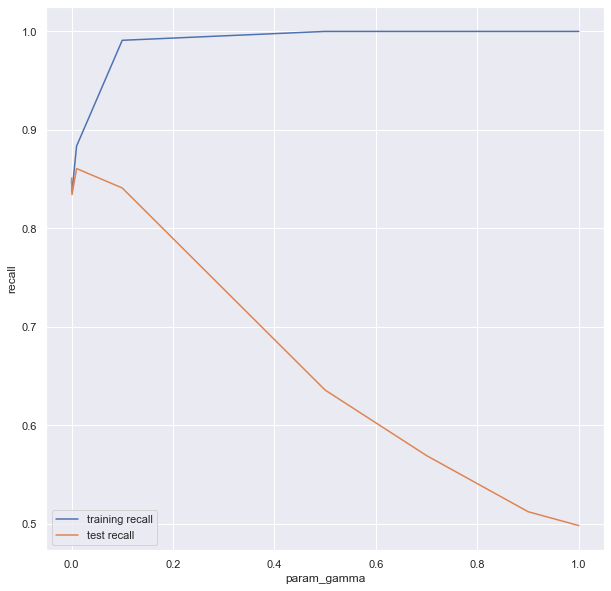

In [109]:
# plot precision vs. parameter curve
plt.figure()
plt.plot(grid_search.cv_results_["param_gamma"], 
         grid_search.cv_results_["mean_train_score"], 
         label="training recall")
plt.plot(grid_search.cv_results_["param_gamma"], 
         grid_search.cv_results_["mean_test_score"], 
         label="test recall")
plt.xlabel("param_gamma")
plt.ylabel("recall")
plt.legend()
plt.show()

In [110]:
# Predict
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 86% with 24% precision -- 2 pts loss in recall but 4 pts gain in precision

             precision    recall  f1-score   support

          0       0.98      0.73      0.84      8179
          1       0.24      0.86      0.38       815

avg / total       0.91      0.74      0.79      8994

[[5967 2212]
 [ 116  699]]


# Model 6: Polynomial Support Vector Machine
- Tune hyperparameters with the objective of getting better recall with better precision / at least without much loss in precision
- Fit on dataset and evaluate goodness of fit

In [205]:
# Specify universe of potential values for hyperparameters 
param_grid = {
    'C': [0.01, 0.1, 0.5, 1, 10, 100, 1000],
    'kernel': ['poly'],
    'gamma': [0.0001, 0.001, 0.01, 0.1, 0.5, 0.7, 0.9, 1],
    'degree': [2, 3]
}

# Instantiate grid search
svm_grid_search = SVC(random_state=42)
grid_search = GridSearchCV(estimator = svm_grid_search, param_grid = param_grid, cv = 3,
                           n_jobs = -1, verbose = 10, scoring='recall')

# Run grid search on dataset
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 112 candidates, totalling 336 fits
[CV] C=0.01, degree=2, gamma=0.0001, kernel=poly .....................
[CV] C=0.01, degree=2, gamma=0.0001, kernel=poly .....................
[CV] C=0.01, degree=2, gamma=0.0001, kernel=poly .....................
[CV] C=0.01, degree=2, gamma=0.001, kernel=poly ......................
[CV] C=0.01, degree=2, gamma=0.001, kernel=poly ......................
[CV] C=0.01, degree=2, gamma=0.001, kernel=poly ......................
[CV] C=0.01, degree=2, gamma=0.01, kernel=poly .......................
[CV] C=0.01, degree=2, gamma=0.01, kernel=poly .......................
[CV] C=0.01, degree=2, gamma=0.01, kernel=poly .......................
[CV] C=0.01, degree=2, gamma=0.1, kernel=poly ........................
[CV] C=0.01, degree=2, gamma=0.1, kernel=poly ........................
[CV] C=0.01, degree=2, gamma=0.1, kernel=poly ........................
[CV]  C=0.01, degree=2, gamma=0.1, kernel=poly, score=0.918918918918919, total=   0.3

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.5s


[CV]  C=0.01, degree=2, gamma=0.5, kernel=poly, score=0.7804054054054054, total=   0.3s
[CV] C=0.01, degree=3, gamma=0.0001, kernel=poly .....................
[CV]  C=0.01, degree=2, gamma=0.7, kernel=poly, score=0.7601351351351351, total=   0.3s
[CV]  C=0.01, degree=2, gamma=0.5, kernel=poly, score=0.7580372250423012, total=   0.3s
[CV] C=0.01, degree=3, gamma=0.0001, kernel=poly .....................
[CV] C=0.01, degree=3, gamma=0.0001, kernel=poly .....................
[CV]  C=0.01, degree=2, gamma=0.5, kernel=poly, score=0.7292724196277496, total=   0.3s
[CV] C=0.01, degree=3, gamma=0.001, kernel=poly ......................
[CV]  C=0.01, degree=2, gamma=0.7, kernel=poly, score=0.7597292724196277, total=   0.3s
[CV]  C=0.01, degree=2, gamma=0.7, kernel=poly, score=0.7191201353637902, total=   0.3s
[CV] C=0.01, degree=3, gamma=0.001, kernel=poly ......................
[CV] C=0.01, degree=3, gamma=0.001, kernel=poly ......................
[CV]  C=0.01, degree=2, gamma=0.9, kernel=poly

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.9s


[CV]  C=0.01, degree=3, gamma=0.1, kernel=poly, score=0.9341216216216216, total=   0.2s
[CV] C=0.01, degree=3, gamma=0.5, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.1, kernel=poly, score=0.9357021996615905, total=   0.2s
[CV] C=0.01, degree=3, gamma=0.5, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.1, kernel=poly, score=0.9323181049069373, total=   0.2s
[CV] C=0.01, degree=3, gamma=0.5, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.3s
[CV] C=0.01, degree=3, gamma=0.7, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.3s
[CV] C=0.01, degree=3, gamma=0.7, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.001, kernel=poly, score=1.0, total=   0.3s
[CV] C=0.01, degree=3, gamma=0.7, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.001, kernel=poly, score=1.0, total=   0.3s
[CV] C=0

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.3s


[CV]  C=0.01, degree=3, gamma=0.001, kernel=poly, score=1.0, total=   0.3s
[CV] C=0.01, degree=3, gamma=1, kernel=poly ..........................
[CV]  C=0.01, degree=3, gamma=0.5, kernel=poly, score=0.8175675675675675, total=   0.3s
[CV] C=0.1, degree=2, gamma=0.0001, kernel=poly ......................
[CV]  C=0.01, degree=3, gamma=0.5, kernel=poly, score=0.817258883248731, total=   0.3s
[CV] C=0.1, degree=2, gamma=0.0001, kernel=poly ......................
[CV]  C=0.01, degree=3, gamma=0.5, kernel=poly, score=0.8121827411167513, total=   0.3s
[CV] C=0.1, degree=2, gamma=0.0001, kernel=poly ......................
[CV]  C=0.01, degree=3, gamma=0.7, kernel=poly, score=0.7989864864864865, total=   0.4s
[CV] C=0.1, degree=2, gamma=0.001, kernel=poly .......................
[CV]  C=0.01, degree=3, gamma=0.7, kernel=poly, score=0.8071065989847716, total=   0.4s
[CV] C=0.1, degree=2, gamma=0.001, kernel=poly .......................


[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    1.6s


[CV]  C=0.01, degree=3, gamma=0.7, kernel=poly, score=0.8155668358714044, total=   0.4s
[CV] C=0.1, degree=2, gamma=0.001, kernel=poly .......................
[CV]  C=0.01, degree=3, gamma=0.9, kernel=poly, score=0.8037225042301185, total=   0.5s
[CV] C=0.1, degree=2, gamma=0.01, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.9, kernel=poly, score=0.7969543147208121, total=   0.5s
[CV] C=0.1, degree=2, gamma=0.01, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=0.9, kernel=poly, score=0.793918918918919, total=   0.6s
[CV] C=0.1, degree=2, gamma=0.01, kernel=poly ........................
[CV]  C=0.01, degree=3, gamma=1, kernel=poly, score=0.7952622673434856, total=   0.5s
[CV] C=0.1, degree=2, gamma=0.1, kernel=poly .........................
[CV]  C=0.1, degree=2, gamma=0.0001, kernel=poly, score=1.0, total=   0.3s
[CV] C=0.1, degree=2, gamma=0.1, kernel=poly .........................
[CV]  C=0.1, degree=2, gamma=0.0001, kernel=poly, score=0.9983

[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    2.1s


[CV]  C=0.1, degree=2, gamma=0.001, kernel=poly, score=1.0, total=   0.4s
[CV] C=0.1, degree=2, gamma=0.7, kernel=poly .........................
[CV]  C=0.1, degree=2, gamma=0.001, kernel=poly, score=0.9983079526226735, total=   0.4s
[CV] C=0.1, degree=2, gamma=0.7, kernel=poly .........................
[CV]  C=0.1, degree=2, gamma=0.001, kernel=poly, score=0.9966159052453468, total=   0.4s
[CV] C=0.1, degree=2, gamma=0.7, kernel=poly .........................
[CV]  C=0.1, degree=2, gamma=0.1, kernel=poly, score=0.8175675675675675, total=   0.3s
[CV]  C=0.1, degree=2, gamma=0.01, kernel=poly, score=0.9932432432432432, total=   0.4s
[CV]  C=0.1, degree=2, gamma=0.01, kernel=poly, score=0.9898477157360406, total=   0.4s
[CV] C=0.1, degree=2, gamma=0.9, kernel=poly .........................
[CV] C=0.1, degree=2, gamma=0.9, kernel=poly .........................
[CV]  C=0.1, degree=2, gamma=0.1, kernel=poly, score=0.8003384094754653, total=   0.3s
[CV] C=0.1, degree=2, gamma=0.9, kernel=pol

[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:    2.9s


[CV]  C=0.1, degree=2, gamma=0.5, kernel=poly, score=0.739424703891709, total=   0.7s
[CV] C=0.1, degree=3, gamma=0.0001, kernel=poly ......................
[CV]  C=0.1, degree=2, gamma=0.7, kernel=poly, score=0.7851099830795262, total=   0.8s
[CV] C=0.1, degree=3, gamma=0.001, kernel=poly .......................
[CV]  C=0.1, degree=2, gamma=0.7, kernel=poly, score=0.75, total=   0.9s
[CV] C=0.1, degree=3, gamma=0.001, kernel=poly .......................
[CV]  C=0.1, degree=2, gamma=0.7, kernel=poly, score=0.7411167512690355, total=   0.9s
[CV] C=0.1, degree=3, gamma=0.001, kernel=poly .......................
[CV]  C=0.1, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.5s
[CV] C=0.1, degree=3, gamma=0.01, kernel=poly ........................
[CV]  C=0.1, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.5s
[CV] C=0.1, degree=3, gamma=0.01, kernel=poly ........................
[CV]  C=0.1, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.4s
[CV]  C=0.1, deg

[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    4.0s


[CV]  C=0.1, degree=3, gamma=0.01, kernel=poly, score=0.9983079526226735, total=   0.4s
[CV]  C=0.1, degree=3, gamma=0.1, kernel=poly, score=0.8747884940778342, total=   0.2s
[CV] C=0.1, degree=3, gamma=0.9, kernel=poly .........................
[CV] C=0.1, degree=3, gamma=0.9, kernel=poly .........................
[CV]  C=0.1, degree=2, gamma=1, kernel=poly, score=0.7343485617597293, total=   1.4s
[CV] C=0.1, degree=3, gamma=0.9, kernel=poly .........................
[CV]  C=0.1, degree=3, gamma=0.01, kernel=poly, score=0.9966159052453468, total=   0.4s
[CV]  C=0.1, degree=2, gamma=1, kernel=poly, score=0.7868020304568528, total=   1.6s
[CV] C=0.1, degree=3, gamma=1, kernel=poly ...........................
[CV] C=0.1, degree=3, gamma=1, kernel=poly ...........................
[CV]  C=0.1, degree=2, gamma=1, kernel=poly, score=0.7483108108108109, total=   1.7s
[CV] C=0.1, degree=3, gamma=1, kernel=poly ...........................
[CV]  C=0.1, degree=3, gamma=0.5, kernel=poly, score=0.7

[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:    5.4s


[CV]  C=0.1, degree=3, gamma=0.7, kernel=poly, score=0.7614213197969543, total=   1.4s
[CV] C=0.5, degree=2, gamma=0.01, kernel=poly ........................
[CV]  C=0.1, degree=3, gamma=0.7, kernel=poly, score=0.7516891891891891, total=   1.6s
[CV] C=0.5, degree=2, gamma=0.01, kernel=poly ........................
[CV]  C=0.5, degree=2, gamma=0.001, kernel=poly, score=1.0, total=   0.3s
[CV] C=0.5, degree=2, gamma=0.1, kernel=poly .........................
[CV]  C=0.5, degree=2, gamma=0.01, kernel=poly, score=0.956081081081081, total=   0.3s
[CV] C=0.5, degree=2, gamma=0.1, kernel=poly .........................
[CV]  C=0.5, degree=2, gamma=0.001, kernel=poly, score=0.9983079526226735, total=   0.3s
[CV] C=0.5, degree=2, gamma=0.1, kernel=poly .........................
[CV]  C=0.5, degree=2, gamma=0.001, kernel=poly, score=0.9966159052453468, total=   0.3s
[CV] C=0.5, degree=2, gamma=0.5, kernel=poly .........................
[CV]  C=0.1, degree=3, gamma=0.9, kernel=poly, score=0.778341

[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    6.3s


[CV]  C=0.1, degree=3, gamma=1, kernel=poly, score=0.7381756756756757, total=   2.3s
[CV] C=0.5, degree=2, gamma=1, kernel=poly ...........................
[CV]  C=0.1, degree=3, gamma=0.9, kernel=poly, score=0.7533783783783784, total=   2.7s
[CV] C=0.5, degree=2, gamma=1, kernel=poly ...........................
[CV]  C=0.1, degree=3, gamma=1, kernel=poly, score=0.7326565143824028, total=   2.7s
[CV] C=0.5, degree=2, gamma=1, kernel=poly ...........................
[CV]  C=0.5, degree=2, gamma=0.5, kernel=poly, score=0.7901861252115059, total=   1.3s
[CV] C=0.5, degree=3, gamma=0.0001, kernel=poly ......................
[CV]  C=0.5, degree=2, gamma=0.5, kernel=poly, score=0.7449324324324325, total=   1.9s
[CV] C=0.5, degree=3, gamma=0.0001, kernel=poly ......................
[CV]  C=0.5, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.4s
[CV] C=0.5, degree=3, gamma=0.0001, kernel=poly ......................
[CV]  C=0.5, degree=2, gamma=0.5, kernel=poly, score=0.7343485617597

[Parallel(n_jobs=-1)]: Done 121 tasks      | elapsed:    9.6s


[CV]  C=0.5, degree=3, gamma=0.1, kernel=poly, score=0.8341793570219966, total=   0.2s
[CV] C=0.5, degree=3, gamma=0.7, kernel=poly .........................
[CV]  C=0.5, degree=2, gamma=0.9, kernel=poly, score=0.7935702199661591, total=   4.4s
[CV] C=0.5, degree=3, gamma=0.9, kernel=poly .........................
[CV]  C=0.5, degree=2, gamma=0.9, kernel=poly, score=0.7601351351351351, total=   4.8s
[CV] C=0.5, degree=3, gamma=0.9, kernel=poly .........................
[CV]  C=0.5, degree=3, gamma=0.5, kernel=poly, score=0.7817258883248731, total=   1.4s
[CV] C=0.5, degree=3, gamma=0.9, kernel=poly .........................
[CV]  C=0.5, degree=3, gamma=0.5, kernel=poly, score=0.751269035532995, total=   1.6s
[CV] C=0.5, degree=3, gamma=1, kernel=poly ...........................
[CV]  C=0.5, degree=2, gamma=0.9, kernel=poly, score=0.7360406091370558, total=   5.1s
[CV] C=0.5, degree=3, gamma=1, kernel=poly ...........................
[CV]  C=0.5, degree=3, gamma=0.5, kernel=poly, score=

[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   13.2s


[CV]  C=0.5, degree=2, gamma=1, kernel=poly, score=0.7935702199661591, total=   6.4s
[CV] C=1, degree=2, gamma=0.01, kernel=poly ..........................
[CV]  C=1, degree=2, gamma=0.001, kernel=poly, score=0.9983079526226735, total=   0.3s
[CV] C=1, degree=2, gamma=0.1, kernel=poly ...........................
[CV]  C=1, degree=2, gamma=0.01, kernel=poly, score=0.918918918918919, total=   0.2s
[CV] C=1, degree=2, gamma=0.1, kernel=poly ...........................
[CV]  C=1, degree=2, gamma=0.001, kernel=poly, score=0.9966159052453468, total=   0.3s
[CV] C=1, degree=2, gamma=0.1, kernel=poly ...........................
[CV]  C=1, degree=2, gamma=0.01, kernel=poly, score=0.8798646362098139, total=   0.3s
[CV] C=1, degree=2, gamma=0.5, kernel=poly ...........................
[CV]  C=1, degree=2, gamma=0.01, kernel=poly, score=0.8967851099830795, total=   0.3s
[CV] C=1, degree=2, gamma=0.5, kernel=poly ...........................
[CV]  C=1, degree=2, gamma=0.1, kernel=poly, score=0.77157

[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:   16.6s


[CV]  C=1, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.3s
[CV] C=1, degree=3, gamma=0.0001, kernel=poly ........................
[CV]  C=1, degree=2, gamma=0.5, kernel=poly, score=0.7343485617597293, total=   3.3s
[CV] C=1, degree=3, gamma=0.0001, kernel=poly ........................
[CV]  C=1, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.3s
[CV] C=1, degree=3, gamma=0.001, kernel=poly .........................
[CV]  C=1, degree=2, gamma=0.5, kernel=poly, score=0.7533783783783784, total=   3.8s
[CV] C=1, degree=3, gamma=0.001, kernel=poly .........................
[CV]  C=1, degree=3, gamma=0.0001, kernel=poly, score=1.0, total=   0.3s
[CV] C=1, degree=3, gamma=0.001, kernel=poly .........................
[CV]  C=1, degree=3, gamma=0.001, kernel=poly, score=1.0, total=   0.3s
[CV] C=1, degree=3, gamma=0.01, kernel=poly ..........................
[CV]  C=1, degree=3, gamma=0.001, kernel=poly, score=1.0, total=   0.3s
[CV] C=1, degree=3, gamma=0.01, kernel=po

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   21.4s


[CV]  C=1, degree=2, gamma=0.9, kernel=poly, score=0.7635135135135135, total=   7.8s
[CV] C=1, degree=3, gamma=0.9, kernel=poly ...........................
[CV]  C=1, degree=2, gamma=0.9, kernel=poly, score=0.7952622673434856, total=   7.9s
[CV] C=1, degree=3, gamma=1, kernel=poly .............................
[CV]  C=1, degree=3, gamma=0.7, kernel=poly, score=0.7246621621621622, total=   3.8s
[CV] C=1, degree=3, gamma=1, kernel=poly .............................
[CV]  C=1, degree=3, gamma=0.7, kernel=poly, score=0.7360406091370558, total=   3.5s
[CV] C=1, degree=3, gamma=1, kernel=poly .............................
[CV]  C=1, degree=2, gamma=0.7, kernel=poly, score=0.7935702199661591, total=  11.1s
[CV] C=10, degree=2, gamma=0.0001, kernel=poly .......................
[CV]  C=1, degree=3, gamma=0.9, kernel=poly, score=0.7309644670050761, total=   3.8s
[CV] C=10, degree=2, gamma=0.0001, kernel=poly .......................
[CV]  C=1, degree=3, gamma=0.7, kernel=poly, score=0.73604060913

[Parallel(n_jobs=-1)]: Done 197 tasks      | elapsed:   27.7s


[CV]  C=10, degree=2, gamma=0.1, kernel=poly, score=0.7868020304568528, total=   1.5s
[CV] C=10, degree=2, gamma=0.9, kernel=poly ..........................
[CV]  C=1, degree=2, gamma=1, kernel=poly, score=0.7935702199661591, total=  11.8s
[CV] C=10, degree=2, gamma=0.9, kernel=poly ..........................
[CV]  C=1, degree=3, gamma=1, kernel=poly, score=0.7292724196277496, total=   4.4s
[CV] C=10, degree=2, gamma=0.9, kernel=poly ..........................
[CV]  C=1, degree=3, gamma=1, kernel=poly, score=0.7111486486486487, total=   6.3s
[CV] C=10, degree=2, gamma=1, kernel=poly ............................
[CV]  C=1, degree=3, gamma=1, kernel=poly, score=0.727580372250423, total=   6.7s
[CV] C=10, degree=2, gamma=1, kernel=poly ............................
[CV]  C=1, degree=2, gamma=1, kernel=poly, score=0.7309644670050761, total=  14.4s
[CV] C=10, degree=2, gamma=1, kernel=poly ............................
[CV]  C=10, degree=2, gamma=0.5, kernel=poly, score=0.7668918918918919, to

[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:   53.3s


[CV]  C=10, degree=3, gamma=0.5, kernel=poly, score=0.7241962774957699, total=   4.4s
[CV] C=10, degree=3, gamma=0.5, kernel=poly ..........................
[CV]  C=10, degree=3, gamma=0.5, kernel=poly, score=0.6993243243243243, total=   6.1s
[CV] C=10, degree=3, gamma=0.7, kernel=poly ..........................
[CV]  C=10, degree=2, gamma=0.5, kernel=poly, score=0.7935702199661591, total=  32.8s
[CV] C=10, degree=3, gamma=0.7, kernel=poly ..........................
[CV]  C=10, degree=3, gamma=0.7, kernel=poly, score=0.7208121827411168, total=   5.4s
[CV] C=10, degree=3, gamma=0.7, kernel=poly ..........................
[CV]  C=10, degree=3, gamma=0.5, kernel=poly, score=0.7258883248730964, total=   7.4s
[CV] C=10, degree=3, gamma=0.9, kernel=poly ..........................
[CV]  C=10, degree=3, gamma=0.7, kernel=poly, score=0.6908783783783784, total=   8.2s
[CV] C=10, degree=3, gamma=0.9, kernel=poly ..........................
[CV]  C=10, degree=3, gamma=0.9, kernel=poly, score=0.7208

[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:  1.5min


[CV]  C=10, degree=2, gamma=0.7, kernel=poly, score=0.7326565143824028, total= 1.0min
[CV] C=100, degree=2, gamma=0.5, kernel=poly .........................
[CV]  C=100, degree=2, gamma=0.1, kernel=poly, score=0.7309644670050761, total=   9.9s
[CV] C=100, degree=2, gamma=0.5, kernel=poly .........................
[CV]  C=100, degree=2, gamma=0.1, kernel=poly, score=0.7668918918918919, total=  14.1s
[CV] C=100, degree=2, gamma=0.7, kernel=poly .........................
[CV]  C=100, degree=2, gamma=0.1, kernel=poly, score=0.7969543147208121, total=  15.4s
[CV] C=100, degree=2, gamma=0.7, kernel=poly .........................
[CV]  C=10, degree=2, gamma=0.9, kernel=poly, score=0.7668918918918919, total= 1.2min
[CV] C=100, degree=2, gamma=0.7, kernel=poly .........................
[CV]  C=10, degree=2, gamma=0.7, kernel=poly, score=0.7935702199661591, total= 1.3min
[CV] C=100, degree=2, gamma=0.9, kernel=poly .........................
[CV]  C=10, degree=2, gamma=1, kernel=poly, score=0.766

[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:  6.6min


[CV]  C=100, degree=3, gamma=0.1, kernel=poly, score=0.7326565143824028, total=   2.2s
[CV] C=100, degree=3, gamma=0.5, kernel=poly .........................
[CV]  C=100, degree=3, gamma=0.5, kernel=poly, score=0.6959459459459459, total=   8.0s
[CV] C=100, degree=3, gamma=0.5, kernel=poly .........................
[CV]  C=100, degree=3, gamma=0.5, kernel=poly, score=0.7208121827411168, total=   4.4s
[CV] C=100, degree=3, gamma=0.5, kernel=poly .........................
[CV]  C=100, degree=3, gamma=0.5, kernel=poly, score=0.7191201353637902, total=   6.9s
[CV] C=100, degree=3, gamma=0.7, kernel=poly .........................
[CV]  C=100, degree=3, gamma=0.7, kernel=poly, score=0.6959459459459459, total=   7.9s
[CV] C=100, degree=3, gamma=0.7, kernel=poly .........................
[CV]  C=100, degree=3, gamma=0.7, kernel=poly, score=0.7208121827411168, total=   4.8s
[CV] C=100, degree=3, gamma=0.7, kernel=poly .........................
[CV]  C=100, degree=3, gamma=0.7, kernel=poly, score

[Parallel(n_jobs=-1)]: Done 289 tasks      | elapsed: 10.1min


[CV]  C=1000, degree=2, gamma=0.1, kernel=poly, score=0.7668918918918919, total= 2.7min
[CV] C=1000, degree=2, gamma=0.5, kernel=poly ........................
[CV]  C=1000, degree=2, gamma=0.1, kernel=poly, score=0.7309644670050761, total= 2.7min
[CV] C=1000, degree=2, gamma=0.5, kernel=poly ........................
[CV]  C=100, degree=2, gamma=0.7, kernel=poly, score=0.7918781725888325, total=13.1min
[CV] C=1000, degree=2, gamma=0.7, kernel=poly ........................
[CV]  C=100, degree=2, gamma=0.7, kernel=poly, score=0.7668918918918919, total=15.4min
[CV] C=1000, degree=2, gamma=0.7, kernel=poly ........................
[CV]  C=100, degree=2, gamma=0.7, kernel=poly, score=0.7309644670050761, total=18.1min
[CV] C=1000, degree=2, gamma=0.7, kernel=poly ........................
[CV]  C=100, degree=2, gamma=0.9, kernel=poly, score=0.7652027027027027, total=19.5min
[CV] C=1000, degree=2, gamma=0.9, kernel=poly ........................
[CV]  C=100, degree=2, gamma=0.9, kernel=poly, sco

[Parallel(n_jobs=-1)]: Done 336 out of 336 | elapsed: 260.5min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=42, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'C': [0.01, 0.1, 0.5, 1, 10, 100, 1000], 'kernel': ['poly'], 'gamma': [0.0001, 0.001, 0.01, 0.1, 0.5, 0.7, 0.9, 1], 'degree': [2, 3]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [206]:
grid_search.best_score_, grid_search.best_params_

(1.0, {'C': 0.01, 'degree': 3, 'gamma': 0.0001, 'kernel': 'poly'})

In [207]:
# Predict
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate
print(metrics.classification_report(y_test, y_test_pred))
print(metrics.confusion_matrix(y_test, y_test_pred))

# Observe recall of 100% with 0.09% precision -- overfit

             precision    recall  f1-score   support

          0       1.00      0.00      0.00      8179
          1       0.09      1.00      0.17       815

avg / total       0.92      0.09      0.02      8994

[[  18 8161]
 [   0  815]]


# PCA based Modelling Summary
- 16 models built, with the following results:

    - Logistic Regression Model 1: 54% Recall, 43% Precision
    - Logistic Regression Model 2: 83% Recall, 23% Precision
    - Random Forest Model 1: 75% Recall, 21% Precision
    - Random Forest Model 2: 81% Recall, 21% Precision
    - Random Forest Model 3, 4 & 5: 77% Recall, 22% Precision
    - Random Forest Model 6: 78% Recall, 21% Precision
    - XGBoost Model 1: 81% Recall, 21% Precision
    - XGBoost Model 2: 85% Recall, 20% Precision
    - XGBoost Model 3: 86% Recall, 20% Precision
    - Linear SVM Model 1: 86% Recall, 20% Precision
    - Linear SVM Model 2: 83% Recall, 20% Precision
    - RBF SVM Model 1: 83% Recall, 23% Precision
    - RBF SVM Model 2: 88% Recall, 20% Precision
    - RBF SVM Model 3: 86% Recall, 24% Precision
    - Polynomial SVM Model 1: 92% Recall, 9% Precision



- For the given business problem, Recall is most important - i.e. can we identify most of who will actually churn is most important

- However, Precision is also somewhat important -- business can't dole out churn-prevention discounts to 50% of customer base, for instance


- Keeping both of these conerns in mind:

    - Best model would be RBH SVM Model 3 - 86% Recall, 24% Precision

# Factor Importance Analysis (without PCA) via Logistic Regression

In [111]:
# Format Training Data
X_train = pd.DataFrame(X_train_std, columns = X_train.columns) # training dataset has standardised data post class balancing but pre PCA

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3517
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1274.0
Date:                Sun, 24 Nov 2019   Deviance:                       2548.1
Time:                        13:47:34   Pearson chi2:                 4.77e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -1.7100      0.144    -11.868      0.000      -1.992      -1.428
aon                  -0.4656      0.066     -7.058      0.000      -0.595      -0.336
jul_vbc_3g           -0.0241      0.090     -0.267      0.790      -0.201       0.153
roam_ic_mou          -0.0817      0.105     -0.778      0.437      -0.287       0.124
roam_og_mou          -0.1983      0.079     -2.498      0.012      -0.354      -0.043
loc_og_t2t_mou        0.1476      0.114      1.294      0.196      -0.076       0.371
loc_og_t2m_mou        0.2097      0.111      1.889      0.059      -0.008       0.427
loc_og_t2f_mou       -0.1603      0.057     -2.793      0.005      -0.273      -0.048
loc_og_t2c_mou       -0.4704      0.175     -2.686      0.007      -0.814      -0.127
std_og_t2t_mou       -0.1623      0.075     -2.173      0.030      -0.309      -0.016
std_og_t2m_mou       -0.0239      0.082     -0.290      0.772      -0.185       0.138
std_og_t2f_mou       -0.2490      0.075     -3.320      0.001      -0.396      -0.102
isd_og_mou           -0.0705      0.051     -1.387      0.166      -0.170       0.029
spl_og_mou           -0.2885      0.056     -5.153      0.000      -0.398      -0.179
og_others            -0.3013      0.103     -2.915      0.004      -0.504      -0.099
total_og_mou          0.3089      0.111      2.779      0.005       0.091       0.527
loc_ic_t2t_mou       -0.5419      0.108     -5.009      0.000      -0.754      -0.330
loc_ic_t2m_mou       -0.8652      0.076    -11.373      0.000      -1.014      -0.716
loc_ic_t2f_mou       -0.6808      0.094     -7.211      0.000      -0.866      -0.496
std_ic_t2t_mou       -0.0933      0.198     -0.472      0.637      -0.481       0.294
std_ic_t2m_mou        0.5131      0.342      1.499      0.134      -0.158       1.184
std_ic_t2f_mou        1.5857      0.345      4.599      0.000       0.910       2.261
spl_ic_mou            0.1853      0.138      1.348      0.178      -0.084       0.455
isd_ic_mou           -0.3268      0.187     -1.752      0.080      -0.692       0.039
ic_others             0.8454      0.197      4.301      0.000       0.460       1.231
total_rech_num        0.6948      0.157      4.414      0.000       0.386       1.003
total_rech_amt       -0.1735      0.164     -1.060      0.289      -0.494       0.147
max_rech_amt         -0.2384      0.157     -1.514      0.130      -0.547       0.070
date_of_last_rech     0.0149      0.155      0.096      0.923      -0.289       0.318
last_day_rch_amt     -0.0435      0.145     -0.300      0.764      -0.328       0.241
vol_2g_mb            -0.4198      0.161     -2.606      0.009      -0.736      -0.104
=====================================================================================
"""

In [112]:
# Drop date_of_last_rech as p value is highest
X_train.drop('date_of_last_rech', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3518
Model Family:                Binomial   Df Model:                           29
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1274.1
Date:                Sun, 24 Nov 2019   Deviance:                       2548.1
Time:                        13:47:50   Pearson chi2:                 4.77e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -1.7076      0.142    -12.033      0.000      -1.986      -1.429
aon                 -0.4649      0.066     -7.089      0.000      -0.593      -0.336
jul_vbc_3g          -0.0242      0.090     -0.268      0.789      -0.201       0.153
roam_ic_mou         -0.0816      0.105     -0.777      0.437      -0.287       0.124
roam_og_mou         -0.1981      0.079     -2.497      0.013      -0.354      -0.043
loc_og_t2t_mou       0.1476      0.114      1.294      0.196      -0.076       0.371
loc_og_t2m_mou       0.2100      0.111      1.893      0.058      -0.007       0.427
loc_og_t2f_mou      -0.1602      0.057     -2.792      0.005      -0.273      -0.048
loc_og_t2c_mou      -0.4705      0.175     -2.687      0.007      -0.814      -0.127
std_og_t2t_mou      -0.1623      0.075     -2.173      0.030      -0.309      -0.016
std_og_t2m_mou      -0.0240      0.082     -0.291      0.771      -0.186       0.138
std_og_t2f_mou      -0.2490      0.075     -3.320      0.001      -0.396      -0.102
isd_og_mou          -0.0704      0.051     -1.386      0.166      -0.170       0.029
spl_og_mou          -0.2880      0.056     -5.165      0.000      -0.397      -0.179
og_others           -0.3016      0.103     -2.919      0.004      -0.504      -0.099
total_og_mou         0.3088      0.111      2.778      0.005       0.091       0.527
loc_ic_t2t_mou      -0.5416      0.108     -5.009      0.000      -0.754      -0.330
loc_ic_t2m_mou      -0.8649      0.076    -11.380      0.000      -1.014      -0.716
loc_ic_t2f_mou      -0.6810      0.094     -7.218      0.000      -0.866      -0.496
std_ic_t2t_mou      -0.0925      0.198     -0.468      0.640      -0.480       0.295
std_ic_t2m_mou       0.5129      0.342      1.498      0.134      -0.158       1.184
std_ic_t2f_mou       1.5862      0.345      4.600      0.000       0.910       2.262
spl_ic_mou           0.1853      0.138      1.348      0.178      -0.084       0.455
isd_ic_mou          -0.3265      0.187     -1.750      0.080      -0.692       0.039
ic_others            0.8531      0.179      4.756      0.000       0.502       1.205
total_rech_num       0.6951      0.157      4.417      0.000       0.387       1.004
total_rech_amt      -0.1726      0.163     -1.056      0.291      -0.493       0.148
max_rech_amt        -0.2382      0.157     -1.513      0.130      -0.547       0.070
last_day_rch_amt    -0.0421      0.144     -0.292      0.771      -0.325       0.241
vol_2g_mb           -0.4190      0.161     -2.605      0.009      -0.734      -0.104
====================================================================================
"""

In [113]:
# Drop jul_vbc_3g as p value is highest
X_train.drop('jul_vbc_3g', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3519
Model Family:                Binomial   Df Model:                           28
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1274.1
Date:                Sun, 24 Nov 2019   Deviance:                       2548.2
Time:                        13:48:05   Pearson chi2:                 4.77e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -1.7024      0.141    -12.112      0.000      -1.978      -1.427
aon                 -0.4644      0.066     -7.084      0.000      -0.593      -0.336
roam_ic_mou         -0.0772      0.104     -0.745      0.457      -0.280       0.126
roam_og_mou         -0.1970      0.079     -2.487      0.013      -0.352      -0.042
loc_og_t2t_mou       0.1637      0.097      1.684      0.092      -0.027       0.354
loc_og_t2m_mou       0.2255      0.095      2.376      0.018       0.039       0.411
loc_og_t2f_mou      -0.1589      0.057     -2.778      0.005      -0.271      -0.047
loc_og_t2c_mou      -0.4979      0.143     -3.493      0.000      -0.777      -0.218
std_og_t2t_mou      -0.1720      0.065     -2.628      0.009      -0.300      -0.044
std_og_t2m_mou      -0.0203      0.081     -0.250      0.803      -0.179       0.139
std_og_t2f_mou      -0.2489      0.075     -3.319      0.001      -0.396      -0.102
isd_og_mou          -0.0699      0.051     -1.376      0.169      -0.169       0.030
spl_og_mou          -0.2869      0.056     -5.160      0.000      -0.396      -0.178
og_others           -0.3008      0.103     -2.913      0.004      -0.503      -0.098
total_og_mou         0.3083      0.111      2.774      0.006       0.090       0.526
loc_ic_t2t_mou      -0.5409      0.108     -5.003      0.000      -0.753      -0.329
loc_ic_t2m_mou      -0.8637      0.076    -11.384      0.000      -1.012      -0.715
loc_ic_t2f_mou      -0.6817      0.094     -7.223      0.000      -0.867      -0.497
std_ic_t2t_mou      -0.0935      0.198     -0.473      0.636      -0.481       0.294
std_ic_t2m_mou       0.5107      0.342      1.492      0.136      -0.160       1.182
std_ic_t2f_mou       1.5875      0.345      4.605      0.000       0.912       2.263
spl_ic_mou           0.1853      0.138      1.348      0.178      -0.084       0.455
isd_ic_mou          -0.3314      0.186     -1.786      0.074      -0.695       0.032
ic_others            0.8508      0.179      4.750      0.000       0.500       1.202
total_rech_num       0.6895      0.156      4.422      0.000       0.384       0.995
total_rech_amt      -0.1744      0.163     -1.069      0.285      -0.494       0.145
max_rech_amt        -0.2394      0.157     -1.521      0.128      -0.548       0.069
last_day_rch_amt    -0.0420      0.144     -0.291      0.771      -0.325       0.241
vol_2g_mb           -0.4202      0.161     -2.614      0.009      -0.735      -0.105
====================================================================================
"""

In [114]:
# Drop std_og_t2m_mou as p value is highest
X_train.drop('std_og_t2m_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3520
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1274.1
Date:                Sun, 24 Nov 2019   Deviance:                       2548.2
Time:                        13:48:29   Pearson chi2:                 4.78e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -1.7029      0.141    -12.117      0.000      -1.978      -1.427
aon                 -0.4654      0.065     -7.115      0.000      -0.594      -0.337
roam_ic_mou         -0.0885      0.093     -0.948      0.343      -0.271       0.094
roam_og_mou         -0.1969      0.079     -2.485      0.013      -0.352      -0.042
loc_og_t2t_mou       0.1636      0.097      1.682      0.093      -0.027       0.354
loc_og_t2m_mou       0.2255      0.095      2.375      0.018       0.039       0.412
loc_og_t2f_mou      -0.1588      0.057     -2.776      0.005      -0.271      -0.047
loc_og_t2c_mou      -0.4960      0.142     -3.483      0.000      -0.775      -0.217
std_og_t2t_mou      -0.1761      0.063     -2.778      0.005      -0.300      -0.052
std_og_t2f_mou      -0.2532      0.073     -3.464      0.001      -0.396      -0.110
isd_og_mou          -0.0701      0.051     -1.383      0.167      -0.170       0.029
spl_og_mou          -0.2887      0.055     -5.235      0.000      -0.397      -0.181
og_others           -0.3022      0.103     -2.931      0.003      -0.504      -0.100
total_og_mou         0.3087      0.111      2.778      0.005       0.091       0.527
loc_ic_t2t_mou      -0.5407      0.108     -5.003      0.000      -0.753      -0.329
loc_ic_t2m_mou      -0.8638      0.076    -11.387      0.000      -1.013      -0.715
loc_ic_t2f_mou      -0.6818      0.094     -7.226      0.000      -0.867      -0.497
std_ic_t2t_mou      -0.0961      0.197     -0.487      0.626      -0.483       0.290
std_ic_t2m_mou       0.5111      0.342      1.493      0.135      -0.160       1.182
std_ic_t2f_mou       1.5901      0.345      4.614      0.000       0.915       2.266
spl_ic_mou           0.1863      0.137      1.355      0.175      -0.083       0.456
isd_ic_mou          -0.3288      0.185     -1.775      0.076      -0.692       0.034
ic_others            0.8532      0.179      4.770      0.000       0.503       1.204
total_rech_num       0.6882      0.156      4.417      0.000       0.383       0.994
total_rech_amt      -0.1768      0.163     -1.086      0.278      -0.496       0.142
max_rech_amt        -0.2395      0.157     -1.522      0.128      -0.548       0.069
last_day_rch_amt    -0.0446      0.144     -0.310      0.757      -0.327       0.237
vol_2g_mb           -0.4198      0.161     -2.612      0.009      -0.735      -0.105
====================================================================================
"""

In [115]:
# Drop last_day_rch_amt as p value is highest
X_train.drop('last_day_rch_amt', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3521
Model Family:                Binomial   Df Model:                           26
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1274.2
Date:                Sun, 24 Nov 2019   Deviance:                       2548.3
Time:                        13:48:41   Pearson chi2:                 4.76e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7125      0.137    -12.489      0.000      -1.981      -1.444
aon               -0.4648      0.065     -7.109      0.000      -0.593      -0.337
roam_ic_mou       -0.0892      0.093     -0.957      0.339      -0.272       0.094
roam_og_mou       -0.1977      0.079     -2.496      0.013      -0.353      -0.042
loc_og_t2t_mou     0.1636      0.097      1.682      0.093      -0.027       0.354
loc_og_t2m_mou     0.2244      0.095      2.365      0.018       0.038       0.410
loc_og_t2f_mou    -0.1593      0.057     -2.786      0.005      -0.271      -0.047
loc_og_t2c_mou    -0.4963      0.142     -3.485      0.000      -0.775      -0.217
std_og_t2t_mou    -0.1769      0.063     -2.792      0.005      -0.301      -0.053
std_og_t2f_mou    -0.2528      0.073     -3.460      0.001      -0.396      -0.110
isd_og_mou        -0.0705      0.051     -1.391      0.164      -0.170       0.029
spl_og_mou        -0.2887      0.055     -5.237      0.000      -0.397      -0.181
og_others         -0.3015      0.103     -2.925      0.003      -0.504      -0.099
total_og_mou       0.3089      0.111      2.779      0.005       0.091       0.527
loc_ic_t2t_mou    -0.5393      0.108     -4.995      0.000      -0.751      -0.328
loc_ic_t2m_mou    -0.8645      0.076    -11.401      0.000      -1.013      -0.716
loc_ic_t2f_mou    -0.6825      0.094     -7.235      0.000      -0.867      -0.498
std_ic_t2t_mou    -0.0983      0.197     -0.499      0.618      -0.484       0.288
std_ic_t2m_mou     0.5112      0.342      1.493      0.135      -0.160       1.182
std_ic_t2f_mou     1.5901      0.345      4.612      0.000       0.914       2.266
spl_ic_mou         0.1848      0.137      1.346      0.178      -0.084       0.454
isd_ic_mou        -0.3275      0.185     -1.768      0.077      -0.691       0.036
ic_others          0.8471      0.178      4.767      0.000       0.499       1.195
total_rech_num     0.6877      0.156      4.415      0.000       0.382       0.993
total_rech_amt    -0.1822      0.162     -1.126      0.260      -0.500       0.135
max_rech_amt      -0.2595      0.143     -1.810      0.070      -0.540       0.021
vol_2g_mb         -0.4203      0.161     -2.615      0.009      -0.735      -0.105
==================================================================================
"""

In [116]:
# Drop std_ic_t2t_mou as p value > 0.05
X_train.drop('std_ic_t2t_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3522
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1274.3
Date:                Sun, 24 Nov 2019   Deviance:                       2548.6
Time:                        13:48:54   Pearson chi2:                 4.79e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7152      0.137    -12.514      0.000      -1.984      -1.447
aon               -0.4636      0.065     -7.095      0.000      -0.592      -0.336
roam_ic_mou       -0.0867      0.093     -0.930      0.352      -0.269       0.096
roam_og_mou       -0.1977      0.079     -2.497      0.013      -0.353      -0.042
loc_og_t2t_mou     0.1652      0.097      1.699      0.089      -0.025       0.356
loc_og_t2m_mou     0.2264      0.095      2.388      0.017       0.041       0.412
loc_og_t2f_mou    -0.1586      0.057     -2.776      0.006      -0.271      -0.047
loc_og_t2c_mou    -0.4932      0.142     -3.465      0.001      -0.772      -0.214
std_og_t2t_mou    -0.1762      0.063     -2.782      0.005      -0.300      -0.052
std_og_t2f_mou    -0.2542      0.073     -3.482      0.000      -0.397      -0.111
isd_og_mou        -0.0715      0.051     -1.411      0.158      -0.171       0.028
spl_og_mou        -0.2884      0.055     -5.233      0.000      -0.396      -0.180
og_others         -0.3023      0.103     -2.933      0.003      -0.504      -0.100
total_og_mou       0.3054      0.111      2.753      0.006       0.088       0.523
loc_ic_t2t_mou    -0.5478      0.107     -5.131      0.000      -0.757      -0.339
loc_ic_t2m_mou    -0.8628      0.076    -11.387      0.000      -1.011      -0.714
loc_ic_t2f_mou    -0.6806      0.094     -7.219      0.000      -0.865      -0.496
std_ic_t2m_mou     0.5146      0.342      1.503      0.133      -0.157       1.186
std_ic_t2f_mou     1.5897      0.345      4.609      0.000       0.914       2.266
spl_ic_mou         0.1823      0.137      1.329      0.184      -0.087       0.451
isd_ic_mou        -0.3301      0.185     -1.782      0.075      -0.693       0.033
ic_others          0.8448      0.178      4.755      0.000       0.497       1.193
total_rech_num     0.6892      0.156      4.426      0.000       0.384       0.994
total_rech_amt    -0.1879      0.162     -1.163      0.245      -0.505       0.129
max_rech_amt      -0.2590      0.143     -1.807      0.071      -0.540       0.022
vol_2g_mb         -0.4612      0.138     -3.345      0.001      -0.731      -0.191
==================================================================================
"""

In [117]:
# Drop roam_ic_mou as p value > 0.05
X_train.drop('roam_ic_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3523
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1274.7
Date:                Sun, 24 Nov 2019   Deviance:                       2549.5
Time:                        13:49:08   Pearson chi2:                 4.81e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.6987      0.136    -12.507      0.000      -1.965      -1.432
aon               -0.4669      0.065     -7.159      0.000      -0.595      -0.339
roam_og_mou       -0.1999      0.079     -2.522      0.012      -0.355      -0.045
loc_og_t2t_mou     0.2163      0.081      2.667      0.008       0.057       0.375
loc_og_t2m_mou     0.2757      0.080      3.463      0.001       0.120       0.432
loc_og_t2f_mou    -0.1564      0.057     -2.736      0.006      -0.268      -0.044
loc_og_t2c_mou    -0.5697      0.118     -4.814      0.000      -0.802      -0.338
std_og_t2t_mou    -0.1716      0.063     -2.716      0.007      -0.295      -0.048
std_og_t2f_mou    -0.2595      0.073     -3.560      0.000      -0.402      -0.117
isd_og_mou        -0.0693      0.051     -1.368      0.171      -0.169       0.030
spl_og_mou        -0.2877      0.055     -5.220      0.000      -0.396      -0.180
og_others         -0.2965      0.103     -2.880      0.004      -0.498      -0.095
total_og_mou       0.2868      0.109      2.627      0.009       0.073       0.501
loc_ic_t2t_mou    -0.5367      0.106     -5.059      0.000      -0.745      -0.329
loc_ic_t2m_mou    -0.8577      0.076    -11.346      0.000      -1.006      -0.710
loc_ic_t2f_mou    -0.6842      0.094     -7.257      0.000      -0.869      -0.499
std_ic_t2m_mou     0.5132      0.342      1.499      0.134      -0.158       1.184
std_ic_t2f_mou     1.6023      0.344      4.652      0.000       0.927       2.277
spl_ic_mou         0.1812      0.137      1.321      0.187      -0.088       0.450
isd_ic_mou        -0.3442      0.184     -1.867      0.062      -0.705       0.017
ic_others          0.8396      0.177      4.733      0.000       0.492       1.187
total_rech_num     0.6740      0.155      4.357      0.000       0.371       0.977
total_rech_amt    -0.1997      0.161     -1.241      0.215      -0.515       0.116
max_rech_amt      -0.2717      0.143     -1.906      0.057      -0.551       0.008
vol_2g_mb         -0.4611      0.138     -3.345      0.001      -0.731      -0.191
==================================================================================
"""

In [118]:
# Drop total_rech_amt as p value > 0.05
X_train.drop('total_rech_amt', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3524
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1275.5
Date:                Sun, 24 Nov 2019   Deviance:                       2551.0
Time:                        13:49:18   Pearson chi2:                 4.79e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7447      0.131    -13.340      0.000      -2.001      -1.488
aon               -0.4734      0.065     -7.290      0.000      -0.601      -0.346
roam_og_mou       -0.1995      0.079     -2.514      0.012      -0.355      -0.044
loc_og_t2t_mou     0.2224      0.081      2.748      0.006       0.064       0.381
loc_og_t2m_mou     0.2811      0.079      3.538      0.000       0.125       0.437
loc_og_t2f_mou    -0.1562      0.057     -2.734      0.006      -0.268      -0.044
loc_og_t2c_mou    -0.5694      0.118     -4.818      0.000      -0.801      -0.338
std_og_t2t_mou    -0.1776      0.063     -2.811      0.005      -0.301      -0.054
std_og_t2f_mou    -0.2751      0.072     -3.816      0.000      -0.416      -0.134
isd_og_mou        -0.0713      0.051     -1.409      0.159      -0.170       0.028
spl_og_mou        -0.2934      0.055     -5.339      0.000      -0.401      -0.186
og_others         -0.2891      0.103     -2.817      0.005      -0.490      -0.088
total_og_mou       0.2793      0.109      2.568      0.010       0.066       0.492
loc_ic_t2t_mou    -0.5343      0.106     -5.045      0.000      -0.742      -0.327
loc_ic_t2m_mou    -0.8571      0.076    -11.350      0.000      -1.005      -0.709
loc_ic_t2f_mou    -0.6832      0.094     -7.255      0.000      -0.868      -0.499
std_ic_t2m_mou     0.4897      0.342      1.432      0.152      -0.180       1.160
std_ic_t2f_mou     1.6264      0.344      4.726      0.000       0.952       2.301
spl_ic_mou         0.1775      0.137      1.295      0.195      -0.091       0.446
isd_ic_mou        -0.4385      0.168     -2.615      0.009      -0.767      -0.110
ic_others          0.8281      0.177      4.679      0.000       0.481       1.175
total_rech_num     0.6679      0.155      4.322      0.000       0.365       0.971
max_rech_amt      -0.2842      0.142     -2.000      0.046      -0.563      -0.006
vol_2g_mb         -0.4733      0.137     -3.446      0.001      -0.742      -0.204
==================================================================================
"""

In [119]:
# Drop spl_ic_mou as p value > 0.05
X_train.drop('spl_ic_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3525
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1276.3
Date:                Sun, 24 Nov 2019   Deviance:                       2552.7
Time:                        13:49:27   Pearson chi2:                 4.74e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.6741      0.118    -14.129      0.000      -1.906      -1.442
aon               -0.4738      0.065     -7.302      0.000      -0.601      -0.347
roam_og_mou       -0.2022      0.079     -2.547      0.011      -0.358      -0.047
loc_og_t2t_mou     0.2292      0.081      2.833      0.005       0.071       0.388
loc_og_t2m_mou     0.2848      0.079      3.585      0.000       0.129       0.441
loc_og_t2f_mou    -0.1314      0.054     -2.443      0.015      -0.237      -0.026
loc_og_t2c_mou    -0.5719      0.118     -4.835      0.000      -0.804      -0.340
std_og_t2t_mou    -0.1755      0.063     -2.779      0.005      -0.299      -0.052
std_og_t2f_mou    -0.2753      0.072     -3.817      0.000      -0.417      -0.134
isd_og_mou        -0.0725      0.051     -1.435      0.151      -0.172       0.027
spl_og_mou        -0.2929      0.055     -5.333      0.000      -0.401      -0.185
og_others         -0.2881      0.103     -2.806      0.005      -0.489      -0.087
total_og_mou       0.2760      0.109      2.540      0.011       0.063       0.489
loc_ic_t2t_mou    -0.5412      0.106     -5.121      0.000      -0.748      -0.334
loc_ic_t2m_mou    -0.8550      0.076    -11.324      0.000      -1.003      -0.707
loc_ic_t2f_mou    -0.6769      0.094     -7.200      0.000      -0.861      -0.493
std_ic_t2m_mou     0.4975      0.343      1.449      0.147      -0.175       1.170
std_ic_t2f_mou     1.6280      0.346      4.711      0.000       0.951       2.305
isd_ic_mou        -0.4301      0.168     -2.565      0.010      -0.759      -0.102
ic_others          0.8529      0.176      4.844      0.000       0.508       1.198
total_rech_num     0.6885      0.154      4.476      0.000       0.387       0.990
max_rech_amt      -0.2769      0.142     -1.949      0.051      -0.555       0.002
vol_2g_mb         -0.4659      0.137     -3.398      0.001      -0.735      -0.197
==================================================================================
"""

In [120]:
# Drop isd_og_mou as p value > 0.05
X_train.drop('isd_og_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3526
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1277.4
Date:                Sun, 24 Nov 2019   Deviance:                       2554.7
Time:                        13:49:36   Pearson chi2:                 4.81e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.6708      0.118    -14.116      0.000      -1.903      -1.439
aon               -0.4722      0.065     -7.280      0.000      -0.599      -0.345
roam_og_mou       -0.2062      0.079     -2.596      0.009      -0.362      -0.051
loc_og_t2t_mou     0.2052      0.079      2.594      0.009       0.050       0.360
loc_og_t2m_mou     0.2943      0.079      3.713      0.000       0.139       0.450
loc_og_t2f_mou    -0.1342      0.054     -2.498      0.012      -0.239      -0.029
loc_og_t2c_mou    -0.5696      0.118     -4.814      0.000      -0.801      -0.338
std_og_t2t_mou    -0.1795      0.063     -2.845      0.004      -0.303      -0.056
std_og_t2f_mou    -0.2761      0.072     -3.829      0.000      -0.417      -0.135
spl_og_mou        -0.3217      0.051     -6.279      0.000      -0.422      -0.221
og_others         -0.2915      0.103     -2.842      0.004      -0.493      -0.091
total_og_mou       0.2750      0.109      2.531      0.011       0.062       0.488
loc_ic_t2t_mou    -0.5464      0.106     -5.172      0.000      -0.753      -0.339
loc_ic_t2m_mou    -0.8608      0.075    -11.414      0.000      -1.009      -0.713
loc_ic_t2f_mou    -0.6755      0.094     -7.189      0.000      -0.860      -0.491
std_ic_t2m_mou     0.4965      0.343      1.448      0.148      -0.176       1.169
std_ic_t2f_mou     1.6156      0.345      4.682      0.000       0.939       2.292
isd_ic_mou        -0.4435      0.167     -2.651      0.008      -0.771      -0.116
ic_others          0.8375      0.175      4.777      0.000       0.494       1.181
total_rech_num     0.7013      0.153      4.572      0.000       0.401       1.002
max_rech_amt      -0.2742      0.142     -1.931      0.053      -0.552       0.004
vol_2g_mb         -0.4738      0.137     -3.460      0.001      -0.742      -0.205
==================================================================================
"""

In [121]:
# Drop std_ic_t2m_mou as p value > 0.05
X_train.drop('std_ic_t2m_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3527
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1278.4
Date:                Sun, 24 Nov 2019   Deviance:                       2556.8
Time:                        13:49:46   Pearson chi2:                 4.81e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.6590      0.118    -14.077      0.000      -1.890      -1.428
aon               -0.4686      0.065     -7.237      0.000      -0.596      -0.342
roam_og_mou       -0.2060      0.079     -2.596      0.009      -0.361      -0.050
loc_og_t2t_mou     0.2105      0.079      2.664      0.008       0.056       0.365
loc_og_t2m_mou     0.2924      0.079      3.688      0.000       0.137       0.448
loc_og_t2f_mou    -0.1354      0.054     -2.522      0.012      -0.241      -0.030
loc_og_t2c_mou    -0.5751      0.118     -4.863      0.000      -0.807      -0.343
std_og_t2t_mou    -0.1800      0.063     -2.856      0.004      -0.303      -0.056
std_og_t2f_mou    -0.2744      0.072     -3.812      0.000      -0.416      -0.133
spl_og_mou        -0.3187      0.051     -6.230      0.000      -0.419      -0.218
og_others         -0.2991      0.103     -2.916      0.004      -0.500      -0.098
total_og_mou       0.2832      0.109      2.610      0.009       0.071       0.496
loc_ic_t2t_mou    -0.5515      0.106     -5.220      0.000      -0.759      -0.344
loc_ic_t2m_mou    -0.8606      0.075    -11.410      0.000      -1.008      -0.713
loc_ic_t2f_mou    -0.6815      0.094     -7.260      0.000      -0.866      -0.498
std_ic_t2f_mou     2.0831      0.125     16.690      0.000       1.838       2.328
isd_ic_mou        -0.4427      0.167     -2.647      0.008      -0.770      -0.115
ic_others          0.8429      0.175      4.817      0.000       0.500       1.186
total_rech_num     0.6992      0.153      4.562      0.000       0.399       1.000
max_rech_amt      -0.2765      0.142     -1.948      0.051      -0.555       0.002
vol_2g_mb         -0.4712      0.137     -3.442      0.001      -0.739      -0.203
==================================================================================
"""

In [122]:
# Drop max_rech_amt as p value > 0.05
X_train.drop('max_rech_amt', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3528
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1280.3
Date:                Sun, 24 Nov 2019   Deviance:                       2560.6
Time:                        13:49:55   Pearson chi2:                 4.89e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7079      0.115    -14.805      0.000      -1.934      -1.482
aon               -0.4456      0.064     -7.005      0.000      -0.570      -0.321
roam_og_mou       -0.2093      0.079     -2.633      0.008      -0.365      -0.054
loc_og_t2t_mou     0.2116      0.079      2.684      0.007       0.057       0.366
loc_og_t2m_mou     0.2909      0.079      3.676      0.000       0.136       0.446
loc_og_t2f_mou    -0.1365      0.054     -2.548      0.011      -0.241      -0.032
loc_og_t2c_mou    -0.5689      0.118     -4.817      0.000      -0.800      -0.337
std_og_t2t_mou    -0.1874      0.063     -2.982      0.003      -0.311      -0.064
std_og_t2f_mou    -0.2811      0.072     -3.903      0.000      -0.422      -0.140
spl_og_mou        -0.3166      0.051     -6.195      0.000      -0.417      -0.216
og_others         -0.3020      0.102     -2.951      0.003      -0.503      -0.101
total_og_mou       0.2817      0.108      2.603      0.009       0.070       0.494
loc_ic_t2t_mou    -0.5340      0.105     -5.075      0.000      -0.740      -0.328
loc_ic_t2m_mou    -0.8541      0.075    -11.348      0.000      -1.002      -0.707
loc_ic_t2f_mou    -0.6921      0.094     -7.383      0.000      -0.876      -0.508
std_ic_t2f_mou     2.0743      0.124     16.671      0.000       1.830       2.318
isd_ic_mou        -0.4705      0.166     -2.832      0.005      -0.796      -0.145
ic_others          0.7859      0.172      4.560      0.000       0.448       1.124
total_rech_num     0.6393      0.150      4.269      0.000       0.346       0.933
vol_2g_mb         -0.4633      0.137     -3.391      0.001      -0.731      -0.196
==================================================================================
"""

In [123]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [np.round(variance_inflation_factor(X_train.values, i), 2) for i in range(X_train.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features   VIF
10    total_og_mou  5.18
11  loc_ic_t2t_mou  4.40
5   loc_og_t2c_mou  4.15
9        og_others  3.59
15      isd_ic_mou  3.49
13  loc_ic_t2f_mou  2.96
17  total_rech_num  2.82
16       ic_others  2.81
14  std_ic_t2f_mou  2.57
3   loc_og_t2m_mou  2.14
12  loc_ic_t2m_mou  2.06
2   loc_og_t2t_mou  1.99
18       vol_2g_mb  1.98
1      roam_og_mou  1.80
7   std_og_t2f_mou  1.55
6   std_og_t2t_mou  1.44
0              aon  1.30
4   loc_og_t2f_mou  1.23
8       spl_og_mou  1.19


In [124]:
# Drop total_og_mou as VIF is high
X_train.drop('total_og_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3529
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1283.7
Date:                Sun, 24 Nov 2019   Deviance:                       2567.4
Time:                        13:50:06   Pearson chi2:                 4.85e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7427      0.114    -15.263      0.000      -1.967      -1.519
aon               -0.4478      0.063     -7.062      0.000      -0.572      -0.324
roam_og_mou       -0.2021      0.079     -2.544      0.011      -0.358      -0.046
loc_og_t2t_mou     0.2130      0.079      2.705      0.007       0.059       0.367
loc_og_t2m_mou     0.2918      0.079      3.691      0.000       0.137       0.447
loc_og_t2f_mou    -0.1439      0.053     -2.690      0.007      -0.249      -0.039
loc_og_t2c_mou    -0.4588      0.109     -4.198      0.000      -0.673      -0.245
std_og_t2t_mou    -0.1779      0.062     -2.850      0.004      -0.300      -0.056
std_og_t2f_mou    -0.2879      0.072     -4.016      0.000      -0.428      -0.147
spl_og_mou        -0.3193      0.051     -6.268      0.000      -0.419      -0.219
og_others         -0.1451      0.083     -1.757      0.079      -0.307       0.017
loc_ic_t2t_mou    -0.3810      0.087     -4.399      0.000      -0.551      -0.211
loc_ic_t2m_mou    -0.8274      0.074    -11.186      0.000      -0.972      -0.682
loc_ic_t2f_mou    -0.6062      0.087     -6.977      0.000      -0.776      -0.436
std_ic_t2f_mou     2.1369      0.122     17.474      0.000       1.897       2.377
isd_ic_mou        -0.4818      0.166     -2.903      0.004      -0.807      -0.157
ic_others          0.8484      0.171      4.963      0.000       0.513       1.183
total_rech_num     0.6470      0.150      4.317      0.000       0.353       0.941
vol_2g_mb         -0.4370      0.136     -3.219      0.001      -0.703      -0.171
==================================================================================
"""

In [125]:
# Drop og_others as p value > 0.05
X_train.drop('og_others', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3530
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1285.3
Date:                Sun, 24 Nov 2019   Deviance:                       2570.5
Time:                        13:50:18   Pearson chi2:                 4.83e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7313      0.114    -15.207      0.000      -1.954      -1.508
aon               -0.4485      0.063     -7.074      0.000      -0.573      -0.324
roam_og_mou       -0.2063      0.080     -2.594      0.009      -0.362      -0.050
loc_og_t2t_mou     0.2166      0.079      2.755      0.006       0.062       0.371
loc_og_t2m_mou     0.2938      0.079      3.724      0.000       0.139       0.448
loc_og_t2f_mou    -0.1573      0.053     -2.975      0.003      -0.261      -0.054
loc_og_t2c_mou    -0.4965      0.107     -4.638      0.000      -0.706      -0.287
std_og_t2t_mou    -0.1770      0.062     -2.839      0.005      -0.299      -0.055
std_og_t2f_mou    -0.2910      0.072     -4.048      0.000      -0.432      -0.150
spl_og_mou        -0.3216      0.051     -6.318      0.000      -0.421      -0.222
loc_ic_t2t_mou    -0.3496      0.085     -4.125      0.000      -0.516      -0.184
loc_ic_t2m_mou    -0.8935      0.064    -13.953      0.000      -1.019      -0.768
loc_ic_t2f_mou    -0.5847      0.086     -6.811      0.000      -0.753      -0.416
std_ic_t2f_mou     2.1501      0.122     17.606      0.000       1.911       2.389
isd_ic_mou        -0.4519      0.165     -2.737      0.006      -0.776      -0.128
ic_others          0.8453      0.170      4.960      0.000       0.511       1.179
total_rech_num     0.6215      0.149      4.182      0.000       0.330       0.913
vol_2g_mb         -0.4946      0.132     -3.760      0.000      -0.752      -0.237
==================================================================================
"""

In [126]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [np.round(variance_inflation_factor(X_train.values, i), 2) for i in range(X_train.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features   VIF
13      isd_ic_mou  3.43
5   loc_og_t2c_mou  3.33
9   loc_ic_t2t_mou  3.03
15  total_rech_num  2.80
14       ic_others  2.75
11  loc_ic_t2f_mou  2.64
12  std_ic_t2f_mou  2.52
3   loc_og_t2m_mou  2.13
2   loc_og_t2t_mou  1.98
16       vol_2g_mb  1.89
1      roam_og_mou  1.78
10  loc_ic_t2m_mou  1.55
7   std_og_t2f_mou  1.54
6   std_og_t2t_mou  1.44
0              aon  1.30
4   loc_og_t2f_mou  1.20
8       spl_og_mou  1.19


In [127]:
# Drop isd_ic_mou as VIF is high
X_train.drop('isd_ic_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3531
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1289.0
Date:                Sun, 24 Nov 2019   Deviance:                       2578.0
Time:                        13:50:26   Pearson chi2:                 4.97e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.8047      0.111    -16.219      0.000      -2.023      -1.587
aon               -0.4557      0.063     -7.196      0.000      -0.580      -0.332
roam_og_mou       -0.2604      0.078     -3.348      0.001      -0.413      -0.108
loc_og_t2t_mou     0.2253      0.079      2.863      0.004       0.071       0.380
loc_og_t2m_mou     0.3052      0.079      3.867      0.000       0.151       0.460
loc_og_t2f_mou    -0.1586      0.053     -3.007      0.003      -0.262      -0.055
loc_og_t2c_mou    -0.4971      0.107     -4.628      0.000      -0.708      -0.287
std_og_t2t_mou    -0.1829      0.062     -2.938      0.003      -0.305      -0.061
std_og_t2f_mou    -0.3018      0.072     -4.171      0.000      -0.444      -0.160
spl_og_mou        -0.3396      0.051     -6.706      0.000      -0.439      -0.240
loc_ic_t2t_mou    -0.3605      0.085     -4.250      0.000      -0.527      -0.194
loc_ic_t2m_mou    -0.8772      0.064    -13.746      0.000      -1.002      -0.752
loc_ic_t2f_mou    -0.5854      0.086     -6.803      0.000      -0.754      -0.417
std_ic_t2f_mou     2.1065      0.120     17.482      0.000       1.870       2.343
ic_others          0.6958      0.161      4.308      0.000       0.379       1.012
total_rech_num     0.5814      0.148      3.940      0.000       0.292       0.871
vol_2g_mb         -0.4937      0.131     -3.757      0.000      -0.751      -0.236
==================================================================================
"""

In [128]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [np.round(variance_inflation_factor(X_train.values, i), 2) for i in range(X_train.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features   VIF
5   loc_og_t2c_mou  3.33
9   loc_ic_t2t_mou  3.03
14  total_rech_num  2.66
11  loc_ic_t2f_mou  2.64
12  std_ic_t2f_mou  2.33
13       ic_others  2.27
3   loc_og_t2m_mou  2.13
2   loc_og_t2t_mou  1.97
15       vol_2g_mb  1.87
1      roam_og_mou  1.69
7   std_og_t2f_mou  1.53
10  loc_ic_t2m_mou  1.52
6   std_og_t2t_mou  1.43
0              aon  1.30
4   loc_og_t2f_mou  1.20
8       spl_og_mou  1.17


In [129]:
# Drop loc_og_t2c_mou as VIF > 2
X_train.drop('loc_og_t2c_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3532
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1300.7
Date:                Sun, 24 Nov 2019   Deviance:                       2601.5
Time:                        13:50:33   Pearson chi2:                 4.91e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.9072      0.110    -17.406      0.000      -2.122      -1.692
aon               -0.4655      0.063     -7.395      0.000      -0.589      -0.342
roam_og_mou       -0.3107      0.077     -4.036      0.000      -0.462      -0.160
loc_og_t2t_mou    -0.0470      0.051     -0.919      0.358      -0.147       0.053
loc_og_t2m_mou     0.0305      0.051      0.597      0.551      -0.070       0.130
loc_og_t2f_mou    -0.1832      0.052     -3.508      0.000      -0.286      -0.081
std_og_t2t_mou    -0.2937      0.059     -4.982      0.000      -0.409      -0.178
std_og_t2f_mou    -0.3183      0.072     -4.392      0.000      -0.460      -0.176
spl_og_mou        -0.3385      0.051     -6.675      0.000      -0.438      -0.239
loc_ic_t2t_mou    -0.4103      0.084     -4.898      0.000      -0.574      -0.246
loc_ic_t2m_mou    -0.9460      0.062    -15.207      0.000      -1.068      -0.824
loc_ic_t2f_mou    -0.5929      0.085     -6.975      0.000      -0.760      -0.426
std_ic_t2f_mou     2.2413      0.118     19.043      0.000       2.011       2.472
ic_others          0.7903      0.159      4.957      0.000       0.478       1.103
total_rech_num     0.6014      0.146      4.111      0.000       0.315       0.888
vol_2g_mb         -0.4484      0.131     -3.432      0.001      -0.705      -0.192
==================================================================================
"""

In [130]:
# Drop loc_og_t2m_mou as p value > 0.05
X_train.drop('loc_og_t2m_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3533
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1300.9
Date:                Sun, 24 Nov 2019   Deviance:                       2601.8
Time:                        13:50:35   Pearson chi2:                 4.93e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.9040      0.109    -17.400      0.000      -2.118      -1.690
aon               -0.4682      0.063     -7.459      0.000      -0.591      -0.345
roam_og_mou       -0.3141      0.077     -4.087      0.000      -0.465      -0.163
loc_og_t2t_mou    -0.0476      0.051     -0.931      0.352      -0.148       0.053
loc_og_t2f_mou    -0.1798      0.052     -3.467      0.001      -0.281      -0.078
std_og_t2t_mou    -0.2964      0.059     -5.044      0.000      -0.412      -0.181
std_og_t2f_mou    -0.3201      0.072     -4.419      0.000      -0.462      -0.178
spl_og_mou        -0.3316      0.049     -6.718      0.000      -0.428      -0.235
loc_ic_t2t_mou    -0.4100      0.084     -4.895      0.000      -0.574      -0.246
loc_ic_t2m_mou    -0.9406      0.061    -15.297      0.000      -1.061      -0.820
loc_ic_t2f_mou    -0.5904      0.085     -6.951      0.000      -0.757      -0.424
std_ic_t2f_mou     2.2486      0.117     19.198      0.000       2.019       2.478
ic_others          0.7878      0.159      4.945      0.000       0.476       1.100
total_rech_num     0.6020      0.146      4.116      0.000       0.315       0.889
vol_2g_mb         -0.4599      0.129     -3.559      0.000      -0.713      -0.207
==================================================================================
"""

In [131]:
# Drop loc_og_t2t_mou as p value > 0.05
X_train.drop('loc_og_t2t_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3534
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1301.3
Date:                Sun, 24 Nov 2019   Deviance:                       2602.7
Time:                        13:50:54   Pearson chi2:                 4.92e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.9097      0.109    -17.480      0.000      -2.124      -1.696
aon               -0.4642      0.063     -7.414      0.000      -0.587      -0.341
roam_og_mou       -0.3093      0.077     -4.040      0.000      -0.459      -0.159
loc_og_t2f_mou    -0.1874      0.051     -3.654      0.000      -0.288      -0.087
std_og_t2t_mou    -0.2939      0.059     -5.002      0.000      -0.409      -0.179
std_og_t2f_mou    -0.3181      0.072     -4.398      0.000      -0.460      -0.176
spl_og_mou        -0.3291      0.049     -6.684      0.000      -0.426      -0.233
loc_ic_t2t_mou    -0.4111      0.084     -4.913      0.000      -0.575      -0.247
loc_ic_t2m_mou    -0.9479      0.061    -15.527      0.000      -1.068      -0.828
loc_ic_t2f_mou    -0.5963      0.085     -7.045      0.000      -0.762      -0.430
std_ic_t2f_mou     2.2364      0.116     19.240      0.000       2.009       2.464
ic_others          0.7918      0.159      4.974      0.000       0.480       1.104
total_rech_num     0.5976      0.146      4.089      0.000       0.311       0.884
vol_2g_mb         -0.4384      0.127     -3.450      0.001      -0.687      -0.189
==================================================================================
"""

In [132]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [np.round(variance_inflation_factor(X_train.values, i), 2) for i in range(X_train.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features   VIF
6   loc_ic_t2t_mou  3.00
11  total_rech_num  2.65
8   loc_ic_t2f_mou  2.59
10       ic_others  2.26
9   std_ic_t2f_mou  2.18
12       vol_2g_mb  1.77
1      roam_og_mou  1.64
4   std_og_t2f_mou  1.53
7   loc_ic_t2m_mou  1.33
0              aon  1.28
3   std_og_t2t_mou  1.21
2   loc_og_t2f_mou  1.16
5       spl_og_mou  1.09


In [133]:
# Drop loc_ic_t2t_mou as VIF > 2
X_train.drop('loc_ic_t2t_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3535
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1313.7
Date:                Sun, 24 Nov 2019   Deviance:                       2627.3
Time:                        13:51:04   Pearson chi2:                 5.21e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.8551      0.108    -17.233      0.000      -2.066      -1.644
aon               -0.4834      0.062     -7.765      0.000      -0.605      -0.361
roam_og_mou       -0.3763      0.076     -4.982      0.000      -0.524      -0.228
loc_og_t2f_mou    -0.1798      0.051     -3.514      0.000      -0.280      -0.080
std_og_t2t_mou    -0.3063      0.059     -5.219      0.000      -0.421      -0.191
std_og_t2f_mou    -0.3258      0.072     -4.530      0.000      -0.467      -0.185
spl_og_mou        -0.3442      0.049     -7.026      0.000      -0.440      -0.248
loc_ic_t2m_mou    -0.9125      0.060    -15.207      0.000      -1.030      -0.795
loc_ic_t2f_mou    -0.8609      0.066    -13.070      0.000      -0.990      -0.732
std_ic_t2f_mou     2.2216      0.116     19.234      0.000       1.995       2.448
ic_others          0.7210      0.157      4.597      0.000       0.414       1.028
total_rech_num     0.7028      0.144      4.867      0.000       0.420       0.986
vol_2g_mb         -0.6231      0.121     -5.166      0.000      -0.860      -0.387
==================================================================================
"""

In [134]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [np.round(variance_inflation_factor(X_train.values, i), 2) for i in range(X_train.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features   VIF
10  total_rech_num  2.54
9        ic_others  2.25
8   std_ic_t2f_mou  2.16
11       vol_2g_mb  1.63
1      roam_og_mou  1.60
4   std_og_t2f_mou  1.53
7   loc_ic_t2f_mou  1.43
6   loc_ic_t2m_mou  1.32
0              aon  1.27
3   std_og_t2t_mou  1.21
2   loc_og_t2f_mou  1.16
5       spl_og_mou  1.09


In [135]:
# Drop total_rech_num as VIF > 2
X_train.drop('total_rech_num', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3536
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1325.8
Date:                Sun, 24 Nov 2019   Deviance:                       2651.5
Time:                        13:51:14   Pearson chi2:                 5.23e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7144      0.103    -16.722      0.000      -1.915      -1.513
aon               -0.5134      0.062     -8.330      0.000      -0.634      -0.393
roam_og_mou       -0.4002      0.075     -5.338      0.000      -0.547      -0.253
loc_og_t2f_mou    -0.1018      0.048     -2.115      0.034      -0.196      -0.007
std_og_t2t_mou    -0.2783      0.058     -4.818      0.000      -0.392      -0.165
std_og_t2f_mou    -0.3162      0.071     -4.437      0.000      -0.456      -0.177
spl_og_mou        -0.3474      0.048     -7.177      0.000      -0.442      -0.253
loc_ic_t2m_mou    -0.9238      0.060    -15.505      0.000      -1.041      -0.807
loc_ic_t2f_mou    -0.9183      0.065    -14.219      0.000      -1.045      -0.792
std_ic_t2f_mou     2.2089      0.115     19.203      0.000       1.983       2.434
ic_others          0.9277      0.149      6.243      0.000       0.636       1.219
vol_2g_mb         -0.5777      0.119     -4.840      0.000      -0.812      -0.344
==================================================================================
"""

In [136]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [np.round(variance_inflation_factor(X_train.values, i), 2) for i in range(X_train.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features   VIF
8   std_ic_t2f_mou  2.05
9        ic_others  1.86
1      roam_og_mou  1.59
10       vol_2g_mb  1.56
4   std_og_t2f_mou  1.53
7   loc_ic_t2f_mou  1.34
6   loc_ic_t2m_mou  1.31
0              aon  1.24
3   std_og_t2t_mou  1.19
5       spl_og_mou  1.09
2   loc_og_t2f_mou  1.06


In [138]:
# Drop std_ic_t2f_mou as VIF > 2
X_train.drop('std_ic_t2f_mou', axis = 1, inplace = True)

# Fit Model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logml_inst = logm1.fit()
logml_inst.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 3548
Model:                            GLM   Df Residuals:                     3537
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1530.9
Date:                Sun, 24 Nov 2019   Deviance:                       3061.8
Time:                        13:51:35   Pearson chi2:                 4.64e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.5213      0.073     -7.164      0.000      -0.664      -0.379
aon               -0.4780      0.057     -8.315      0.000      -0.591      -0.365
roam_og_mou       -0.4426      0.072     -6.172      0.000      -0.583      -0.302
loc_og_t2f_mou    -0.1828      0.044     -4.131      0.000      -0.269      -0.096
std_og_t2t_mou    -0.4522      0.056     -8.062      0.000      -0.562      -0.342
std_og_t2f_mou    -0.4127      0.069     -6.021      0.000      -0.547      -0.278
spl_og_mou        -0.2190      0.044     -4.946      0.000      -0.306      -0.132
loc_ic_t2m_mou    -0.9668      0.055    -17.425      0.000      -1.076      -0.858
loc_ic_t2f_mou    -0.9336      0.061    -15.413      0.000      -1.052      -0.815
ic_others          1.3513      0.137      9.900      0.000       1.084       1.619
vol_2g_mb         -0.6692      0.110     -6.098      0.000      -0.884      -0.454
==================================================================================
"""

In [139]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [np.round(variance_inflation_factor(X_train.values, i), 2) for i in range(X_train.shape[1])]
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

         Features   VIF
1     roam_og_mou  1.58
8       ic_others  1.56
4  std_og_t2f_mou  1.52
7  loc_ic_t2f_mou  1.31
9       vol_2g_mb  1.31
6  loc_ic_t2m_mou  1.28
0             aon  1.24
3  std_og_t2t_mou  1.17
5      spl_og_mou  1.07
2  loc_og_t2f_mou  1.05


In [140]:
factors = pd.DataFrame(logml_inst.params[1:], columns = ['coeff'])

In [141]:
factors['abs_coeff'] = list(map(lambda x: x if x > 0 else -x, factors['coeff']))
factors.sort_values('abs_coeff', ascending=False)

,coeff,abs_coeff
ic_others,1.351300,1.351300
loc_ic_t2m_mou,-0.966833,0.966833
loc_ic_t2f_mou,-0.933573,0.933573
vol_2g_mb,-0.669162,0.669162
aon,-0.478021,0.478021
std_og_t2t_mou,-0.452167,0.452167
roam_og_mou,-0.442596,0.442596
std_og_t2f_mou,-0.412711,0.412711
spl_og_mou,-0.218950,0.218950
loc_og_t2f_mou,-0.182758,0.182758


# Important Churn Indicators & Business Recommendations
### (Based on above Factor Importance Analysis)

#### Factor with largest influence on Churn Propensity is 'ic_others'
- Positive coefficient 1.35 for the variable incoming calls from 'other' sources indicates that customers using this service are likely to churn more than, on average, those who don't
- This points to the service being bad and negatively impacting customer satisfaction

- Busness Recommendation: Improve this particular service by improving service parameters such as quality and/or price; in particular, a low-priced or free version of this service especially for customers with higher likelihood of churn would be beneficial in reducing Churn

#### Factor with second largest influence on Churn Propensity is 'loc_ic_t2m_mou'
- Negative coefficient -0.97 for the variable viz. minutes of usage of local incoming call service from mobile phones of other operators indicates that, on average, more a customer use this specific service, lower the likelihood of their churning
- This points to the service being good and positively impacting customer satisfaction

- Business Recommendation: Improve adoption of this good service; run marketing / communications campaigns conveying the high quality / customer satisfaction associated with this service

#### Factor with third largest influence on Churn Propensity is 'loc_ic_t2f_mou'
- Negative coefficient -0.93 for the variable viz. minutes of usage of local incoming call service from fixed lines of the same operators indicates that, on average, more a customer use this specific service, lower the likelihood of their churning
- This points to the service being good and positively impacting customer satisfaction

- Business Recommendation: Improve adoption of this good service; run marketing / communications campaigns conveying the high quality / customer satisfaction associated with this service

#### Factor with fourth largest influence on Churn Propensity is 'vol_2g_mb'
- Negative coefficient -0.67 for the variable viz. 2G Volume in MB indicates that customers using this service are likely to churn more than, on average, those who don't
- This points to the service being good and positively impacting customer satisfaction; perhaps this is because of the nature of the customer base and their affinity (on average) to 2G internet

- Business Recommendation: Make the 2G internet service more attractive for those customers who want it; in particular, offer more value for money

#### Factor with fifth largest influence on Churn Propensity is 'aon'
- Negative coefficient -0.48 for the variable viz. age on network indicates that tenured customers are less likely to churn, on average

- Business Recommendation: Focus more on retaining more tenured customers, less on acquiring completely new customers